# CS224N Assignment 1: Exploring Word Vectors (25 Points)
### <font color='blue'> Due 4:30pm, Tue Jan 14 </font>

Welcome to CS224n! 

Before you start, make sure you read the README.txt in the same directory as this notebook. You will find many provided codes in the notebook. We highly encourage you to read and understand the provided codes as part of the learning :-)

In [5]:
# All Import Statements Defined Here
# Note: Do not add to this list.
# ----------------

import sys
assert sys.version_info[0]==3
assert sys.version_info[1] >= 5

from gensim.models import KeyedVectors
from gensim.test.utils import datapath
import pprint
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 5]
import nltk
nltk.download('reuters')
from nltk.corpus import reuters
import numpy as np
import random
import scipy as sp
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA

START_TOKEN = '<START>'
END_TOKEN = '<END>'

np.random.seed(0)
random.seed(0)
# ----------------

[nltk_data] Downloading package reuters to
[nltk_data]     /Users/vijayraja/nltk_data...


In [4]:
pip install -U gensim

     |████████████████████████████████| 24.2 MB 830 kB/s eta 0:00:01
     |████████████████████████████████| 116 kB 9.5 MB/s eta 0:00:01
     |████████████████████████████████| 128 kB 12.4 MB/s eta 0:00:01
     |████████████████████████████████| 69 kB 612 kB/s eta 0:00:011
     |████████████████████████████████| 6.3 MB 3.0 MB/s eta 0:00:01
     |████████████████████████████████| 547 kB 12.3 MB/s eta 0:00:01
  Created wheel for smart-open: filename=smart_open-2.1.0-py3-none-any.whl size=110317 sha256=6e38ece2695091e9924dc538a03fc8c2758d4a61d2723968470fa08aea1e3a19
  Stored in directory: /Users/vijayraja/Library/Caches/pip/wheels/56/b5/6d/86dbe4f29d4688e5163a8b8c6b740494310040286fca4dc648
Successfully built smart-open
  Attempting uninstall: docutils
    Found existing installation: docutils 0.16
    Uninstalling docutils-0.16:
      Successfully uninstalled docutils-0.16
Note: you may need to restart the kernel to use updated packages.


## Word Vectors

Word Vectors are often used as a fundamental component for downstream NLP tasks, e.g. question answering, text generation, translation, etc., so it is important to build some intuitions as to their strengths and weaknesses. Here, you will explore two types of word vectors: those derived from *co-occurrence matrices*, and those derived via *GloVe*. 

**Assignment Notes:** Please make sure to save the notebook as you go along. Submission Instructions are located at the bottom of the notebook.

**Note on Terminology:** The terms "word vectors" and "word embeddings" are often used interchangeably. The term "embedding" refers to the fact that we are encoding aspects of a word's meaning in a lower dimensional space. As [Wikipedia](https://en.wikipedia.org/wiki/Word_embedding) states, "*conceptually it involves a mathematical embedding from a space with one dimension per word to a continuous vector space with a much lower dimension*".

## Part 1: Count-Based Word Vectors (10 points)

Most word vector models start from the following idea:

*You shall know a word by the company it keeps ([Firth, J. R. 1957:11](https://en.wikipedia.org/wiki/John_Rupert_Firth))*

Many word vector implementations are driven by the idea that similar words, i.e., (near) synonyms, will be used in similar contexts. As a result, similar words will often be spoken or written along with a shared subset of words, i.e., contexts. By examining these contexts, we can try to develop embeddings for our words. With this intuition in mind, many "old school" approaches to constructing word vectors relied on word counts. Here we elaborate upon one of those strategies, *co-occurrence matrices* (for more information, see [here](http://web.stanford.edu/class/cs124/lec/vectorsemantics.video.pdf) or [here](https://medium.com/data-science-group-iitr/word-embedding-2d05d270b285)).

### Co-Occurrence

A co-occurrence matrix counts how often things co-occur in some environment. Given some word $w_i$ occurring in the document, we consider the *context window* surrounding $w_i$. Supposing our fixed window size is $n$, then this is the $n$ preceding and $n$ subsequent words in that document, i.e. words $w_{i-n} \dots w_{i-1}$ and $w_{i+1} \dots w_{i+n}$. We build a *co-occurrence matrix* $M$, which is a symmetric word-by-word matrix in which $M_{ij}$ is the number of times $w_j$ appears inside $w_i$'s window among all documents.

**Example: Co-Occurrence with Fixed Window of n=1**:

Document 1: "all that glitters is not gold"

Document 2: "all is well that ends well"


|     *    | `<START>` | all | that | glitters | is   | not  | gold  | well | ends | `<END>` |
|----------|-------|-----|------|----------|------|------|-------|------|------|-----|
| `<START>`    | 0     | 2   | 0    | 0        | 0    | 0    | 0     | 0    | 0    | 0   |
| all      | 2     | 0   | 1    | 0        | 1    | 0    | 0     | 0    | 0    | 0   |
| that     | 0     | 1   | 0    | 1        | 0    | 0    | 0     | 1    | 1    | 0   |
| glitters | 0     | 0   | 1    | 0        | 1    | 0    | 0     | 0    | 0    | 0   |
| is       | 0     | 1   | 0    | 1        | 0    | 1    | 0     | 1    | 0    | 0   |
| not      | 0     | 0   | 0    | 0        | 1    | 0    | 1     | 0    | 0    | 0   |
| gold     | 0     | 0   | 0    | 0        | 0    | 1    | 0     | 0    | 0    | 1   |
| well     | 0     | 0   | 1    | 0        | 1    | 0    | 0     | 0    | 1    | 1   |
| ends     | 0     | 0   | 1    | 0        | 0    | 0    | 0     | 1    | 0    | 0   |
| `<END>`      | 0     | 0   | 0    | 0        | 0    | 0    | 1     | 1    | 0    | 0   |

**Note:** In NLP, we often add `<START>` and `<END>` tokens to represent the beginning and end of sentences, paragraphs or documents. In thise case we imagine `<START>` and `<END>` tokens encapsulating each document, e.g., "`<START>` All that glitters is not gold `<END>`", and include these tokens in our co-occurrence counts.

The rows (or columns) of this matrix provide one type of word vectors (those based on word-word co-occurrence), but the vectors will be large in general (linear in the number of distinct words in a corpus). Thus, our next step is to run *dimensionality reduction*. In particular, we will run *SVD (Singular Value Decomposition)*, which is a kind of generalized *PCA (Principal Components Analysis)* to select the top $k$ principal components. Here's a visualization of dimensionality reduction with SVD. In this picture our co-occurrence matrix is $A$ with $n$ rows corresponding to $n$ words. We obtain a full matrix decomposition, with the singular values ordered in the diagonal $S$ matrix, and our new, shorter length-$k$ word vectors in $U_k$.

![Picture of an SVD](./imgs/svd.png "SVD")

This reduced-dimensionality co-occurrence representation preserves semantic relationships between words, e.g. *doctor* and *hospital* will be closer than *doctor* and *dog*. 

**Notes:** If you can barely remember what an eigenvalue is, here's [a slow, friendly introduction to SVD](https://davetang.org/file/Singular_Value_Decomposition_Tutorial.pdf). If you want to learn more thoroughly about PCA or SVD, feel free to check out lectures [7](https://web.stanford.edu/class/cs168/l/l7.pdf), [8](http://theory.stanford.edu/~tim/s15/l/l8.pdf), and [9](https://web.stanford.edu/class/cs168/l/l9.pdf) of CS168. These course notes provide a great high-level treatment of these general purpose algorithms. Though, for the purpose of this class, you only need to know how to extract the k-dimensional embeddings by utilizing pre-programmed implementations of these algorithms from the numpy, scipy, or sklearn python packages. In practice, it is challenging to apply full SVD to large corpora because of the memory needed to perform PCA or SVD. However, if you only want the top $k$ vector components for relatively small $k$ — known as [Truncated SVD](https://en.wikipedia.org/wiki/Singular_value_decomposition#Truncated_SVD) — then there are reasonably scalable techniques to compute those iteratively.

### Plotting Co-Occurrence Word Embeddings

Here, we will be using the Reuters (business and financial news) corpus. If you haven't run the import cell at the top of this page, please run it now (click it and press SHIFT-RETURN). The corpus consists of 10,788 news documents totaling 1.3 million words. These documents span 90 categories and are split into train and test. For more details, please see https://www.nltk.org/book/ch02.html. We provide a `read_corpus` function below that pulls out only articles from the "crude" (i.e. news articles about oil, gas, etc.) category. The function also adds `<START>` and `<END>` tokens to each of the documents, and lowercases words. You do **not** have to perform any other kind of pre-processing.

In [12]:
def read_corpus(category="crude"):
    """ Read files from the specified Reuter's category.
        Params:
            category (string): category name
        Return:
            list of lists, with words from each of the processed files
    """
    files = reuters.fileids(category)
    return [[START_TOKEN] + [w.lower() for w in list(reuters.words(f))] + [END_TOKEN] for f in files]


Let's have a look what these documents are like….

In [18]:
reuters_corpus = read_corpus()
pprint.pprint(reuters_corpus[:3], compact=True, width=100)

[['<START>', 'japan', 'to', 'revise', 'long', '-', 'term', 'energy', 'demand', 'downwards', 'the',
  'ministry', 'of', 'international', 'trade', 'and', 'industry', '(', 'miti', ')', 'will', 'revise',
  'its', 'long', '-', 'term', 'energy', 'supply', '/', 'demand', 'outlook', 'by', 'august', 'to',
  'meet', 'a', 'forecast', 'downtrend', 'in', 'japanese', 'energy', 'demand', ',', 'ministry',
  'officials', 'said', '.', 'miti', 'is', 'expected', 'to', 'lower', 'the', 'projection', 'for',
  'primary', 'energy', 'supplies', 'in', 'the', 'year', '2000', 'to', '550', 'mln', 'kilolitres',
  '(', 'kl', ')', 'from', '600', 'mln', ',', 'they', 'said', '.', 'the', 'decision', 'follows',
  'the', 'emergence', 'of', 'structural', 'changes', 'in', 'japanese', 'industry', 'following',
  'the', 'rise', 'in', 'the', 'value', 'of', 'the', 'yen', 'and', 'a', 'decline', 'in', 'domestic',
  'electric', 'power', 'demand', '.', 'miti', 'is', 'planning', 'to', 'work', 'out', 'a', 'revised',
  'energy', 'supply

In [ ]:
# Question 1.1: Implement `distinct_words` [code] (2 points)

Write a method to work out the distinct words (word types) that occur in the corpus. You can do this with `for` loops, but it's more efficient to do it with Python list comprehensions. In particular, [this](https://coderwall.com/p/rcmaea/flatten-a-list-of-lists-in-one-line-in-python) may be useful to flatten a list of lists. If you're not familiar with Python list comprehensions in general, here's [more information](https://python-3-patterns-idioms-test.readthedocs.io/en/latest/Comprehensions.html).

You may find it useful to use [Python sets](https://www.w3schools.com/python/python_sets.asp) to remove duplicate words.

In [46]:
def distinct_words(corpus):
    """ Determine a list of distinct words for the corpus.
        Params:
            corpus (list of list of strings): corpus of documents
        Return:
            corpus_words (list of strings): list of distinct words across the corpus, sorted (using python 'sorted' function)
            num_corpus_words (integer): number of distinct words across the corpus
    """
    print(corpus)
    corpus_words = []
    num_corpus_words = -1
    allWords = set()
    # ------------------
    # Write your implementation here.
    words = [word for document in corpus for word in document]

    print(words)
    corpus_words = list(set(words))
    num_corpus_words = len(corpus_words)
    corpus_words.sort()
    print("Length: ",num_corpus_words)
    return corpus_words, num_corpus_words

In [47]:
# ---------------------
# Run this sanity check
# Note that this not an exhaustive check for correctness.
# ---------------------

# Define toy corpushttp://localhost:8888/notebooks/Documents/GitHub/CS224/a1/exploring_word_vectors.ipynb#
test_corpus = ["{} All that glitters isn't gold {}".format(START_TOKEN, END_TOKEN).split(" "), "{} All's well that ends well {}".format(START_TOKEN, END_TOKEN).split(" ")]
test_corpus_words, num_corpus_words = distinct_words(test_corpus)

# Correct answers
ans_test_corpus_words = sorted([START_TOKEN, "All", "ends", "that", "gold", "All's", "glitters", "isn't", "well", END_TOKEN])
ans_num_corpus_words = len(ans_test_corpus_words)

# Test correct number of words
assert(num_corpus_words == ans_num_corpus_words), "Incorrect number of distinct words. Correct: {}. Yours: {}".format(ans_num_corpus_words, num_corpus_words)

# Test correct words
assert (test_corpus_words == ans_test_corpus_words), "Incorrect corpus_words.\nCorrect: {}\nYours:   {}".format(str(ans_test_corpus_words), str(test_corpus_words))

# Print Success
print ("-" * 80)
print("Passed All Tests!")
print ("-" * 80)

[['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>'], ['<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']]
['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>', '<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']
Length:  10
--------------------------------------------------------------------------------
Passed All Tests!
--------------------------------------------------------------------------------


### Question 1.2: Implement `compute_co_occurrence_matrix` [code] (3 points)

Write a method that constructs a co-occurrence matrix for a certain window-size $n$ (with a default of 4), considering words $n$ before and $n$ after the word in the center of the window. Here, we start to use `numpy (np)` to represent vectors, matrices, and tensors. If you're not familiar with NumPy, there's a NumPy tutorial in the second half of this cs231n [Python NumPy tutorial](http://cs231n.github.io/python-numpy-tutorial/).


In [68]:
def compute_co_occurrence_matrix(corpus, window_size=4):
    """ Compute co-occurrence matrix for the given corpus and window_size (default of 4).
    
        Note: Each word in a document should be at the center of a window. Words near edges will have a smaller
              number of co-occurring words.
              
              For example, if we take the document "<START> All that glitters is not gold <END>" with window size of 4,
              "All" will co-occur with "<START>", "that", "glitters", "is", and "not".
    
        Params:
            corpus (list of list of strings): corpus of documents
            window_size (int): size of context window
        Return:
            M (a symmetric numpy matrix of shape (number of unique words in the corpus , number of unique words in the corpus)): 
                Co-occurence matrix of word counts. 
                The ordering of the words in the rows/columns should be the same as the ordering of the words given by the distinct_words function.
            word2Ind (dict): dictionary that maps word to index (i.e. row/column number) for matrix M.
    """
    words, num_words = distinct_words(corpus)
    M = None
    word2Ind = {value:index for index,value in enumerate(words)}
    
    M = np.zeros((num_words,num_words))

    for document in corpus:
        for i, centerWord in enumerate(document):
            contextWords = document[i-window_size:i]+document[i+1:i+window_size+1]
            print(centerWord, contextWords)
            indexOfCenterWord = word2Ind[centerWord]
            for contextWord in contextWords:
                indexOfColumnWord  = word2Ind[contextWord]
                M[indexOfCenterWord][indexOfColumnWord] +=1

    return M, word2Ind

In [121]:
# ---------------------
# Run this sanity check
# Note that this is not an exhaustive check for correctness.
# ---------------------

# Define toy corpus and get student's co-occurrence matrix
test_corpus = ["{} All that glitters isn't gold {}".format(START_TOKEN, END_TOKEN).split(" "), "{} All's well that ends well {}".format(START_TOKEN, END_TOKEN).split(" ")]
M_test, word2Ind_test = compute_co_occurrence_matrix(test_corpus, window_size=1)

# Correct M and word2Ind
M_test_ans = np.array( 
    [[0., 0., 0., 0., 0., 0., 1., 0., 0., 1.,],
     [0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,],
     [0., 1., 0., 0., 0., 0., 0., 0., 1., 0.,],
     [0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,],
     [0., 0., 0., 0., 0., 0., 0., 0., 1., 1.,],
     [0., 0., 0., 0., 0., 0., 0., 1., 1., 0.,],
     [1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,],
     [0., 0., 0., 0., 0., 1., 1., 0., 0., 0.,],
     [0., 0., 1., 0., 1., 1., 0., 0., 0., 1.,],
     [1., 0., 0., 1., 1., 0., 0., 0., 1., 0.,]]
)
ans_test_corpus_words = sorted([START_TOKEN, "All", "ends", "that", "gold", "All's", "glitters", "isn't", "well", END_TOKEN])
word2Ind_ans = dict(zip(ans_test_corpus_words, range(len(ans_test_corpus_words))))

# Test correct word2Ind
assert (word2Ind_ans == word2Ind_test), "Your word2Ind is incorrect:\nCorrect: {}\nYours: {}".format(word2Ind_ans, word2Ind_test)

# Test correct M shape
assert (M_test.shape == M_test_ans.shape), "M matrix has incorrect shape.\nCorrect: {}\nYours: {}".format(M_test.shape, M_test_ans.shape)

# Test correct M values
for w1 in word2Ind_ans.keys():
    idx1 = word2Ind_ans[w1]
    for w2 in word2Ind_ans.keys():
        idx2 = word2Ind_ans[w2]
        student = M_test[idx1, idx2]
        correct = M_test_ans[idx1, idx2]
        if student != correct:
            print("Correct M:")
            print(M_test_ans)
            print("Your M: ")
            print(M_test)
            raise AssertionError("Incorrect count at index ({}, {})=({}, {}) in matrix M. Yours has {} but should have {}.".format(idx1, idx2, w1, w2, student, correct))

# Print Success
print ("-" * 80)
print("Passed All Tests!")
print ("-" * 80)

[['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>'], ['<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']]
['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>', '<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']
Length:  10
<START> ['All']
All ['<START>', 'that']
that ['All', 'glitters']
glitters ['that', "isn't"]
isn't ['glitters', 'gold']
gold ["isn't", '<END>']
<END> ['gold']
<START> ["All's"]
All's ['<START>', 'well']
well ["All's", 'that']
that ['well', 'ends']
ends ['that', 'well']
well ['ends', '<END>']
<END> ['well']
--------------------------------------------------------------------------------
Passed All Tests!
--------------------------------------------------------------------------------


### Question 1.3: Implement `reduce_to_k_dim` [code] (1 point)

Construct a method that performs dimensionality reduction on the matrix to produce k-dimensional embeddings. Use SVD to take the top k components and produce a new matrix of k-dimensional embeddings. 

**Note:** All of numpy, scipy, and scikit-learn (`sklearn`) provide *some* implementation of SVD, but only scipy and sklearn provide an implementation of Truncated SVD, and only sklearn provides an efficient randomized algorithm for calculating large-scale Truncated SVD. So please use [sklearn.decomposition.TruncatedSVD](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html).

In [122]:
def reduce_to_k_dim(M, k=2):
    """ Reduce a co-occurence count matrix of dimensionality (num_corpus_words, num_corpus_words)
        to a matrix of dimensionality (num_corpus_words, k) using the following SVD function from Scikit-Learn:
            - http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html
    
        Params:
            M (numpy matrix of shape (number of unique words in the corpus , number of unique words in the corpus)): co-occurence matrix of word counts
            k (int): embedding size of each word after dimension reduction
        Return:
            M_reduced (numpy matrix of shape (number of corpus words, k)): matrix of k-dimensioal word embeddings.
                    In terms of the SVD from math class, this actually returns U * S
    """   

    n_iters = 10     # Use this parameter in your call to `TruncatedSVD`
    M_reduced = None
    
    svd = TruncatedSVD(n_components=k, n_iter=n_iters)
    M_reduced = svd.fit_transform(M)
    print("Running Truncated SVD over %i words..." % (M.shape[0]))
    
        # ------------------
        # Write your implementation here.
    
    
        # ------------------

    print("Done.")
    print(M_reduced)
    return M_reduced

In [123]:
# ---------------------
# Run this sanity check
# Note that this is not an exhaustive check for correctness 
# In fact we only check that your M_reduced has the right dimensions.
# ---------------------

# Define toy corpus and run student code
test_corpus = ["{} All that glitters isn't gold {}".format(START_TOKEN, END_TOKEN).split(" "), "{} All's well that ends well {}".format(START_TOKEN, END_TOKEN).split(" ")]
M_test, word2Ind_test = compute_co_occurrence_matrix(test_corpus, window_size=1)
M_test_reduced = reduce_to_k_dim(M_test, k=2)

# Test proper dimensions
assert (M_test_reduced.shape[0] == 10), "M_reduced has {} rows; should have {}".format(M_test_reduced.shape[0], 10)
assert (M_test_reduced.shape[1] == 2), "M_reduced has {} columns; should have {}".format(M_test_reduced.shape[1], 2)

# Print Success
print ("-" * 80)
print("Passed All Tests!")
print ("-" * 80)

[['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>'], ['<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']]
['<START>', 'All', 'that', 'glitters', "isn't", 'gold', '<END>', '<START>', "All's", 'well', 'that', 'ends', 'well', '<END>']
Length:  10
<START> ['All']
All ['<START>', 'that']
that ['All', 'glitters']
glitters ['that', "isn't"]
isn't ['glitters', 'gold']
gold ["isn't", '<END>']
<END> ['gold']
<START> ["All's"]
All's ['<START>', 'well']
well ["All's", 'that']
that ['well', 'ends']
ends ['that', 'well']
well ['ends', '<END>']
<END> ['well']
Running Truncated SVD over 10 words...
Done.
[[ 6.54802087e-01 -7.83221122e-01]
 [ 5.20200324e-01  3.77080292e-16]
 [ 7.05647176e-01  4.84057274e-01]
 [ 7.05647176e-01 -4.84057274e-01]
 [ 1.02780472e+00  4.17384521e-16]
 [ 6.54802087e-01  7.83221122e-01]
 [ 3.82258491e-01  6.56224003e-01]
 [ 3.82258491e-01 -6.56224003e-01]
 [ 1.39420808e+00 -1.06179274e+00]
 [ 1.39420808e+00  1.06179274e+00]]
-----------------------------

### Question 1.4: Implement `plot_embeddings` [code] (1 point)

Here you will write a function to plot a set of 2D vectors in 2D space. For graphs, we will use Matplotlib (`plt`).

For this example, you may find it useful to adapt [this code](https://www.pythonmembers.club/2018/05/08/matplotlib-scatter-plot-annotate-set-text-at-label-each-point/). In the future, a good way to make a plot is to look at [the Matplotlib gallery](https://matplotlib.org/gallery/index.html), find a plot that looks somewhat like what you want, and adapt the code they give.

In [124]:
def plot_embeddings(M_reduced, word2Ind, words):
    """ Plot in a scatterplot the embeddings of the words specified in the list "words".
        NOTE: do not plot all the words listed in M_reduced / word2Ind.
        Include a label next to each point.
        
        Params:
            M_reduced (numpy matrix of shape (number of unique words in the corpus , 2)): matrix of 2-dimensioal word embeddings
            word2Ind (dict): dictionary that maps word to indices for matrix M
            words (list of strings): words whose embeddings we want to visualize
    """

    # ------------------
    # Write your implementation here.
    for word in words:
        currIndex = word2Ind[word]
        M_Val = M_reduced[currIndex]
        x ,y= M_Val[0], M_Val[1]
        plt.scatter(x,y,marker = 'x', color = 'red')
        plt.text(x,y,word,fontsize = 9)
        
    plt.show()


    # ------------------

--------------------------------------------------------------------------------
Outputted Plot:


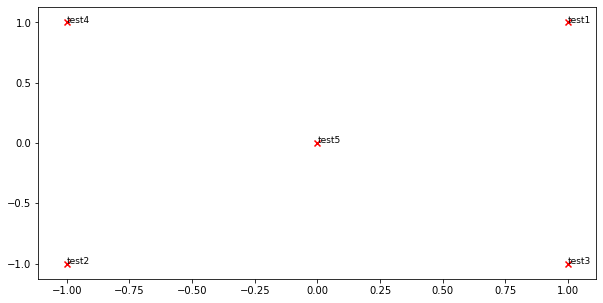

--------------------------------------------------------------------------------


In [125]:
# ---------------------
# Run this sanity check
# Note that this is not an exhaustive check for correctness.
# The plot produced should look like the "test solution plot" depicted below. 
# ---------------------

print ("-" * 80)
print ("Outputted Plot:")

M_reduced_plot_test = np.array([[1, 1], [-1, -1], [1, -1], [-1, 1], [0, 0]])
word2Ind_plot_test = {'test1': 0, 'test2': 1, 'test3': 2, 'test4': 3, 'test5': 4}
words = ['test1', 'test2', 'test3', 'test4', 'test5']
plot_embeddings(M_reduced_plot_test, word2Ind_plot_test, words)

print ("-" * 80)

<font color=red>**Test Plot Solution**</font>
<br>
<img src="./imgs/test_plot.png" width=40% style="float: left;"> </img>


### Question 1.5: Co-Occurrence Plot Analysis [written] (3 points)

Now we will put together all the parts you have written! We will compute the co-occurrence matrix with fixed window of 4 (the default window size), over the Reuters "crude" (oil) corpus. Then we will use TruncatedSVD to compute 2-dimensional embeddings of each word. TruncatedSVD returns U\*S, so we need to normalize the returned vectors, so that all the vectors will appear around the unit circle (therefore closeness is directional closeness). **Note**: The line of code below that does the normalizing uses the NumPy concept of *broadcasting*. If you don't know about broadcasting, check out
[Computation on Arrays: Broadcasting by Jake VanderPlas](https://jakevdp.github.io/PythonDataScienceHandbook/02.05-computation-on-arrays-broadcasting.html).

Run the below cell to produce the plot. It'll probably take a few seconds to run. What clusters together in 2-dimensional embedding space? What doesn't cluster together that you might think should have?  **Note:** "bpd" stands for "barrels per day" and is a commonly used abbreviation in crude oil topic articles.

[['<START>', 'japan', 'to', 'revise', 'long', '-', 'term', 'energy', 'demand', 'downwards', 'the', 'ministry', 'of', 'international', 'trade', 'and', 'industry', '(', 'miti', ')', 'will', 'revise', 'its', 'long', '-', 'term', 'energy', 'supply', '/', 'demand', 'outlook', 'by', 'august', 'to', 'meet', 'a', 'forecast', 'downtrend', 'in', 'japanese', 'energy', 'demand', ',', 'ministry', 'officials', 'said', '.', 'miti', 'is', 'expected', 'to', 'lower', 'the', 'projection', 'for', 'primary', 'energy', 'supplies', 'in', 'the', 'year', '2000', 'to', '550', 'mln', 'kilolitres', '(', 'kl', ')', 'from', '600', 'mln', ',', 'they', 'said', '.', 'the', 'decision', 'follows', 'the', 'emergence', 'of', 'structural', 'changes', 'in', 'japanese', 'industry', 'following', 'the', 'rise', 'in', 'the', 'value', 'of', 'the', 'yen', 'and', 'a', 'decline', 'in', 'domestic', 'electric', 'power', 'demand', '.', 'miti', 'is', 'planning', 'to', 'work', 'out', 'a', 'revised', 'energy', 'supply', '/', 'demand', 'o

grace ['w', '.', 'r', '.', '&', 'lt', ';', 'gra']
& ['.', 'r', '.', 'grace', 'lt', ';', 'gra', '>']
lt ['r', '.', 'grace', '&', ';', 'gra', '>', 'has']
; ['.', 'grace', '&', 'lt', 'gra', '>', 'has', 'divested']
gra ['grace', '&', 'lt', ';', '>', 'has', 'divested', 'its']
> ['&', 'lt', ';', 'gra', 'has', 'divested', 'its', 'retailing']
has ['lt', ';', 'gra', '>', 'divested', 'its', 'retailing', ',']
divested [';', 'gra', '>', 'has', 'its', 'retailing', ',', 'restaurant']
its ['gra', '>', 'has', 'divested', 'retailing', ',', 'restaurant', 'and']
retailing ['>', 'has', 'divested', 'its', ',', 'restaurant', 'and', 'fertilizer']
, ['has', 'divested', 'its', 'retailing', 'restaurant', 'and', 'fertilizer', 'businesses']
restaurant ['divested', 'its', 'retailing', ',', 'and', 'fertilizer', 'businesses', 'to']
and ['its', 'retailing', ',', 'restaurant', 'fertilizer', 'businesses', 'to', 'raise']
fertilizer ['retailing', ',', 'restaurant', 'and', 'businesses', 'to', 'raise', 'cash']
businesses [

killed ['said', 'its', 'troops', 'had', 'or', 'wounded', 'more', 'than']
or ['its', 'troops', 'had', 'killed', 'wounded', 'more', 'than', '4']
wounded ['troops', 'had', 'killed', 'or', 'more', 'than', '4', ',']
more ['had', 'killed', 'or', 'wounded', 'than', '4', ',', '000']
than ['killed', 'or', 'wounded', 'more', '4', ',', '000', 'iraqis']
4 ['or', 'wounded', 'more', 'than', ',', '000', 'iraqis', 'and']
, ['wounded', 'more', 'than', '4', '000', 'iraqis', 'and', 'were']
000 ['more', 'than', '4', ',', 'iraqis', 'and', 'were', 'stabilising']
iraqis ['than', '4', ',', '000', 'and', 'were', 'stabilising', 'their']
and ['4', ',', '000', 'iraqis', 'were', 'stabilising', 'their', 'new']
were [',', '000', 'iraqis', 'and', 'stabilising', 'their', 'new', 'positions']
stabilising ['000', 'iraqis', 'and', 'were', 'their', 'new', 'positions', '.)']
their ['iraqis', 'and', 'were', 'stabilising', 'new', 'positions', '.)', 'the']
new ['and', 'were', 'stabilising', 'their', 'positions', '.)', 'the', '

year ['.', '15', 'mln', 'a', 'earlier', '.', 'gasoline', 'demand']
earlier ['15', 'mln', 'a', 'year', '.', 'gasoline', 'demand', 'averaged']
. ['mln', 'a', 'year', 'earlier', 'gasoline', 'demand', 'averaged', '6']
gasoline ['a', 'year', 'earlier', '.', 'demand', 'averaged', '6', '.']
demand ['year', 'earlier', '.', 'gasoline', 'averaged', '6', '.', '76']
averaged ['earlier', '.', 'gasoline', 'demand', '6', '.', '76', 'mln']
6 ['.', 'gasoline', 'demand', 'averaged', '.', '76', 'mln', 'bpd']
. ['gasoline', 'demand', 'averaged', '6', '76', 'mln', 'bpd', ',']
76 ['demand', 'averaged', '6', '.', 'mln', 'bpd', ',', 'off']
mln ['averaged', '6', '.', '76', 'bpd', ',', 'off', '3']
bpd ['6', '.', '76', 'mln', ',', 'off', '3', '.']
, ['.', '76', 'mln', 'bpd', 'off', '3', '.', '1']
off ['76', 'mln', 'bpd', ',', '3', '.', '1', 'pct']
3 ['mln', 'bpd', ',', 'off', '.', '1', 'pct', 'from']
. ['bpd', ',', 'off', '3', '1', 'pct', 'from', '6']
1 [',', 'off', '3', '.', 'pct', 'from', '6', '.']
pct ['off',

40 ['that', 'would', 'increase', 'to', 'pct', 'by', '1990', '.']
pct ['would', 'increase', 'to', '40', 'by', '1990', '.', '"']
by ['increase', 'to', '40', 'pct', '1990', '.', '"', 'however']
1990 ['to', '40', 'pct', 'by', '.', '"', 'however', ',']
. ['40', 'pct', 'by', '1990', '"', 'however', ',', 'the']
" ['pct', 'by', '1990', '.', 'however', ',', 'the', 'rate']
however ['by', '1990', '.', '"', ',', 'the', 'rate', 'of']
, ['1990', '.', '"', 'however', 'the', 'rate', 'of', 'this']
the ['.', '"', 'however', ',', 'rate', 'of', 'this', 'growth']
rate ['"', 'however', ',', 'the', 'of', 'this', 'growth', 'can']
of ['however', ',', 'the', 'rate', 'this', 'growth', 'can', 'be']
this [',', 'the', 'rate', 'of', 'growth', 'can', 'be', 'affected']
growth ['the', 'rate', 'of', 'this', 'can', 'be', 'affected', 'positively']
can ['rate', 'of', 'this', 'growth', 'be', 'affected', 'positively', 'or']
be ['of', 'this', 'growth', 'can', 'affected', 'positively', 'or', 'negatively']
affected ['this', 'gr

. ['ocean', 'port', 'of', 'temuco', 'the', 'government', 'estimates', 'it']
the ['port', 'of', 'temuco', '.', 'government', 'estimates', 'it', 'will']
government ['of', 'temuco', '.', 'the', 'estimates', 'it', 'will', 'take']
estimates ['temuco', '.', 'the', 'government', 'it', 'will', 'take', 'about']
it ['.', 'the', 'government', 'estimates', 'will', 'take', 'about', 'four']
will ['the', 'government', 'estimates', 'it', 'take', 'about', 'four', 'more']
take ['government', 'estimates', 'it', 'will', 'about', 'four', 'more', 'months']
about ['estimates', 'it', 'will', 'take', 'four', 'more', 'months', 'to']
four ['it', 'will', 'take', 'about', 'more', 'months', 'to', 'repair']
more ['will', 'take', 'about', 'four', 'months', 'to', 'repair', 'the']
months ['take', 'about', 'four', 'more', 'to', 'repair', 'the', 'lago']
to ['about', 'four', 'more', 'months', 'repair', 'the', 'lago', 'agrio']
repair ['four', 'more', 'months', 'to', 'the', 'lago', 'agrio', 'to']
the ['more', 'months', 'to'

to ['if', 'opec', 'was', 'able', 'control', 'production', ',', 'or']
control ['opec', 'was', 'able', 'to', 'production', ',', 'or', 'whether']
production ['was', 'able', 'to', 'control', ',', 'or', 'whether', 'the']
, ['able', 'to', 'control', 'production', 'or', 'whether', 'the', 'days']
or ['to', 'control', 'production', ',', 'whether', 'the', 'days', 'of']
whether ['control', 'production', ',', 'or', 'the', 'days', 'of', 'cheating']
the ['production', ',', 'or', 'whether', 'days', 'of', 'cheating', 'and']
days [',', 'or', 'whether', 'the', 'of', 'cheating', 'and', 'producing']
of ['or', 'whether', 'the', 'days', 'cheating', 'and', 'producing', 'over']
cheating ['whether', 'the', 'days', 'of', 'and', 'producing', 'over', 'quotas']
and ['the', 'days', 'of', 'cheating', 'producing', 'over', 'quotas', 'has']
producing ['days', 'of', 'cheating', 'and', 'over', 'quotas', 'has', 'begun']
over ['of', 'cheating', 'and', 'producing', 'quotas', 'has', 'begun', 'anew']
quotas ['cheating', 'and'

official ['if', 'the', 'sources', 'were', 'or', 'other', 'contacts', '.']
or ['the', 'sources', 'were', 'official', 'other', 'contacts', '.', '"']
other ['sources', 'were', 'official', 'or', 'contacts', '.', '"', 'the']
contacts ['were', 'official', 'or', 'other', '.', '"', 'the', 'sources']
. ['official', 'or', 'other', 'contacts', '"', 'the', 'sources', 'said']
" ['or', 'other', 'contacts', '.', 'the', 'sources', 'said', 'the']
the ['other', 'contacts', '.', '"', 'sources', 'said', 'the', 'credibility']
sources ['contacts', '.', '"', 'the', 'said', 'the', 'credibility', 'of']
said ['.', '"', 'the', 'sources', 'the', 'credibility', 'of', 'opec']
the ['"', 'the', 'sources', 'said', 'credibility', 'of', 'opec', 'would']
credibility ['the', 'sources', 'said', 'the', 'of', 'opec', 'would', 'come']
of ['sources', 'said', 'the', 'credibility', 'opec', 'would', 'come', 'under']
opec ['said', 'the', 'credibility', 'of', 'would', 'come', 'under', 'fresh']
would ['the', 'credibility', 'of', 'op

" ['were', 'less', 'worried', '.', 'the', 'first', 'paid', 'will']
the ['less', 'worried', '.', '"', 'first', 'paid', 'will', 'be']
first ['worried', '.', '"', 'the', 'paid', 'will', 'be', 'the']
paid ['.', '"', 'the', 'first', 'will', 'be', 'the', 'trading']
will ['"', 'the', 'first', 'paid', 'be', 'the', 'trading', 'community']
be ['the', 'first', 'paid', 'will', 'the', 'trading', 'community', 'and']
the ['first', 'paid', 'will', 'be', 'trading', 'community', 'and', 'those']
trading ['paid', 'will', 'be', 'the', 'community', 'and', 'those', 'connected']
community ['will', 'be', 'the', 'trading', 'and', 'those', 'connected', 'with']
and ['be', 'the', 'trading', 'community', 'those', 'connected', 'with', 'texaco']
those ['the', 'trading', 'community', 'and', 'connected', 'with', 'texaco', 'in']
connected ['trading', 'community', 'and', 'those', 'with', 'texaco', 'in', 'the']
with ['community', 'and', 'those', 'connected', 'texaco', 'in', 'the', 'shipping']
texaco ['and', 'those', 'conn

to ['crude', 'and', 'products', 'exports', 'japan', 'to', 'earlier', 'levels']
japan ['and', 'products', 'exports', 'to', 'to', 'earlier', 'levels', ',']
to ['products', 'exports', 'to', 'japan', 'earlier', 'levels', ',', 'but']
earlier ['exports', 'to', 'japan', 'to', 'levels', ',', 'but', 'did']
levels ['to', 'japan', 'to', 'earlier', ',', 'but', 'did', 'not']
, ['japan', 'to', 'earlier', 'levels', 'but', 'did', 'not', 'elaborate']
but ['to', 'earlier', 'levels', ',', 'did', 'not', 'elaborate', '.']
did ['earlier', 'levels', ',', 'but', 'not', 'elaborate', '.', 'to']
not ['levels', ',', 'but', 'did', 'elaborate', '.', 'to', 'promote']
elaborate [',', 'but', 'did', 'not', '.', 'to', 'promote', 'trade']
. ['but', 'did', 'not', 'elaborate', 'to', 'promote', 'trade', ',']
to ['did', 'not', 'elaborate', '.', 'promote', 'trade', ',', 'saudi']
promote ['not', 'elaborate', '.', 'to', 'trade', ',', 'saudi', 'arabia']
trade ['elaborate', '.', 'to', 'promote', ',', 'saudi', 'arabia', 'is']
, ['

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



. ['agencies', ',"', 'he', 'said', 'larger', 'companies', 'are', 'also']
larger [',"', 'he', 'said', '.', 'companies', 'are', 'also', 'streamlining']
companies ['he', 'said', '.', 'larger', 'are', 'also', 'streamlining', '.']
are ['said', '.', 'larger', 'companies', 'also', 'streamlining', '.', 'nippon']
also ['.', 'larger', 'companies', 'are', 'streamlining', '.', 'nippon', 'oil']
streamlining ['larger', 'companies', 'are', 'also', '.', 'nippon', 'oil', 'co']
. ['companies', 'are', 'also', 'streamlining', 'nippon', 'oil', 'co', 'ltd']
nippon ['are', 'also', 'streamlining', '.', 'oil', 'co', 'ltd', 'which']
oil ['also', 'streamlining', '.', 'nippon', 'co', 'ltd', 'which', 'had']
co ['streamlining', '.', 'nippon', 'oil', 'ltd', 'which', 'had', 'the']
ltd ['.', 'nippon', 'oil', 'co', 'which', 'had', 'the', 'largest']
which ['nippon', 'oil', 'co', 'ltd', 'had', 'the', 'largest', 'share']
had ['oil', 'co', 'ltd', 'which', 'the', 'largest', 'share', 'of']
the ['co', 'ltd', 'which', 'had', '

for ['find', 'alternative', 'sources', '(', 'energy', ')."', 'opec', 'agreed']
energy ['alternative', 'sources', '(', 'for', ')."', 'opec', 'agreed', 'last']
)." ['sources', '(', 'for', 'energy', 'opec', 'agreed', 'last', 'december']
opec ['(', 'for', 'energy', ')."', 'agreed', 'last', 'december', 'to']
agreed ['for', 'energy', ')."', 'opec', 'last', 'december', 'to', 'cut']
last ['energy', ')."', 'opec', 'agreed', 'december', 'to', 'cut', 'production']
december [')."', 'opec', 'agreed', 'last', 'to', 'cut', 'production', 'after']
to ['opec', 'agreed', 'last', 'december', 'cut', 'production', 'after', 'world']
cut ['agreed', 'last', 'december', 'to', 'production', 'after', 'world', 'prices']
production ['last', 'december', 'to', 'cut', 'after', 'world', 'prices', 'hit']
after ['december', 'to', 'cut', 'production', 'world', 'prices', 'hit', 'new']
world ['to', 'cut', 'production', 'after', 'prices', 'hit', 'new', 'lows']
prices ['cut', 'production', 'after', 'world', 'hit', 'new', 'low

<START> ['energy', 'secretary', 'sees', 'higher']
energy ['secretary', 'sees', 'higher', 'oil']
secretary ['sees', 'higher', 'oil', 'prices']
sees ['higher', 'oil', 'prices', 'energy']
higher ['<START>', 'energy', 'secretary', 'sees', 'oil', 'prices', 'energy', 'secretary']
oil ['energy', 'secretary', 'sees', 'higher', 'prices', 'energy', 'secretary', 'donald']
prices ['secretary', 'sees', 'higher', 'oil', 'energy', 'secretary', 'donald', 'hodel']
energy ['sees', 'higher', 'oil', 'prices', 'secretary', 'donald', 'hodel', 'said']
secretary ['higher', 'oil', 'prices', 'energy', 'donald', 'hodel', 'said', 'he']
donald ['oil', 'prices', 'energy', 'secretary', 'hodel', 'said', 'he', 'expects']
hodel ['prices', 'energy', 'secretary', 'donald', 'said', 'he', 'expects', 'oil']
said ['energy', 'secretary', 'donald', 'hodel', 'he', 'expects', 'oil', 'prices']
he ['secretary', 'donald', 'hodel', 'said', 'expects', 'oil', 'prices', 'to']
expects ['donald', 'hodel', 'said', 'he', 'oil', 'prices', '

u ['will', 'continue', 'to', 'raise', '.', 's', '.', 'oil']
. ['continue', 'to', 'raise', 'u', 's', '.', 'oil', 'prices']
s ['to', 'raise', 'u', '.', '.', 'oil', 'prices', '.']
. ['raise', 'u', '.', 's', 'oil', 'prices', '.', 'monday']
oil ['u', '.', 's', '.', 'prices', '.', 'monday', ',']
prices ['.', 's', '.', 'oil', '.', 'monday', ',', 'after']
. ['s', '.', 'oil', 'prices', 'monday', ',', 'after', 'texaco']
monday ['.', 'oil', 'prices', '.', ',', 'after', 'texaco', 'confirmed']
, ['oil', 'prices', '.', 'monday', 'after', 'texaco', 'confirmed', 'that']
after ['prices', '.', 'monday', ',', 'texaco', 'confirmed', 'that', 'the']
texaco ['.', 'monday', ',', 'after', 'confirmed', 'that', 'the', 'pipeline']
confirmed ['monday', ',', 'after', 'texaco', 'that', 'the', 'pipeline', 'had']
that [',', 'after', 'texaco', 'confirmed', 'the', 'pipeline', 'had', 'been']
the ['after', 'texaco', 'confirmed', 'that', 'pipeline', 'had', 'been', 'closed']
pipeline ['texaco', 'confirmed', 'that', 'the', '

not ['have', 'said', 'that', 'would', 'be', 'in', 'the', 'interests']
be ['said', 'that', 'would', 'not', 'in', 'the', 'interests', 'of']
in ['that', 'would', 'not', 'be', 'the', 'interests', 'of', 'the']
the ['would', 'not', 'be', 'in', 'interests', 'of', 'the', 'arabian']
interests ['not', 'be', 'in', 'the', 'of', 'the', 'arabian', 'peninsula']
of ['be', 'in', 'the', 'interests', 'the', 'arabian', 'peninsula', '."']
the ['in', 'the', 'interests', 'of', 'arabian', 'peninsula', '."', '<END>']
arabian ['the', 'interests', 'of', 'the', 'peninsula', '."', '<END>']
peninsula ['interests', 'of', 'the', 'arabian', '."', '<END>']
." ['of', 'the', 'arabian', 'peninsula', '<END>']
<END> ['the', 'arabian', 'peninsula', '."']
<START> ['colombian', 'group', 'suspends', 'bombings']
colombian ['group', 'suspends', 'bombings', 'of']
group ['suspends', 'bombings', 'of', 'pipelines']
suspends ['bombings', 'of', 'pipelines', 'a']
bombings ['<START>', 'colombian', 'group', 'suspends', 'of', 'pipelines', 

supplies ['companies', 'that', 'crude', 'oil', 'will', 'be', '40', 'pct']
will ['that', 'crude', 'oil', 'supplies', 'be', '40', 'pct', 'less']
be ['crude', 'oil', 'supplies', 'will', '40', 'pct', 'less', 'than']
40 ['oil', 'supplies', 'will', 'be', 'pct', 'less', 'than', 'contractual']
pct ['supplies', 'will', 'be', '40', 'less', 'than', 'contractual', 'volumes']
less ['will', 'be', '40', 'pct', 'than', 'contractual', 'volumes', 'in']
than ['be', '40', 'pct', 'less', 'contractual', 'volumes', 'in', 'july']
contractual ['40', 'pct', 'less', 'than', 'volumes', 'in', 'july', ',']
volumes ['pct', 'less', 'than', 'contractual', 'in', 'july', ',', 'a']
in ['less', 'than', 'contractual', 'volumes', 'july', ',', 'a', 'spokesman']
july ['than', 'contractual', 'volumes', 'in', ',', 'a', 'spokesman', 'for']
, ['contractual', 'volumes', 'in', 'july', 'a', 'spokesman', 'for', 'an']
a ['volumes', 'in', 'july', ',', 'spokesman', 'for', 'an', 'affiliated']
spokesman ['in', 'july', ',', 'a', 'for', 'an

gasoline ['nigeria', 'especially', 'found', 'its', '-', 'rich', 'bonny', 'light']
- ['especially', 'found', 'its', 'gasoline', 'rich', 'bonny', 'light', 'crude']
rich ['found', 'its', 'gasoline', '-', 'bonny', 'light', 'crude', '--']
bonny ['its', 'gasoline', '-', 'rich', 'light', 'crude', '--', 'now']
light ['gasoline', '-', 'rich', 'bonny', 'crude', '--', 'now', 'opec']
crude ['-', 'rich', 'bonny', 'light', '--', 'now', 'opec', "'"]
-- ['rich', 'bonny', 'light', 'crude', 'now', 'opec', "'", 's']
now ['bonny', 'light', 'crude', '--', 'opec', "'", 's', 'highest']
opec ['light', 'crude', '--', 'now', "'", 's', 'highest', 'priced']
' ['crude', '--', 'now', 'opec', 's', 'highest', 'priced', 'grade']
s ['--', 'now', 'opec', "'", 'highest', 'priced', 'grade', 'at']
highest ['now', 'opec', "'", 's', 'priced', 'grade', 'at', '18']
priced ['opec', "'", 's', 'highest', 'grade', 'at', '18', '.']
grade ["'", 's', 'highest', 'priced', 'at', '18', '.', '92']
at ['s', 'highest', 'priced', 'grade', '

postings ['corp', 'raised', 'crude', 'oil', '50', 'cts', '/', 'bbl']
50 ['raised', 'crude', 'oil', 'postings', 'cts', '/', 'bbl', ',']
cts ['crude', 'oil', 'postings', '50', '/', 'bbl', ',', 'wti']
/ ['oil', 'postings', '50', 'cts', 'bbl', ',', 'wti', 'now']
bbl ['postings', '50', 'cts', '/', ',', 'wti', 'now', '19']
, ['50', 'cts', '/', 'bbl', 'wti', 'now', '19', 'dlrs']
wti ['cts', '/', 'bbl', ',', 'now', '19', 'dlrs', '/']
now ['/', 'bbl', ',', 'wti', '19', 'dlrs', '/', 'bbl']
19 ['bbl', ',', 'wti', 'now', 'dlrs', '/', 'bbl', 'southland']
dlrs [',', 'wti', 'now', '19', '/', 'bbl', 'southland', 'corp']
/ ['wti', 'now', '19', 'dlrs', 'bbl', 'southland', 'corp', 'raised']
bbl ['now', '19', 'dlrs', '/', 'southland', 'corp', 'raised', 'crude']
southland ['19', 'dlrs', '/', 'bbl', 'corp', 'raised', 'crude', 'oil']
corp ['dlrs', '/', 'bbl', 'southland', 'raised', 'crude', 'oil', 'postings']
raised ['/', 'bbl', 'southland', 'corp', 'crude', 'oil', 'postings', '50']
crude ['bbl', 'southland'

corporation ['were', 'not', 'deductible', 'from', 'tax', 'payable', '.', 'it']
tax ['not', 'deductible', 'from', 'corporation', 'payable', '.', 'it', 'would']
payable ['deductible', 'from', 'corporation', 'tax', '.', 'it', 'would', 'have']
. ['from', 'corporation', 'tax', 'payable', 'it', 'would', 'have', 'been']
it ['corporation', 'tax', 'payable', '.', 'would', 'have', 'been', 'a']
would ['tax', 'payable', '.', 'it', 'have', 'been', 'a', 'bonus']
have ['payable', '.', 'it', 'would', 'been', 'a', 'bonus', 'if']
been ['.', 'it', 'would', 'have', 'a', 'bonus', 'if', 'the']
a ['it', 'would', 'have', 'been', 'bonus', 'if', 'the', 'company']
bonus ['would', 'have', 'been', 'a', 'if', 'the', 'company', 'had']
if ['have', 'been', 'a', 'bonus', 'the', 'company', 'had', 'won']
the ['been', 'a', 'bonus', 'if', 'company', 'had', 'won', 'but']
company ['a', 'bonus', 'if', 'the', 'had', 'won', 'but', 'all']
had ['bonus', 'if', 'the', 'company', 'won', 'but', 'all', 'budgeting']
won ['if', 'the', '

of ['were', 'in', 'three', 'parcels', '120', ',', '000', 'tonnes']
120 ['in', 'three', 'parcels', 'of', ',', '000', 'tonnes', 'each']
, ['three', 'parcels', 'of', '120', '000', 'tonnes', 'each', 'and']
000 ['parcels', 'of', '120', ',', 'tonnes', 'each', 'and', 'four']
tonnes ['of', '120', ',', '000', 'each', 'and', 'four', 'of']
each ['120', ',', '000', 'tonnes', 'and', 'four', 'of', '30']
and [',', '000', 'tonnes', 'each', 'four', 'of', '30', ',']
four ['000', 'tonnes', 'each', 'and', 'of', '30', ',', '000']
of ['tonnes', 'each', 'and', 'four', '30', ',', '000', 'tonnes']
30 ['each', 'and', 'four', 'of', ',', '000', 'tonnes', 'each']
, ['and', 'four', 'of', '30', '000', 'tonnes', 'each', '.']
000 ['four', 'of', '30', ',', 'tonnes', 'each', '.', 'cpc']
tonnes ['of', '30', ',', '000', 'each', '.', 'cpc', 'officials']
each ['30', ',', '000', 'tonnes', '.', 'cpc', 'officials', 'also']
. [',', '000', 'tonnes', 'each', 'cpc', 'officials', 'also', 'said']
cpc ['000', 'tonnes', 'each', '.', '

gains ['position', 'to', 'strengthen', 'the', 'we', 'have', 'made', 'so']
we ['to', 'strengthen', 'the', 'gains', 'have', 'made', 'so', 'far']
have ['strengthen', 'the', 'gains', 'we', 'made', 'so', 'far', ',"']
made ['the', 'gains', 'we', 'have', 'so', 'far', ',"', 'lukman']
so ['gains', 'we', 'have', 'made', 'far', ',"', 'lukman', 'said']
far ['we', 'have', 'made', 'so', ',"', 'lukman', 'said', '.']
," ['have', 'made', 'so', 'far', 'lukman', 'said', '.', 'he']
lukman ['made', 'so', 'far', ',"', 'said', '.', 'he', 'declined']
said ['so', 'far', ',"', 'lukman', '.', 'he', 'declined', 'to']
. ['far', ',"', 'lukman', 'said', 'he', 'declined', 'to', 'say']
he [',"', 'lukman', 'said', '.', 'declined', 'to', 'say', 'if']
declined ['lukman', 'said', '.', 'he', 'to', 'say', 'if', 'the']
to ['said', '.', 'he', 'declined', 'say', 'if', 'the', 'current']
say ['.', 'he', 'declined', 'to', 'if', 'the', 'current', 'ceiling']
if ['he', 'declined', 'to', 'say', 'the', 'current', 'ceiling', 'should']


- ['in', 'september', 'to', 're', 'evaluate', 'market', 'conditions', '.']
evaluate ['september', 'to', 're', '-', 'market', 'conditions', '.', 'overproduction']
market ['to', 're', '-', 'evaluate', 'conditions', '.', 'overproduction', 'by']
conditions ['re', '-', 'evaluate', 'market', '.', 'overproduction', 'by', 'opec']
. ['-', 'evaluate', 'market', 'conditions', 'overproduction', 'by', 'opec', 'will']
overproduction ['evaluate', 'market', 'conditions', '.', 'by', 'opec', 'will', 'become']
by ['market', 'conditions', '.', 'overproduction', 'opec', 'will', 'become', 'a']
opec ['conditions', '.', 'overproduction', 'by', 'will', 'become', 'a', 'real']
will ['.', 'overproduction', 'by', 'opec', 'become', 'a', 'real', 'problem']
become ['overproduction', 'by', 'opec', 'will', 'a', 'real', 'problem', 'in']
a ['by', 'opec', 'will', 'become', 'real', 'problem', 'in', 'the']
real ['opec', 'will', 'become', 'a', 'problem', 'in', 'the', 'fourth']
problem ['will', 'become', 'a', 'real', 'in', 't

worked ['reflagging', 'arrangement', 'that', 'we', 'out', 'with', 'the', 'kuwaitis']
out ['arrangement', 'that', 'we', 'worked', 'with', 'the', 'kuwaitis', '."']
with ['that', 'we', 'worked', 'out', 'the', 'kuwaitis', '."', 'in']
the ['we', 'worked', 'out', 'with', 'kuwaitis', '."', 'in', 'both']
kuwaitis ['worked', 'out', 'with', 'the', '."', 'in', 'both', 'cases']
." ['out', 'with', 'the', 'kuwaitis', 'in', 'both', 'cases', ',']
in ['with', 'the', 'kuwaitis', '."', 'both', 'cases', ',', 'the']
both ['the', 'kuwaitis', '."', 'in', 'cases', ',', 'the', 'ships']
cases ['kuwaitis', '."', 'in', 'both', ',', 'the', 'ships', 'would']
, ['."', 'in', 'both', 'cases', 'the', 'ships', 'would', 'be']
the ['in', 'both', 'cases', ',', 'ships', 'would', 'be', 'eligible']
ships ['both', 'cases', ',', 'the', 'would', 'be', 'eligible', 'for']
would ['cases', ',', 'the', 'ships', 'be', 'eligible', 'for', 'u']
be [',', 'the', 'ships', 'would', 'eligible', 'for', 'u', '.']
eligible ['the', 'ships', 'woul

the ['for', 'the', 'rest', 'of', 'year', 'should', 'boost', 'spot']
year ['the', 'rest', 'of', 'the', 'should', 'boost', 'spot', 'prices']
should ['rest', 'of', 'the', 'year', 'boost', 'spot', 'prices', 'and']
boost ['of', 'the', 'year', 'should', 'spot', 'prices', 'and', 'enable']
spot ['the', 'year', 'should', 'boost', 'prices', 'and', 'enable', 'the']
prices ['year', 'should', 'boost', 'spot', 'and', 'enable', 'the', 'group']
and ['should', 'boost', 'spot', 'prices', 'enable', 'the', 'group', 'to']
enable ['boost', 'spot', 'prices', 'and', 'the', 'group', 'to', 'raise']
the ['spot', 'prices', 'and', 'enable', 'group', 'to', 'raise', 'its']
group ['prices', 'and', 'enable', 'the', 'to', 'raise', 'its', 'official']
to ['and', 'enable', 'the', 'group', 'raise', 'its', 'official', 'reference']
raise ['enable', 'the', 'group', 'to', 'its', 'official', 'reference', 'price']
its ['the', 'group', 'to', 'raise', 'official', 'reference', 'price', 'to']
official ['group', 'to', 'raise', 'its',

research ['who', 'earlier', 'ran', 'a', 'center', 'at', 'saudi', 'arabia']
center ['earlier', 'ran', 'a', 'research', 'at', 'saudi', 'arabia', "'"]
at ['ran', 'a', 'research', 'center', 'saudi', 'arabia', "'", 's']
saudi ['a', 'research', 'center', 'at', 'arabia', "'", 's', 'university']
arabia ['research', 'center', 'at', 'saudi', "'", 's', 'university', 'of']
' ['center', 'at', 'saudi', 'arabia', 's', 'university', 'of', 'petroleum']
s ['at', 'saudi', 'arabia', "'", 'university', 'of', 'petroleum', 'and']
university ['saudi', 'arabia', "'", 's', 'of', 'petroleum', 'and', 'minerals']
of ['arabia', "'", 's', 'university', 'petroleum', 'and', 'minerals', ',']
petroleum ["'", 's', 'university', 'of', 'and', 'minerals', ',', 'and']
and ['s', 'university', 'of', 'petroleum', 'minerals', ',', 'and', 'former']
minerals ['university', 'of', 'petroleum', 'and', ',', 'and', 'former', 'deputy']
, ['of', 'petroleum', 'and', 'minerals', 'and', 'former', 'deputy', 'planning']
and ['petroleum', 'and

into ['(', 'bpd', '),', 'distributed', 'the', 'same', 'national', 'production']
the ['bpd', '),', 'distributed', 'into', 'same', 'national', 'production', 'levels']
same ['),', 'distributed', 'into', 'the', 'national', 'production', 'levels', 'as']
national ['distributed', 'into', 'the', 'same', 'production', 'levels', 'as', 'were']
production ['into', 'the', 'same', 'national', 'levels', 'as', 'were', 'defined']
levels ['the', 'same', 'national', 'production', 'as', 'were', 'defined', 'by']
as ['same', 'national', 'production', 'levels', 'were', 'defined', 'by', 'the']
were ['national', 'production', 'levels', 'as', 'defined', 'by', 'the', 'above']
defined ['production', 'levels', 'as', 'were', 'by', 'the', 'above', '-']
by ['levels', 'as', 'were', 'defined', 'the', 'above', '-', 'mentioned']
the ['as', 'were', 'defined', 'by', 'above', '-', 'mentioned', 'agreement']
above ['were', 'defined', 'by', 'the', '-', 'mentioned', 'agreement', 'for']
- ['defined', 'by', 'the', 'above', 'menti

. ['medium', 'to', 'heavy', 'grades', 'opec', 'reintroduced', 'fixed', 'prices']
opec ['to', 'heavy', 'grades', '.', 'reintroduced', 'fixed', 'prices', 'on']
reintroduced ['heavy', 'grades', '.', 'opec', 'fixed', 'prices', 'on', 'february']
fixed ['grades', '.', 'opec', 'reintroduced', 'prices', 'on', 'february', '1']
prices ['.', 'opec', 'reintroduced', 'fixed', 'on', 'february', '1', ',']
on ['opec', 'reintroduced', 'fixed', 'prices', 'february', '1', ',', 'with']
february ['reintroduced', 'fixed', 'prices', 'on', '1', ',', 'with', 'a']
1 ['fixed', 'prices', 'on', 'february', ',', 'with', 'a', 'spread']
, ['prices', 'on', 'february', '1', 'with', 'a', 'spread', 'of']
with ['on', 'february', '1', ',', 'a', 'spread', 'of', '2']
a ['february', '1', ',', 'with', 'spread', 'of', '2', '.']
spread ['1', ',', 'with', 'a', 'of', '2', '.', '65']
of [',', 'with', 'a', 'spread', '2', '.', '65', 'dlrs']
2 ['with', 'a', 'spread', 'of', '.', '65', 'dlrs', 'a']
. ['a', 'spread', 'of', '2', '65', 'dl

potential ['europe', 'and', 'asia', 'were', 'trouble', '-', 'spots', ',']
trouble ['and', 'asia', 'were', 'potential', '-', 'spots', ',', 'and']
- ['asia', 'were', 'potential', 'trouble', 'spots', ',', 'and', 'kuwait']
spots ['were', 'potential', 'trouble', '-', ',', 'and', 'kuwait', 'was']
, ['potential', 'trouble', '-', 'spots', 'and', 'kuwait', 'was', 'one']
and ['trouble', '-', 'spots', ',', 'kuwait', 'was', 'one', 'of']
kuwait ['-', 'spots', ',', 'and', 'was', 'one', 'of', 'the']
was ['spots', ',', 'and', 'kuwait', 'one', 'of', 'the', 'most']
one [',', 'and', 'kuwait', 'was', 'of', 'the', 'most', 'obvious']
of ['and', 'kuwait', 'was', 'one', 'the', 'most', 'obvious', 'targets']
the ['kuwait', 'was', 'one', 'of', 'most', 'obvious', 'targets', '.']
most ['was', 'one', 'of', 'the', 'obvious', 'targets', '.', 'any']
obvious ['one', 'of', 'the', 'most', 'targets', '.', 'any', 'backlash']
targets ['of', 'the', 'most', 'obvious', '.', 'any', 'backlash', 'was']
. ['the', 'most', 'obvious'

of ['economic', 'and', 'financial', 'strength', 'the', 'petroleum', 'industry', '."']
the ['and', 'financial', 'strength', 'of', 'petroleum', 'industry', '."', 'he']
petroleum ['financial', 'strength', 'of', 'the', 'industry', '."', 'he', 'said']
industry ['strength', 'of', 'the', 'petroleum', '."', 'he', 'said', 'the']
." ['of', 'the', 'petroleum', 'industry', 'he', 'said', 'the', 'new']
he ['the', 'petroleum', 'industry', '."', 'said', 'the', 'new', 'exchange']
said ['petroleum', 'industry', '."', 'he', 'the', 'new', 'exchange', 'rate']
the ['industry', '."', 'he', 'said', 'new', 'exchange', 'rate', ',']
new ['."', 'he', 'said', 'the', 'exchange', 'rate', ',', 'which']
exchange ['he', 'said', 'the', 'new', 'rate', ',', 'which', 'goes']
rate ['said', 'the', 'new', 'exchange', ',', 'which', 'goes', 'before']
, ['the', 'new', 'exchange', 'rate', 'which', 'goes', 'before', 'the']
which ['new', 'exchange', 'rate', ',', 'goes', 'before', 'the', 'central']
goes ['exchange', 'rate', ',', 'wh

had ['free', 'and', 'safe', 'navigation', 'increased', 'after', 'the', 'missile']
increased ['and', 'safe', 'navigation', 'had', 'after', 'the', 'missile', 'attack']
after ['safe', 'navigation', 'had', 'increased', 'the', 'missile', 'attack', 'on']
the ['navigation', 'had', 'increased', 'after', 'missile', 'attack', 'on', 'a']
missile ['had', 'increased', 'after', 'the', 'attack', 'on', 'a', 'u']
attack ['increased', 'after', 'the', 'missile', 'on', 'a', 'u', '.']
on ['after', 'the', 'missile', 'attack', 'a', 'u', '.', 's']
a ['the', 'missile', 'attack', 'on', 'u', '.', 's', '.-']
u ['missile', 'attack', 'on', 'a', '.', 's', '.-', 'flagged']
. ['attack', 'on', 'a', 'u', 's', '.-', 'flagged', 'tanker']
s ['on', 'a', 'u', '.', '.-', 'flagged', 'tanker', 'in']
.- ['a', 'u', '.', 's', 'flagged', 'tanker', 'in', 'kuwaiti']
flagged ['u', '.', 's', '.-', 'tanker', 'in', 'kuwaiti', 'territorial']
tanker ['.', 's', '.-', 'flagged', 'in', 'kuwaiti', 'territorial', 'waters']
in ['s', '.-', 'flagg

neutral ['to', 'track', 'and', 'assault', 'gulf', 'shipping', '.', '<END>']
gulf ['track', 'and', 'assault', 'neutral', 'shipping', '.', '<END>']
shipping ['and', 'assault', 'neutral', 'gulf', '.', '<END>']
. ['assault', 'neutral', 'gulf', 'shipping', '<END>']
<END> ['neutral', 'gulf', 'shipping', '.']
<START> ['indonesia', 'finds', 'new', 'offshore']
indonesia ['finds', 'new', 'offshore', 'oil']
finds ['new', 'offshore', 'oil', 'and']
new ['offshore', 'oil', 'and', 'gas']
offshore ['<START>', 'indonesia', 'finds', 'new', 'oil', 'and', 'gas', 'resources']
oil ['indonesia', 'finds', 'new', 'offshore', 'and', 'gas', 'resources', 'the']
and ['finds', 'new', 'offshore', 'oil', 'gas', 'resources', 'the', 'indonesian']
gas ['new', 'offshore', 'oil', 'and', 'resources', 'the', 'indonesian', 'state']
resources ['offshore', 'oil', 'and', 'gas', 'the', 'indonesian', 'state', '-']
the ['oil', 'and', 'gas', 'resources', 'indonesian', 'state', '-', 'owned']
indonesian ['and', 'gas', 'resources', 't

at ['.', 's', '.', 'raid', 'about', '500', 'mln', 'dlrs']
about ['s', '.', 'raid', 'at', '500', 'mln', 'dlrs', '.']
500 ['.', 'raid', 'at', 'about', 'mln', 'dlrs', '.', 'the']
mln ['raid', 'at', 'about', '500', 'dlrs', '.', 'the', 'rigs']
dlrs ['at', 'about', '500', 'mln', '.', 'the', 'rigs', ',']
. ['about', '500', 'mln', 'dlrs', 'the', 'rigs', ',', 'one']
the ['500', 'mln', 'dlrs', '.', 'rigs', ',', 'one', 'of']
rigs ['mln', 'dlrs', '.', 'the', ',', 'one', 'of', 'which']
, ['dlrs', '.', 'the', 'rigs', 'one', 'of', 'which', 'was']
one ['.', 'the', 'rigs', ',', 'of', 'which', 'was', 'heavily']
of ['the', 'rigs', ',', 'one', 'which', 'was', 'heavily', 'shelled']
which ['rigs', ',', 'one', 'of', 'was', 'heavily', 'shelled', 'by']
was [',', 'one', 'of', 'which', 'heavily', 'shelled', 'by', 'four']
heavily ['one', 'of', 'which', 'was', 'shelled', 'by', 'four', 'american']
shelled ['of', 'which', 'was', 'heavily', 'by', 'four', 'american', 'destroyers']
by ['which', 'was', 'heavily', 'shell

the ['said', 'test', 'output', 'at', 'field', 'from', 'the', 'mobile']
field ['test', 'output', 'at', 'the', 'from', 'the', 'mobile', 'production']
from ['output', 'at', 'the', 'field', 'the', 'mobile', 'production', 'ship']
the ['at', 'the', 'field', 'from', 'mobile', 'production', 'ship', 'petro']
mobile ['the', 'field', 'from', 'the', 'production', 'ship', 'petro', 'jarl']
production ['field', 'from', 'the', 'mobile', 'ship', 'petro', 'jarl', 'totalled']
ship ['from', 'the', 'mobile', 'production', 'petro', 'jarl', 'totalled', '1']
petro ['the', 'mobile', 'production', 'ship', 'jarl', 'totalled', '1', ',']
jarl ['mobile', 'production', 'ship', 'petro', 'totalled', '1', ',', '719']
totalled ['production', 'ship', 'petro', 'jarl', '1', ',', '719', 'bpd']
1 ['ship', 'petro', 'jarl', 'totalled', ',', '719', 'bpd', 'last']
, ['petro', 'jarl', 'totalled', '1', '719', 'bpd', 'last', 'month']
719 ['jarl', 'totalled', '1', ',', 'bpd', 'last', 'month', ',']
bpd ['totalled', '1', ',', '719', '

industry ['upsurge', 'in', 'the', 'oil', 'after', 'three', 'years', 'of']
after ['in', 'the', 'oil', 'industry', 'three', 'years', 'of', 'stagnation']
three ['the', 'oil', 'industry', 'after', 'years', 'of', 'stagnation', 'which']
years ['oil', 'industry', 'after', 'three', 'of', 'stagnation', 'which', 'began']
of ['industry', 'after', 'three', 'years', 'stagnation', 'which', 'began', 'in']
stagnation ['after', 'three', 'years', 'of', 'which', 'began', 'in', 'late']
which ['three', 'years', 'of', 'stagnation', 'began', 'in', 'late', '1983']
began ['years', 'of', 'stagnation', 'which', 'in', 'late', '1983', '.']
in ['of', 'stagnation', 'which', 'began', 'late', '1983', '.', 'last']
late ['stagnation', 'which', 'began', 'in', '1983', '.', 'last', 'year']
1983 ['which', 'began', 'in', 'late', '.', 'last', 'year', 'the']
. ['began', 'in', 'late', '1983', 'last', 'year', 'the', 'soviet']
last ['in', 'late', '1983', '.', 'year', 'the', 'soviet', 'union']
year ['late', '1983', '.', 'last', 't

it ['prices', 'amoco', 'corp', 'said', 'raised', 'the', 'contract', 'price']
raised ['amoco', 'corp', 'said', 'it', 'the', 'contract', 'price', 'it']
the ['corp', 'said', 'it', 'raised', 'contract', 'price', 'it', 'will']
contract ['said', 'it', 'raised', 'the', 'price', 'it', 'will', 'pay']
price ['it', 'raised', 'the', 'contract', 'it', 'will', 'pay', 'for']
it ['raised', 'the', 'contract', 'price', 'will', 'pay', 'for', 'most']
will ['the', 'contract', 'price', 'it', 'pay', 'for', 'most', 'grades']
pay ['contract', 'price', 'it', 'will', 'for', 'most', 'grades', 'of']
for ['price', 'it', 'will', 'pay', 'most', 'grades', 'of', 'crude']
most ['it', 'will', 'pay', 'for', 'grades', 'of', 'crude', 'oil']
grades ['will', 'pay', 'for', 'most', 'of', 'crude', 'oil', 'by']
of ['pay', 'for', 'most', 'grades', 'crude', 'oil', 'by', '50']
crude ['for', 'most', 'grades', 'of', 'oil', 'by', '50', 'cts']
oil ['most', 'grades', 'of', 'crude', 'by', '50', 'cts', 'a']
by ['grades', 'of', 'crude', 'oi

no ['on', 'tuesday', 'but', 'caused', 'casualties', ',', 'the', 'kuwait']
casualties ['tuesday', 'but', 'caused', 'no', ',', 'the', 'kuwait', 'news']
, ['but', 'caused', 'no', 'casualties', 'the', 'kuwait', 'news', 'agency']
the ['caused', 'no', 'casualties', ',', 'kuwait', 'news', 'agency', 'kuna']
kuwait ['no', 'casualties', ',', 'the', 'news', 'agency', 'kuna', 'said']
news ['casualties', ',', 'the', 'kuwait', 'agency', 'kuna', 'said', ',']
agency [',', 'the', 'kuwait', 'news', 'kuna', 'said', ',', 'quoting']
kuna ['the', 'kuwait', 'news', 'agency', 'said', ',', 'quoting', 'a']
said ['kuwait', 'news', 'agency', 'kuna', ',', 'quoting', 'a', 'defense']
, ['news', 'agency', 'kuna', 'said', 'quoting', 'a', 'defense', 'ministry']
quoting ['agency', 'kuna', 'said', ',', 'a', 'defense', 'ministry', 'official']
a ['kuna', 'said', ',', 'quoting', 'defense', 'ministry', 'official', '.']
defense ['said', ',', 'quoting', 'a', 'ministry', 'official', '.', 'there']
ministry [',', 'quoting', 'a', 

invoked ['attack', 'the', 'united', 'states', 'the', 'right', 'of', 'self']
the ['the', 'united', 'states', 'invoked', 'right', 'of', 'self', '-']
right ['united', 'states', 'invoked', 'the', 'of', 'self', '-', 'defense']
of ['states', 'invoked', 'the', 'right', 'self', '-', 'defense', 'in']
self ['invoked', 'the', 'right', 'of', '-', 'defense', 'in', 'destroying']
- ['the', 'right', 'of', 'self', 'defense', 'in', 'destroying', 'an']
defense ['right', 'of', 'self', '-', 'in', 'destroying', 'an', 'iranian']
in ['of', 'self', '-', 'defense', 'destroying', 'an', 'iranian', 'oil']
destroying ['self', '-', 'defense', 'in', 'an', 'iranian', 'oil', 'platform']
an ['-', 'defense', 'in', 'destroying', 'iranian', 'oil', 'platform', 'in']
iranian ['defense', 'in', 'destroying', 'an', 'oil', 'platform', 'in', 'the']
oil ['in', 'destroying', 'an', 'iranian', 'platform', 'in', 'the', 'gulf']
platform ['destroying', 'an', 'iranian', 'oil', 'in', 'the', 'gulf', ',']
in ['an', 'iranian', 'oil', 'platfo

oil ['on', 'an', 'abandoned', 'iranian', 'rig', 'on', 'monday', 'which']
rig ['an', 'abandoned', 'iranian', 'oil', 'on', 'monday', 'which', 'tehran']
on ['abandoned', 'iranian', 'oil', 'rig', 'monday', 'which', 'tehran', 'vowed']
monday ['iranian', 'oil', 'rig', 'on', 'which', 'tehran', 'vowed', 'to']
which ['oil', 'rig', 'on', 'monday', 'tehran', 'vowed', 'to', 'avenge']
tehran ['rig', 'on', 'monday', 'which', 'vowed', 'to', 'avenge', '.']
vowed ['on', 'monday', 'which', 'tehran', 'to', 'avenge', '.', '<END>']
to ['monday', 'which', 'tehran', 'vowed', 'avenge', '.', '<END>']
avenge ['which', 'tehran', 'vowed', 'to', '.', '<END>']
. ['tehran', 'vowed', 'to', 'avenge', '<END>']
<END> ['vowed', 'to', 'avenge', '.']
<START> ['unocal', '&', 'lt', ';']
unocal ['&', 'lt', ';', 'ucl']
& ['lt', ';', 'ucl', '>']
lt [';', 'ucl', '>', 'raises']
; ['<START>', 'unocal', '&', 'lt', 'ucl', '>', 'raises', 'crude']
ucl ['unocal', '&', 'lt', ';', '>', 'raises', 'crude', 'oil']
> ['&', 'lt', ';', 'ucl', 

meeting ['in', 'luxembourg', 'during', 'a', 'of', 'european', 'community', '(']
of ['luxembourg', 'during', 'a', 'meeting', 'european', 'community', '(', 'ec']
european ['during', 'a', 'meeting', 'of', 'community', '(', 'ec', ')']
community ['a', 'meeting', 'of', 'european', '(', 'ec', ')', 'ministers']
( ['meeting', 'of', 'european', 'community', 'ec', ')', 'ministers', ',']
ec ['of', 'european', 'community', '(', ')', 'ministers', ',', 'howe']
) ['european', 'community', '(', 'ec', 'ministers', ',', 'howe', 'was']
ministers ['community', '(', 'ec', ')', ',', 'howe', 'was', 'asked']
, ['(', 'ec', ')', 'ministers', 'howe', 'was', 'asked', 'about']
howe ['ec', ')', 'ministers', ',', 'was', 'asked', 'about', 'statements']
was [')', 'ministers', ',', 'howe', 'asked', 'about', 'statements', 'from']
asked ['ministers', ',', 'howe', 'was', 'about', 'statements', 'from', 'a']
about [',', 'howe', 'was', 'asked', 'statements', 'from', 'a', 'senior']
statements ['howe', 'was', 'asked', 'about', 

action ['crisis', ',', 'saying', 'military', 'would', 'endanger', 'american', 'interests']
would [',', 'saying', 'military', 'action', 'endanger', 'american', 'interests', '.']
endanger ['saying', 'military', 'action', 'would', 'american', 'interests', '.', 'following']
american ['military', 'action', 'would', 'endanger', 'interests', '.', 'following', 'the']
interests ['action', 'would', 'endanger', 'american', '.', 'following', 'the', 'raid']
. ['would', 'endanger', 'american', 'interests', 'following', 'the', 'raid', ',']
following ['endanger', 'american', 'interests', '.', 'the', 'raid', ',', 'a']
the ['american', 'interests', '.', 'following', 'raid', ',', 'a', 'okesman']
raid ['interests', '.', 'following', 'the', ',', 'a', 'okesman', 'for']
, ['.', 'following', 'the', 'raid', 'a', 'okesman', 'for', 'tehran']
a ['following', 'the', 'raid', ',', 'okesman', 'for', 'tehran', "'"]
okesman ['the', 'raid', ',', 'a', 'for', 'tehran', "'", 's']
for ['raid', ',', 'a', 'okesman', 'tehran',

reaction ['u', '.', 's', '.', 'was', 'measured', ',', 'reasonable']
was ['.', 's', '.', 'reaction', 'measured', ',', 'reasonable', 'and']
measured ['s', '.', 'reaction', 'was', ',', 'reasonable', 'and', 'did']
, ['.', 'reaction', 'was', 'measured', 'reasonable', 'and', 'did', 'not']
reasonable ['reaction', 'was', 'measured', ',', 'and', 'did', 'not', 'escalate']
and ['was', 'measured', ',', 'reasonable', 'did', 'not', 'escalate', 'the']
did ['measured', ',', 'reasonable', 'and', 'not', 'escalate', 'the', 'conflict']
not [',', 'reasonable', 'and', 'did', 'escalate', 'the', 'conflict', 'unduly']
escalate ['reasonable', 'and', 'did', 'not', 'the', 'conflict', 'unduly', '.']
the ['and', 'did', 'not', 'escalate', 'conflict', 'unduly', '.', 'but']
conflict ['did', 'not', 'escalate', 'the', 'unduly', '.', 'but', 'they']
unduly ['not', 'escalate', 'the', 'conflict', '.', 'but', 'they', 'said']
. ['escalate', 'the', 'conflict', 'unduly', 'but', 'they', 'said', 'the']
but ['the', 'conflict', 'un

it ['indicating', 'to', 'iran', 'that', 'could', 'increase', 'the', 'severity']
could ['to', 'iran', 'that', 'it', 'increase', 'the', 'severity', 'of']
increase ['iran', 'that', 'it', 'could', 'the', 'severity', 'of', 'its']
the ['that', 'it', 'could', 'increase', 'severity', 'of', 'its', 'attacksf']
severity ['it', 'could', 'increase', 'the', 'of', 'its', 'attacksf', 'iran']
of ['could', 'increase', 'the', 'severity', 'its', 'attacksf', 'iran', 'chose']
its ['increase', 'the', 'severity', 'of', 'attacksf', 'iran', 'chose', 'to']
attacksf ['the', 'severity', 'of', 'its', 'iran', 'chose', 'to', 'raise']
iran ['severity', 'of', 'its', 'attacksf', 'chose', 'to', 'raise', 'the']
chose ['of', 'its', 'attacksf', 'iran', 'to', 'raise', 'the', 'level']
to ['its', 'attacksf', 'iran', 'chose', 'raise', 'the', 'level', 'of']
raise ['attacksf', 'iran', 'chose', 'to', 'the', 'level', 'of', 'conflict']
the ['iran', 'chose', 'to', 'raise', 'level', 'of', 'conflict', '.']
level ['chose', 'to', 'raise'

prices ['said', 'they', 'had', 'moved', 'up', 'effective', 'last', 'friday']
up ['they', 'had', 'moved', 'prices', 'effective', 'last', 'friday', 'the']
effective ['had', 'moved', 'prices', 'up', 'last', 'friday', 'the', 'day']
last ['moved', 'prices', 'up', 'effective', 'friday', 'the', 'day', 'sun']
friday ['prices', 'up', 'effective', 'last', 'the', 'day', 'sun', 'co']
the ['up', 'effective', 'last', 'friday', 'day', 'sun', 'co', '&']
day ['effective', 'last', 'friday', 'the', 'sun', 'co', '&', 'lt']
sun ['last', 'friday', 'the', 'day', 'co', '&', 'lt', ';']
co ['friday', 'the', 'day', 'sun', '&', 'lt', ';', 'sun']
& ['the', 'day', 'sun', 'co', 'lt', ';', 'sun', '>']
lt ['day', 'sun', 'co', '&', ';', 'sun', '>', 'announced']
; ['sun', 'co', '&', 'lt', 'sun', '>', 'announced', 'a']
sun ['co', '&', 'lt', ';', '>', 'announced', 'a', '50']
> ['&', 'lt', ';', 'sun', 'announced', 'a', '50', 'cts']
announced ['lt', ';', 'sun', '>', 'a', '50', 'cts', 'a']
a [';', 'sun', '>', 'announced', '5

confrontation ['do', 'not', 'seek', 'further', 'with', 'iran', 'but', 'we']
with ['not', 'seek', 'further', 'confrontation', 'iran', 'but', 'we', 'will']
iran ['seek', 'further', 'confrontation', 'with', 'but', 'we', 'will', 'be']
but ['further', 'confrontation', 'with', 'iran', 'we', 'will', 'be', 'prepared']
we ['confrontation', 'with', 'iran', 'but', 'will', 'be', 'prepared', 'to']
will ['with', 'iran', 'but', 'we', 'be', 'prepared', 'to', 'meet']
be ['iran', 'but', 'we', 'will', 'prepared', 'to', 'meet', 'any']
prepared ['but', 'we', 'will', 'be', 'to', 'meet', 'any', 'escalation']
to ['we', 'will', 'be', 'prepared', 'meet', 'any', 'escalation', 'of']
meet ['will', 'be', 'prepared', 'to', 'any', 'escalation', 'of', 'military']
any ['be', 'prepared', 'to', 'meet', 'escalation', 'of', 'military', 'actions']
escalation ['prepared', 'to', 'meet', 'any', 'of', 'military', 'actions', 'by']
of ['to', 'meet', 'any', 'escalation', 'military', 'actions', 'by', 'iran']
military ['meet', 'any'

eventual ['a', 'pipeline', 'with', 'an', '500', ',', '000', 'bpd']
500 ['pipeline', 'with', 'an', 'eventual', ',', '000', 'bpd', 'capacity']
, ['with', 'an', 'eventual', '500', '000', 'bpd', 'capacity', '.']
000 ['an', 'eventual', '500', ',', 'bpd', 'capacity', '.', 'the']
bpd ['eventual', '500', ',', '000', 'capacity', '.', 'the', 'discovery']
capacity ['500', ',', '000', 'bpd', '.', 'the', 'discovery', 'of']
. [',', '000', 'bpd', 'capacity', 'the', 'discovery', 'of', 'commercial']
the ['000', 'bpd', 'capacity', '.', 'discovery', 'of', 'commercial', 'quaotities']
discovery ['bpd', 'capacity', '.', 'the', 'of', 'commercial', 'quaotities', 'of']
of ['capacity', '.', 'the', 'discovery', 'commercial', 'quaotities', 'of', 'oil']
commercial ['.', 'the', 'discovery', 'of', 'quaotities', 'of', 'oil', 'was']
quaotities ['the', 'discovery', 'of', 'commercial', 'of', 'oil', 'was', 'confirmed']
of ['discovery', 'of', 'commercial', 'quaotities', 'oil', 'was', 'confirmed', 'by']
oil ['of', 'commerc

rose ['cubic', 'meters', 'and', 'imports', '12', '.', '3', 'pct']
12 ['meters', 'and', 'imports', 'rose', '.', '3', 'pct', 'to']
. ['and', 'imports', 'rose', '12', '3', 'pct', 'to', '2']
3 ['imports', 'rose', '12', '.', 'pct', 'to', '2', '.']
pct ['rose', '12', '.', '3', 'to', '2', '.', '1']
to ['12', '.', '3', 'pct', '2', '.', '1', 'mln']
2 ['.', '3', 'pct', 'to', '.', '1', 'mln', 'cubic']
. ['3', 'pct', 'to', '2', '1', 'mln', 'cubic', 'meters']
1 ['pct', 'to', '2', '.', 'mln', 'cubic', 'meters', '.']
mln ['to', '2', '.', '1', 'cubic', 'meters', '.', 'natural']
cubic ['2', '.', '1', 'mln', 'meters', '.', 'natural', 'gas']
meters ['.', '1', 'mln', 'cubic', '.', 'natural', 'gas', 'exports']
. ['1', 'mln', 'cubic', 'meters', 'natural', 'gas', 'exports', 'fell']
natural ['mln', 'cubic', 'meters', '.', 'gas', 'exports', 'fell', '16']
gas ['cubic', 'meters', '.', 'natural', 'exports', 'fell', '16', '.']
exports ['meters', '.', 'natural', 'gas', 'fell', '16', '.', '3']
fell ['.', 'natural', 

going ['oil', 'prices', 'are', 'not', 'to', 'crack', ',"', 'said']
to ['prices', 'are', 'not', 'going', 'crack', ',"', 'said', 'prescott']
crack ['are', 'not', 'going', 'to', ',"', 'said', 'prescott', ',']
," ['not', 'going', 'to', 'crack', 'said', 'prescott', ',', 'ball']
said ['going', 'to', 'crack', ',"', 'prescott', ',', 'ball', 'and']
prescott ['to', 'crack', ',"', 'said', ',', 'ball', 'and', 'turben']
, ['crack', ',"', 'said', 'prescott', 'ball', 'and', 'turben', 'analyst']
ball [',"', 'said', 'prescott', ',', 'and', 'turben', 'analyst', 'bruce']
and ['said', 'prescott', ',', 'ball', 'turben', 'analyst', 'bruce', 'lazier']
turben ['prescott', ',', 'ball', 'and', 'analyst', 'bruce', 'lazier', '.']
analyst [',', 'ball', 'and', 'turben', 'bruce', 'lazier', '.', '"']
bruce ['ball', 'and', 'turben', 'analyst', 'lazier', '.', '"', 'behind']
lazier ['and', 'turben', 'analyst', 'bruce', '.', '"', 'behind', 'that']
. ['turben', 'analyst', 'bruce', 'lazier', '"', 'behind', 'that', 'is']
" 

the ['discussions', 'with', 'bp', 'about', 'potential', 'sale', 'of', 'some']
potential ['with', 'bp', 'about', 'the', 'sale', 'of', 'some', 'of']
sale ['bp', 'about', 'the', 'potential', 'of', 'some', 'of', 'its']
of ['about', 'the', 'potential', 'sale', 'some', 'of', 'its', 'overseas']
some ['the', 'potential', 'sale', 'of', 'of', 'its', 'overseas', 'oil']
of ['potential', 'sale', 'of', 'some', 'its', 'overseas', 'oil', 'assets']
its ['sale', 'of', 'some', 'of', 'overseas', 'oil', 'assets', 'and']
overseas ['of', 'some', 'of', 'its', 'oil', 'assets', 'and', 'usx']
oil ['some', 'of', 'its', 'overseas', 'assets', 'and', 'usx', 'had']
assets ['of', 'its', 'overseas', 'oil', 'and', 'usx', 'had', 'received']
and ['its', 'overseas', 'oil', 'assets', 'usx', 'had', 'received', 'expressions']
usx ['overseas', 'oil', 'assets', 'and', 'had', 'received', 'expressions', 'of']
had ['oil', 'assets', 'and', 'usx', 'received', 'expressions', 'of', 'interest']
received ['assets', 'and', 'usx', 'had', 

tax ['of', 'assets', 'and', 'federal', 'refunds', 'resulting', 'from', 'last']
refunds ['assets', 'and', 'federal', 'tax', 'resulting', 'from', 'last', 'year']
resulting ['and', 'federal', 'tax', 'refunds', 'from', 'last', 'year', "'"]
from ['federal', 'tax', 'refunds', 'resulting', 'last', 'year', "'", 's']
last ['tax', 'refunds', 'resulting', 'from', 'year', "'", 's', 'loss']
year ['refunds', 'resulting', 'from', 'last', "'", 's', 'loss', 'to']
' ['resulting', 'from', 'last', 'year', 's', 'loss', 'to', 'add']
s ['from', 'last', 'year', "'", 'loss', 'to', 'add', 'about']
loss ['last', 'year', "'", 's', 'to', 'add', 'about', 'one']
to ['year', "'", 's', 'loss', 'add', 'about', 'one', 'billion']
add ["'", 's', 'loss', 'to', 'about', 'one', 'billion', 'dlrs']
about ['s', 'loss', 'to', 'add', 'one', 'billion', 'dlrs', 'to']
one ['loss', 'to', 'add', 'about', 'billion', 'dlrs', 'to', 'its']
billion ['to', 'add', 'about', 'one', 'dlrs', 'to', 'its', 'normal']
dlrs ['add', 'about', 'one', 'b

bottomed ['i', 'believe', 'we', 'have', 'out', 'and', 'can', 'look']
out ['believe', 'we', 'have', 'bottomed', 'and', 'can', 'look', 'forward']
and ['we', 'have', 'bottomed', 'out', 'can', 'look', 'forward', 'to']
can ['have', 'bottomed', 'out', 'and', 'look', 'forward', 'to', 'a']
look ['bottomed', 'out', 'and', 'can', 'forward', 'to', 'a', 'trend']
forward ['out', 'and', 'can', 'look', 'to', 'a', 'trend', 'of']
to ['and', 'can', 'look', 'forward', 'a', 'trend', 'of', 'gradually']
a ['can', 'look', 'forward', 'to', 'trend', 'of', 'gradually', 'increasing']
trend ['look', 'forward', 'to', 'a', 'of', 'gradually', 'increasing', 'prices']
of ['forward', 'to', 'a', 'trend', 'gradually', 'increasing', 'prices', ',"']
gradually ['to', 'a', 'trend', 'of', 'increasing', 'prices', ',"', 'c']
increasing ['a', 'trend', 'of', 'gradually', 'prices', ',"', 'c', '.']
prices ['trend', 'of', 'gradually', 'increasing', ',"', 'c', '.', 'w']
," ['of', 'gradually', 'increasing', 'prices', 'c', '.', 'w', '.

on ['to', 'maintain', 'strict', 'discipline', 'expenditure', '...', 'and', 'members']
expenditure ['maintain', 'strict', 'discipline', 'on', '...', 'and', 'members', 'of']
... ['strict', 'discipline', 'on', 'expenditure', 'and', 'members', 'of', 'this']
and ['discipline', 'on', 'expenditure', '...', 'members', 'of', 'this', 'house']
members ['on', 'expenditure', '...', 'and', 'of', 'this', 'house', 'will']
of ['expenditure', '...', 'and', 'members', 'this', 'house', 'will', 'have']
this ['...', 'and', 'members', 'of', 'house', 'will', 'have', 'to']
house ['and', 'members', 'of', 'this', 'will', 'have', 'to', 'take']
will ['members', 'of', 'this', 'house', 'have', 'to', 'take', 'the']
have ['of', 'this', 'house', 'will', 'to', 'take', 'the', 'lead']
to ['this', 'house', 'will', 'have', 'take', 'the', 'lead', 'in']
take ['house', 'will', 'have', 'to', 'the', 'lead', 'in', 'encouraging']
the ['will', 'have', 'to', 'take', 'lead', 'in', 'encouraging', 'wananchi']
lead ['have', 'to', 'take'

, ['wants', '."', 'another', 'added', '"', 'barter', 'is', 'also']
" ['."', 'another', 'added', ',', 'barter', 'is', 'also', 'restrictive']
barter ['another', 'added', ',', '"', 'is', 'also', 'restrictive', '.']
is ['added', ',', '"', 'barter', 'also', 'restrictive', '.', 'we']
also [',', '"', 'barter', 'is', 'restrictive', '.', 'we', 'look']
restrictive ['"', 'barter', 'is', 'also', '.', 'we', 'look', 'upon']
. ['barter', 'is', 'also', 'restrictive', 'we', 'look', 'upon', 'it']
we ['is', 'also', 'restrictive', '.', 'look', 'upon', 'it', 'as']
look ['also', 'restrictive', '.', 'we', 'upon', 'it', 'as', 'a']
upon ['restrictive', '.', 'we', 'look', 'it', 'as', 'a', 'temporary']
it ['.', 'we', 'look', 'upon', 'as', 'a', 'temporary', 'measure']
as ['we', 'look', 'upon', 'it', 'a', 'temporary', 'measure', 'to']
a ['look', 'upon', 'it', 'as', 'temporary', 'measure', 'to', 'get']
temporary ['upon', 'it', 'as', 'a', 'measure', 'to', 'get', 'over']
measure ['it', 'as', 'a', 'temporary', 'to', '

eight ['account', 'for', 'less', 'than', 'pct', 'of', 'the', 'estimated']
pct ['for', 'less', 'than', 'eight', 'of', 'the', 'estimated', '18']
of ['less', 'than', 'eight', 'pct', 'the', 'estimated', '18', '.']
the ['than', 'eight', 'pct', 'of', 'estimated', '18', '.', '53']
estimated ['eight', 'pct', 'of', 'the', '18', '.', '53', 'billion']
18 ['pct', 'of', 'the', 'estimated', '.', '53', 'billion', 'dlrs']
. ['of', 'the', 'estimated', '18', '53', 'billion', 'dlrs', 'in']
53 ['the', 'estimated', '18', '.', 'billion', 'dlrs', 'in', 'trade']
billion ['estimated', '18', '.', '53', 'dlrs', 'in', 'trade', 'during']
dlrs ['18', '.', '53', 'billion', 'in', 'trade', 'during', 'the']
in ['.', '53', 'billion', 'dlrs', 'trade', 'during', 'the', 'nine']
trade ['53', 'billion', 'dlrs', 'in', 'during', 'the', 'nine', 'months']
during ['billion', 'dlrs', 'in', 'trade', 'the', 'nine', 'months', 'ended']
the ['dlrs', 'in', 'trade', 'during', 'nine', 'months', 'ended', 'december']
nine ['in', 'trade', 'd

meeting ['he', 'said', 'an', 'emergency', 'of', 'nato', 'ambassadors', 'in']
of ['said', 'an', 'emergency', 'meeting', 'nato', 'ambassadors', 'in', 'brussels']
nato ['an', 'emergency', 'meeting', 'of', 'ambassadors', 'in', 'brussels', 'on']
ambassadors ['emergency', 'meeting', 'of', 'nato', 'in', 'brussels', 'on', 'the']
in ['meeting', 'of', 'nato', 'ambassadors', 'brussels', 'on', 'the', 'subject']
brussels ['of', 'nato', 'ambassadors', 'in', 'on', 'the', 'subject', 'was']
on ['nato', 'ambassadors', 'in', 'brussels', 'the', 'subject', 'was', 'only']
the ['ambassadors', 'in', 'brussels', 'on', 'subject', 'was', 'only', 'one']
subject ['in', 'brussels', 'on', 'the', 'was', 'only', 'one', 'path']
was ['brussels', 'on', 'the', 'subject', 'only', 'one', 'path', 'it']
only ['on', 'the', 'subject', 'was', 'one', 'path', 'it', 'was']
one ['the', 'subject', 'was', 'only', 'path', 'it', 'was', 'pursuing']
path ['subject', 'was', 'only', 'one', 'it', 'was', 'pursuing', '.']
it ['was', 'only', 'o

berne ['have', 'infringed', 'the', '1976', 'agreement', 'between', 'the', 'two']
agreement ['infringed', 'the', '1976', 'berne', 'between', 'the', 'two', 'countries']
between ['the', '1976', 'berne', 'agreement', 'the', 'two', 'countries', ',']
the ['1976', 'berne', 'agreement', 'between', 'two', 'countries', ',', 'which']
two ['berne', 'agreement', 'between', 'the', 'countries', ',', 'which', 'called']
countries ['agreement', 'between', 'the', 'two', ',', 'which', 'called', 'for']
, ['between', 'the', 'two', 'countries', 'which', 'called', 'for', 'a']
which ['the', 'two', 'countries', ',', 'called', 'for', 'a', 'moratorium']
called ['two', 'countries', ',', 'which', 'for', 'a', 'moratorium', 'on']
for ['countries', ',', 'which', 'called', 'a', 'moratorium', 'on', 'any']
a [',', 'which', 'called', 'for', 'moratorium', 'on', 'any', 'activities']
moratorium ['which', 'called', 'for', 'a', 'on', 'any', 'activities', 'until']
on ['called', 'for', 'a', 'moratorium', 'any', 'activities', 'un

imports ['to', 'finance', 'not', 'only', 'but', 'also', 'the', 'country']
but ['finance', 'not', 'only', 'imports', 'also', 'the', 'country', "'"]
also ['not', 'only', 'imports', 'but', 'the', 'country', "'", 's']
the ['only', 'imports', 'but', 'also', 'country', "'", 's', 'growing']
country ['imports', 'but', 'also', 'the', "'", 's', 'growing', 'foreign']
' ['but', 'also', 'the', 'country', 's', 'growing', 'foreign', 'debt']
s ['also', 'the', 'country', "'", 'growing', 'foreign', 'debt', ',']
growing ['the', 'country', "'", 's', 'foreign', 'debt', ',', 'estimated']
foreign ['country', "'", 's', 'growing', 'debt', ',', 'estimated', 'at']
debt ["'", 's', 'growing', 'foreign', ',', 'estimated', 'at', 'around']
, ['s', 'growing', 'foreign', 'debt', 'estimated', 'at', 'around', '37']
estimated ['growing', 'foreign', 'debt', ',', 'at', 'around', '37', 'billion']
at ['foreign', 'debt', ',', 'estimated', 'around', '37', 'billion', 'dlrs']
around ['debt', ',', 'estimated', 'at', '37', 'billion

mediterranean ['s', '.', 'and', 'the', 'last', 'friday', 'from', 'the']
last ['.', 'and', 'the', 'mediterranean', 'friday', 'from', 'the', 'previous']
friday ['and', 'the', 'mediterranean', 'last', 'from', 'the', 'previous', 'week']
from ['the', 'mediterranean', 'last', 'friday', 'the', 'previous', 'week', 'but']
the ['mediterranean', 'last', 'friday', 'from', 'previous', 'week', 'but', 'were']
previous ['last', 'friday', 'from', 'the', 'week', 'but', 'were', 'lower']
week ['friday', 'from', 'the', 'previous', 'but', 'were', 'lower', 'elsewhere']
but ['from', 'the', 'previous', 'week', 'were', 'lower', 'elsewhere', ',']
were ['the', 'previous', 'week', 'but', 'lower', 'elsewhere', ',', 'according']
lower ['previous', 'week', 'but', 'were', 'elsewhere', ',', 'according', 'to']
elsewhere ['week', 'but', 'were', 'lower', ',', 'according', 'to', 'calculations']
, ['but', 'were', 'lower', 'elsewhere', 'according', 'to', 'calculations', 'by']
according ['were', 'lower', 'elsewhere', ',', 'to

executive ['said', 'archie', 'dunham', ',', 'vice', 'president', 'of', 'petroluem']
vice ['archie', 'dunham', ',', 'executive', 'president', 'of', 'petroluem', 'products']
president ['dunham', ',', 'executive', 'vice', 'of', 'petroluem', 'products', 'at']
of [',', 'executive', 'vice', 'president', 'petroluem', 'products', 'at', 'conoco']
petroluem ['executive', 'vice', 'president', 'of', 'products', 'at', 'conoco', 'inc']
products ['vice', 'president', 'of', 'petroluem', 'at', 'conoco', 'inc', '"']
at ['president', 'of', 'petroluem', 'products', 'conoco', 'inc', '"', 'if']
conoco ['of', 'petroluem', 'products', 'at', 'inc', '"', 'if', 'not']
inc ['petroluem', 'products', 'at', 'conoco', '"', 'if', 'not', ',']
" ['products', 'at', 'conoco', 'inc', 'if', 'not', ',', 'the']
if ['at', 'conoco', 'inc', '"', 'not', ',', 'the', 'industry']
not ['conoco', 'inc', '"', 'if', ',', 'the', 'industry', 'will']
, ['inc', '"', 'if', 'not', 'the', 'industry', 'will', 'have']
the ['"', 'if', 'not', ',',

oil ['fails', 'to', 'replace', 'its', 'reserves', 'through', 'exploration', '.']
reserves ['to', 'replace', 'its', 'oil', 'through', 'exploration', '.', 'by']
through ['replace', 'its', 'oil', 'reserves', 'exploration', '.', 'by', 'the']
exploration ['its', 'oil', 'reserves', 'through', '.', 'by', 'the', 'turn']
. ['oil', 'reserves', 'through', 'exploration', 'by', 'the', 'turn', 'of']
by ['reserves', 'through', 'exploration', '.', 'the', 'turn', 'of', 'the']
the ['through', 'exploration', '.', 'by', 'turn', 'of', 'the', 'century']
turn ['exploration', '.', 'by', 'the', 'of', 'the', 'century', ',']
of ['.', 'by', 'the', 'turn', 'the', 'century', ',', 'world']
the ['by', 'the', 'turn', 'of', 'century', ',', 'world', 'oil']
century ['the', 'turn', 'of', 'the', ',', 'world', 'oil', 'prices']
, ['turn', 'of', 'the', 'century', 'world', 'oil', 'prices', 'will']
world ['of', 'the', 'century', ',', 'oil', 'prices', 'will', 'be']
oil ['the', 'century', ',', 'world', 'prices', 'will', 'be', 'si

. ['price', 'over', '20', 'u', 's', '.', 'dlrs', 'a']
s ['over', '20', 'u', '.', '.', 'dlrs', 'a', 'barrel']
. ['20', 'u', '.', 's', 'dlrs', 'a', 'barrel', 'in']
dlrs ['u', '.', 's', '.', 'a', 'barrel', 'in', 'the']
a ['.', 's', '.', 'dlrs', 'barrel', 'in', 'the', 'next']
barrel ['s', '.', 'dlrs', 'a', 'in', 'the', 'next', 'two']
in ['.', 'dlrs', 'a', 'barrel', 'the', 'next', 'two', 'years']
the ['dlrs', 'a', 'barrel', 'in', 'next', 'two', 'years', '.']
next ['a', 'barrel', 'in', 'the', 'two', 'years', '.', 'delhi']
two ['barrel', 'in', 'the', 'next', 'years', '.', 'delhi', 'is']
years ['in', 'the', 'next', 'two', '.', 'delhi', 'is', 'one']
. ['the', 'next', 'two', 'years', 'delhi', 'is', 'one', 'of']
delhi ['next', 'two', 'years', '.', 'is', 'one', 'of', 'australia']
is ['two', 'years', '.', 'delhi', 'one', 'of', 'australia', "'"]
one ['years', '.', 'delhi', 'is', 'of', 'australia', "'", 's']
of ['.', 'delhi', 'is', 'one', 'australia', "'", 's', 'largest']
australia ['delhi', 'is', 'o

production ['expenditures', 'for', 'exploration', 'and', 'were', 'cut', 'to', '4']
were ['for', 'exploration', 'and', 'production', 'cut', 'to', '4', '.']
cut ['exploration', 'and', 'production', 'were', 'to', '4', '.', '6']
to ['and', 'production', 'were', 'cut', '4', '.', '6', 'billion']
4 ['production', 'were', 'cut', 'to', '.', '6', 'billion', 'dlrs']
. ['were', 'cut', 'to', '4', '6', 'billion', 'dlrs', 'from']
6 ['cut', 'to', '4', '.', 'billion', 'dlrs', 'from', '7']
billion ['to', '4', '.', '6', 'dlrs', 'from', '7', '.']
dlrs ['4', '.', '6', 'billion', 'from', '7', '.', '6']
from ['.', '6', 'billion', 'dlrs', '7', '.', '6', 'billion']
7 ['6', 'billion', 'dlrs', 'from', '.', '6', 'billion', 'the']
. ['billion', 'dlrs', 'from', '7', '6', 'billion', 'the', 'previous']
6 ['dlrs', 'from', '7', '.', 'billion', 'the', 'previous', 'year']
billion ['from', '7', '.', '6', 'the', 'previous', 'year', 'and']
the ['7', '.', '6', 'billion', 'previous', 'year', 'and', 'further']
previous ['.', '

president ['that', 'he', 'believes', 'the', 'remains', 'opposed', 'to', 'an']
remains ['he', 'believes', 'the', 'president', 'opposed', 'to', 'an', 'oil']
opposed ['believes', 'the', 'president', 'remains', 'to', 'an', 'oil', 'import']
to ['the', 'president', 'remains', 'opposed', 'an', 'oil', 'import', 'fee']
an ['president', 'remains', 'opposed', 'to', 'oil', 'import', 'fee', '.']
oil ['remains', 'opposed', 'to', 'an', 'import', 'fee', '.', 'he']
import ['opposed', 'to', 'an', 'oil', 'fee', '.', 'he', 'said']
fee ['to', 'an', 'oil', 'import', '.', 'he', 'said', 'reagan']
. ['an', 'oil', 'import', 'fee', 'he', 'said', 'reagan', 'last']
he ['oil', 'import', 'fee', '.', 'said', 'reagan', 'last', 'year']
said ['import', 'fee', '.', 'he', 'reagan', 'last', 'year', 'rejected']
reagan ['fee', '.', 'he', 'said', 'last', 'year', 'rejected', 'the']
last ['.', 'he', 'said', 'reagan', 'year', 'rejected', 'the', 'idea']
year ['he', 'said', 'reagan', 'last', 'rejected', 'the', 'idea', 'and']
rejec

; ['exxon', 'corp', '&', 'lt', 'xon', '>,', 'is', 'negotiating']
xon ['corp', '&', 'lt', ';', '>,', 'is', 'negotiating', 'with']
>, ['&', 'lt', ';', 'xon', 'is', 'negotiating', 'with', 'it']
is ['lt', ';', 'xon', '>,', 'negotiating', 'with', 'it', 'major']
negotiating [';', 'xon', '>,', 'is', 'with', 'it', 'major', 'crude']
with ['xon', '>,', 'is', 'negotiating', 'it', 'major', 'crude', 'oil']
it ['>,', 'is', 'negotiating', 'with', 'major', 'crude', 'oil', 'suppliers']
major ['is', 'negotiating', 'with', 'it', 'crude', 'oil', 'suppliers', 'concerning']
crude ['negotiating', 'with', 'it', 'major', 'oil', 'suppliers', 'concerning', 'the']
oil ['with', 'it', 'major', 'crude', 'suppliers', 'concerning', 'the', 'effects']
suppliers ['it', 'major', 'crude', 'oil', 'concerning', 'the', 'effects', 'of']
concerning ['major', 'crude', 'oil', 'suppliers', 'the', 'effects', 'of', 'a']
the ['crude', 'oil', 'suppliers', 'concerning', 'effects', 'of', 'a', 'trial']
effects ['oil', 'suppliers', 'conce

npeeq ['energy', '&', 'lt', ';', '>', 'says', 'trustee', 'appointed']
> ['&', 'lt', ';', 'npeeq', 'says', 'trustee', 'appointed', 'np']
says ['lt', ';', 'npeeq', '>', 'trustee', 'appointed', 'np', 'energy']
trustee [';', 'npeeq', '>', 'says', 'appointed', 'np', 'energy', 'corp']
appointed ['npeeq', '>', 'says', 'trustee', 'np', 'energy', 'corp', 'said']
np ['>', 'says', 'trustee', 'appointed', 'energy', 'corp', 'said', 'the']
energy ['says', 'trustee', 'appointed', 'np', 'corp', 'said', 'the', 'u']
corp ['trustee', 'appointed', 'np', 'energy', 'said', 'the', 'u', '.']
said ['appointed', 'np', 'energy', 'corp', 'the', 'u', '.', 's']
the ['np', 'energy', 'corp', 'said', 'u', '.', 's', '.']
u ['energy', 'corp', 'said', 'the', '.', 's', '.', 'bankruptcy']
. ['corp', 'said', 'the', 'u', 's', '.', 'bankruptcy', 'court']
s ['said', 'the', 'u', '.', '.', 'bankruptcy', 'court', 'has']
. ['the', 'u', '.', 's', 'bankruptcy', 'court', 'has', 'indicated']
bankruptcy ['u', '.', 's', '.', 'court', 'h

hydro ['same', 'license', '.', 'norsk', 'has', 'also', 'applied', 'for']
has ['license', '.', 'norsk', 'hydro', 'also', 'applied', 'for', 'an']
also ['.', 'norsk', 'hydro', 'has', 'applied', 'for', 'an', 'undisclosed']
applied ['norsk', 'hydro', 'has', 'also', 'for', 'an', 'undisclosed', 'share']
for ['hydro', 'has', 'also', 'applied', 'an', 'undisclosed', 'share', 'in']
an ['has', 'also', 'applied', 'for', 'undisclosed', 'share', 'in', 'a']
undisclosed ['also', 'applied', 'for', 'an', 'share', 'in', 'a', 'single']
share ['applied', 'for', 'an', 'undisclosed', 'in', 'a', 'single', 'exploration']
in ['for', 'an', 'undisclosed', 'share', 'a', 'single', 'exploration', 'license']
a ['an', 'undisclosed', 'share', 'in', 'single', 'exploration', 'license', 'in']
single ['undisclosed', 'share', 'in', 'a', 'exploration', 'license', 'in', 'which']
exploration ['share', 'in', 'a', 'single', 'license', 'in', 'which', 'u']
license ['in', 'a', 'single', 'exploration', 'in', 'which', 'u', '.']
in ['a

level ['is', 'about', 'their', 'quota', 'and', 'largely', 'because', 'saudi']
and ['about', 'their', 'quota', 'level', 'largely', 'because', 'saudi', 'arabia']
largely ['their', 'quota', 'level', 'and', 'because', 'saudi', 'arabia', 'will']
because ['quota', 'level', 'and', 'largely', 'saudi', 'arabia', 'will', 'not']
saudi ['level', 'and', 'largely', 'because', 'arabia', 'will', 'not', 'discount']
arabia ['and', 'largely', 'because', 'saudi', 'will', 'not', 'discount', 'and']
will ['largely', 'because', 'saudi', 'arabia', 'not', 'discount', 'and', 'canot']
not ['because', 'saudi', 'arabia', 'will', 'discount', 'and', 'canot', 'sell']
discount ['saudi', 'arabia', 'will', 'not', 'and', 'canot', 'sell', 'its']
and ['arabia', 'will', 'not', 'discount', 'canot', 'sell', 'its', 'oil']
canot ['will', 'not', 'discount', 'and', 'sell', 'its', 'oil', 'as']
sell ['not', 'discount', 'and', 'canot', 'its', 'oil', 'as', 'a']
its ['discount', 'and', 'canot', 'sell', 'oil', 'as', 'a', 'result']
oil [

share ['however', ',', 'several', 'companies', 'the', 'optimistic', 'industry', 'outlook']
the [',', 'several', 'companies', 'share', 'optimistic', 'industry', 'outlook', 'expressed']
optimistic ['several', 'companies', 'share', 'the', 'industry', 'outlook', 'expressed', 'by']
industry ['companies', 'share', 'the', 'optimistic', 'outlook', 'expressed', 'by', 'a']
outlook ['share', 'the', 'optimistic', 'industry', 'expressed', 'by', 'a', 'majority']
expressed ['the', 'optimistic', 'industry', 'outlook', 'by', 'a', 'majority', 'of']
by ['optimistic', 'industry', 'outlook', 'expressed', 'a', 'majority', 'of', 'analysts']
a ['industry', 'outlook', 'expressed', 'by', 'majority', 'of', 'analysts', '.']
majority ['outlook', 'expressed', 'by', 'a', 'of', 'analysts', '.', 'shell']
of ['expressed', 'by', 'a', 'majority', 'analysts', '.', 'shell', 'canada']
analysts ['by', 'a', 'majority', 'of', '.', 'shell', 'canada', 'and']
. ['a', 'majority', 'of', 'analysts', 'shell', 'canada', 'and', '&']
sh

in ['market', 'report', '.', 'growth', 'oecd', 'countries', 'is', 'expected']
oecd ['report', '.', 'growth', 'in', 'countries', 'is', 'expected', 'to']
countries ['.', 'growth', 'in', 'oecd', 'is', 'expected', 'to', 'come']
is ['growth', 'in', 'oecd', 'countries', 'expected', 'to', 'come', 'primarily']
expected ['in', 'oecd', 'countries', 'is', 'to', 'come', 'primarily', 'from']
to ['oecd', 'countries', 'is', 'expected', 'come', 'primarily', 'from', 'transport']
come ['countries', 'is', 'expected', 'to', 'primarily', 'from', 'transport', 'fuels']
primarily ['is', 'expected', 'to', 'come', 'from', 'transport', 'fuels', ',']
from ['expected', 'to', 'come', 'primarily', 'transport', 'fuels', ',', 'as']
transport ['to', 'come', 'primarily', 'from', 'fuels', ',', 'as', 'in']
fuels ['come', 'primarily', 'from', 'transport', ',', 'as', 'in', '1986']
, ['primarily', 'from', 'transport', 'fuels', 'as', 'in', '1986', '.']
as ['from', 'transport', 'fuels', ',', 'in', '1986', '.', 'but']
in ['tran

. ['its', 'latest', 'monthly', 'report', 'growth', 'in', 'oecd', 'countries']
growth ['latest', 'monthly', 'report', '.', 'in', 'oecd', 'countries', 'is']
in ['monthly', 'report', '.', 'growth', 'oecd', 'countries', 'is', 'expected']
oecd ['report', '.', 'growth', 'in', 'countries', 'is', 'expected', 'to']
countries ['.', 'growth', 'in', 'oecd', 'is', 'expected', 'to', 'come']
is ['growth', 'in', 'oecd', 'countries', 'expected', 'to', 'come', 'primarily']
expected ['in', 'oecd', 'countries', 'is', 'to', 'come', 'primarily', 'from']
to ['oecd', 'countries', 'is', 'expected', 'come', 'primarily', 'from', 'transport']
come ['countries', 'is', 'expected', 'to', 'primarily', 'from', 'transport', 'fuels']
primarily ['is', 'expected', 'to', 'come', 'from', 'transport', 'fuels', ',']
from ['expected', 'to', 'come', 'primarily', 'transport', 'fuels', ',', 'as']
transport ['to', 'come', 'primarily', 'from', 'fuels', ',', 'as', 'was']
fuels ['come', 'primarily', 'from', 'transport', ',', 'as', 'w

42 ['a', 'revised', '12', '.', 'mln', 'and', 'refinery', 'use']
mln ['revised', '12', '.', '42', 'and', 'refinery', 'use', 'of']
and ['12', '.', '42', 'mln', 'refinery', 'use', 'of', 'operating']
refinery ['.', '42', 'mln', 'and', 'use', 'of', 'operating', 'capacity']
use ['42', 'mln', 'and', 'refinery', 'of', 'operating', 'capacity', 'was']
of ['mln', 'and', 'refinery', 'use', 'operating', 'capacity', 'was', '78']
operating ['and', 'refinery', 'use', 'of', 'capacity', 'was', '78', '.']
capacity ['refinery', 'use', 'of', 'operating', 'was', '78', '.', '1']
was ['use', 'of', 'operating', 'capacity', '78', '.', '1', 'pct']
78 ['of', 'operating', 'capacity', 'was', '.', '1', 'pct', ',']
. ['operating', 'capacity', 'was', '78', '1', 'pct', ',', 'off']
1 ['capacity', 'was', '78', '.', 'pct', ',', 'off', 'from']
pct ['was', '78', '.', '1', ',', 'off', 'from', 'a']
, ['78', '.', '1', 'pct', 'off', 'from', 'a', 'revised']
off ['.', '1', 'pct', ',', 'from', 'a', 'revised', '79']
from ['1', 'pct

u ['that', 'sharp', 'declines', 'in', '.', 's', '.', 'oil']
. ['sharp', 'declines', 'in', 'u', 's', '.', 'oil', 'production']
s ['declines', 'in', 'u', '.', '.', 'oil', 'production', 'could']
. ['in', 'u', '.', 's', 'oil', 'production', 'could', 'push']
oil ['u', '.', 's', '.', 'production', 'could', 'push', 'demand']
production ['.', 's', '.', 'oil', 'could', 'push', 'demand', 'for']
could ['s', '.', 'oil', 'production', 'push', 'demand', 'for', 'opec']
push ['.', 'oil', 'production', 'could', 'demand', 'for', 'opec', 'oil']
demand ['oil', 'production', 'could', 'push', 'for', 'opec', 'oil', 'above']
for ['production', 'could', 'push', 'demand', 'opec', 'oil', 'above', '20']
opec ['could', 'push', 'demand', 'for', 'oil', 'above', '20', 'mln']
oil ['push', 'demand', 'for', 'opec', 'above', '20', 'mln', 'barrels']
above ['demand', 'for', 'opec', 'oil', '20', 'mln', 'barrels', 'per']
20 ['for', 'opec', 'oil', 'above', 'mln', 'barrels', 'per', 'day']
mln ['opec', 'oil', 'above', '20', 'ba

inc ['analyst', 'with', 'salomon', 'brothers', '.', 'he', 'said', 'the']
. ['with', 'salomon', 'brothers', 'inc', 'he', 'said', 'the', 'market']
he ['salomon', 'brothers', 'inc', '.', 'said', 'the', 'market', "'"]
said ['brothers', 'inc', '.', 'he', 'the', 'market', "'", 's']
the ['inc', '.', 'he', 'said', 'market', "'", 's', 'earlier']
market ['.', 'he', 'said', 'the', "'", 's', 'earlier', 'optimism']
' ['he', 'said', 'the', 'market', 's', 'earlier', 'optimism', 'about']
s ['said', 'the', 'market', "'", 'earlier', 'optimism', 'about', 'opec']
earlier ['the', 'market', "'", 's', 'optimism', 'about', 'opec', 'and']
optimism ['market', "'", 's', 'earlier', 'about', 'opec', 'and', 'its']
about ["'", 's', 'earlier', 'optimism', 'opec', 'and', 'its', 'ability']
opec ['s', 'earlier', 'optimism', 'about', 'and', 'its', 'ability', 'to']
and ['earlier', 'optimism', 'about', 'opec', 'its', 'ability', 'to', 'keep']
its ['optimism', 'about', 'opec', 'and', 'ability', 'to', 'keep', 'production']
ab

to ['some', 'traders', 'sold', 'contracts', 'take', 'profits', 'after', 'the']
take ['traders', 'sold', 'contracts', 'to', 'profits', 'after', 'the', 'extended']
profits ['sold', 'contracts', 'to', 'take', 'after', 'the', 'extended', 'rally']
after ['contracts', 'to', 'take', 'profits', 'the', 'extended', 'rally', ',']
the ['to', 'take', 'profits', 'after', 'extended', 'rally', ',', 'which']
extended ['take', 'profits', 'after', 'the', 'rally', ',', 'which', 'has']
rally ['profits', 'after', 'the', 'extended', ',', 'which', 'has', 'seen']
, ['after', 'the', 'extended', 'rally', 'which', 'has', 'seen', 'the']
which ['the', 'extended', 'rally', ',', 'has', 'seen', 'the', 'april']
has ['extended', 'rally', ',', 'which', 'seen', 'the', 'april', 'delivery']
seen ['rally', ',', 'which', 'has', 'the', 'april', 'delivery', 'contract']
the [',', 'which', 'has', 'seen', 'april', 'delivery', 'contract', 'soar']
april ['which', 'has', 'seen', 'the', 'delivery', 'contract', 'soar', 'to']
delivery [

extraction ['steam', 'injection', 'to', 'spur', 'of', 'the', 'thick', ',']
of ['injection', 'to', 'spur', 'extraction', 'the', 'thick', ',', 'heavy']
the ['to', 'spur', 'extraction', 'of', 'thick', ',', 'heavy', 'oil']
thick ['spur', 'extraction', 'of', 'the', ',', 'heavy', 'oil', ',']
, ['extraction', 'of', 'the', 'thick', 'heavy', 'oil', ',', 'he']
heavy ['of', 'the', 'thick', ',', 'oil', ',', 'he', 'said']
oil ['the', 'thick', ',', 'heavy', ',', 'he', 'said', '.']
, ['thick', ',', 'heavy', 'oil', 'he', 'said', '.', 'the']
he [',', 'heavy', 'oil', ',', 'said', '.', 'the', 'outlook']
said ['heavy', 'oil', ',', 'he', '.', 'the', 'outlook', 'for']
. ['oil', ',', 'he', 'said', 'the', 'outlook', 'for', 'future']
the [',', 'he', 'said', '.', 'outlook', 'for', 'future', 'production']
outlook ['he', 'said', '.', 'the', 'for', 'future', 'production', 'in']
for ['said', '.', 'the', 'outlook', 'future', 'production', 'in', 'california']
future ['.', 'the', 'outlook', 'for', 'production', 'in', 

oil ['incentives', 'to', 'find', 'new', 'reserves', 'and', 'to', 'exempt']
reserves ['to', 'find', 'new', 'oil', 'and', 'to', 'exempt', 'severance']
and ['find', 'new', 'oil', 'reserves', 'to', 'exempt', 'severance', 'taxes']
to ['new', 'oil', 'reserves', 'and', 'exempt', 'severance', 'taxes', 'on']
exempt ['oil', 'reserves', 'and', 'to', 'severance', 'taxes', 'on', 'oil']
severance ['reserves', 'and', 'to', 'exempt', 'taxes', 'on', 'oil', 'produced']
taxes ['and', 'to', 'exempt', 'severance', 'on', 'oil', 'produced', 'from']
on ['to', 'exempt', 'severance', 'taxes', 'oil', 'produced', 'from', 'stripper']
oil ['exempt', 'severance', 'taxes', 'on', 'produced', 'from', 'stripper', 'wells']
produced ['severance', 'taxes', 'on', 'oil', 'from', 'stripper', 'wells', '.']
from ['taxes', 'on', 'oil', 'produced', 'stripper', 'wells', '.', 'nugent']
stripper ['on', 'oil', 'produced', 'from', 'wells', '.', 'nugent', 'said']
wells ['oil', 'produced', 'from', 'stripper', '.', 'nugent', 'said', 'in'

( ['gross', 'daily', 'crude', 'imports', 'excluding', 'those', 'for', 'the']
excluding ['daily', 'crude', 'imports', '(', 'those', 'for', 'the', 'spr']
those ['crude', 'imports', '(', 'excluding', 'for', 'the', 'spr', ')']
for ['imports', '(', 'excluding', 'those', 'the', 'spr', ')', 'averaged']
the ['(', 'excluding', 'those', 'for', 'spr', ')', 'averaged', '4']
spr ['excluding', 'those', 'for', 'the', ')', 'averaged', '4', '.']
) ['those', 'for', 'the', 'spr', 'averaged', '4', '.', '11']
averaged ['for', 'the', 'spr', ')', '4', '.', '11', 'mln']
4 ['the', 'spr', ')', 'averaged', '.', '11', 'mln', 'bpd']
. ['spr', ')', 'averaged', '4', '11', 'mln', 'bpd', ',']
11 [')', 'averaged', '4', '.', 'mln', 'bpd', ',', 'up']
mln ['averaged', '4', '.', '11', 'bpd', ',', 'up', '36']
bpd ['4', '.', '11', 'mln', ',', 'up', '36', '.']
, ['.', '11', 'mln', 'bpd', 'up', '36', '.', '9']
up ['11', 'mln', 'bpd', ',', '36', '.', '9', 'pct']
36 ['mln', 'bpd', ',', 'up', '.', '9', 'pct', 'from']
. ['bpd', ',

22 ['major', 'mining', 'projects', 'and', '.', '5', 'pct', 'in']
. ['mining', 'projects', 'and', '22', '5', 'pct', 'in', 'oil']
5 ['projects', 'and', '22', '.', 'pct', 'in', 'oil', 'and']
pct ['and', '22', '.', '5', 'in', 'oil', 'and', 'gas']
in ['22', '.', '5', 'pct', 'oil', 'and', 'gas', 'projects']
oil ['.', '5', 'pct', 'in', 'and', 'gas', 'projects', 'would']
and ['5', 'pct', 'in', 'oil', 'gas', 'projects', 'would', 'be']
gas ['pct', 'in', 'oil', 'and', 'projects', 'would', 'be', 'maintained']
projects ['in', 'oil', 'and', 'gas', 'would', 'be', 'maintained', ',']
would ['oil', 'and', 'gas', 'projects', 'be', 'maintained', ',', 'he']
be ['and', 'gas', 'projects', 'would', 'maintained', ',', 'he', 'said']
maintained ['gas', 'projects', 'would', 'be', ',', 'he', 'said', '.']
, ['projects', 'would', 'be', 'maintained', 'he', 'said', '.', 'the']
he ['would', 'be', 'maintained', ',', 'said', '.', 'the', 'planned']
said ['be', 'maintained', ',', 'he', '.', 'the', 'planned', 'agency']
. ['

one ['raises', 'crude', 'posted', 'prices', 'dlr', ',', 'effective', 'march']
dlr ['crude', 'posted', 'prices', 'one', ',', 'effective', 'march', '4']
, ['posted', 'prices', 'one', 'dlr', 'effective', 'march', '4', ',']
effective ['prices', 'one', 'dlr', ',', 'march', '4', ',', 'wti']
march ['one', 'dlr', ',', 'effective', '4', ',', 'wti', 'now']
4 ['dlr', ',', 'effective', 'march', ',', 'wti', 'now', '17']
, [',', 'effective', 'march', '4', 'wti', 'now', '17', '.']
wti ['effective', 'march', '4', ',', 'now', '17', '.', '00']
now ['march', '4', ',', 'wti', '17', '.', '00', 'dlrs']
17 ['4', ',', 'wti', 'now', '.', '00', 'dlrs', '/']
. [',', 'wti', 'now', '17', '00', 'dlrs', '/', 'bbl']
00 ['wti', 'now', '17', '.', 'dlrs', '/', 'bbl', '<END>']
dlrs ['now', '17', '.', '00', '/', 'bbl', '<END>']
/ ['17', '.', '00', 'dlrs', 'bbl', '<END>']
bbl ['.', '00', 'dlrs', '/', '<END>']
<END> ['00', 'dlrs', '/', 'bbl']
<START> ['orbit', 'increases', 'oil', 'and']
orbit ['increases', 'oil', 'and', 'ga

no ['dlrs', 'there', 'will', 'be', 'massive', 'upturn', ',"', 'he']
massive ['there', 'will', 'be', 'no', 'upturn', ',"', 'he', 'said']
upturn ['will', 'be', 'no', 'massive', ',"', 'he', 'said', '.']
," ['be', 'no', 'massive', 'upturn', 'he', 'said', '.', 'a']
he ['no', 'massive', 'upturn', ',"', 'said', '.', 'a', 'renewal']
said ['massive', 'upturn', ',"', 'he', '.', 'a', 'renewal', 'of']
. ['upturn', ',"', 'he', 'said', 'a', 'renewal', 'of', 'exploration']
a [',"', 'he', 'said', '.', 'renewal', 'of', 'exploration', 'in']
renewal ['he', 'said', '.', 'a', 'of', 'exploration', 'in', 'high']
of ['said', '.', 'a', 'renewal', 'exploration', 'in', 'high', 'cost']
exploration ['.', 'a', 'renewal', 'of', 'in', 'high', 'cost', 'areas']
in ['a', 'renewal', 'of', 'exploration', 'high', 'cost', 'areas', 'of']
high ['renewal', 'of', 'exploration', 'in', 'cost', 'areas', 'of', 'the']
cost ['of', 'exploration', 'in', 'high', 'areas', 'of', 'the', 'north']
areas ['exploration', 'in', 'high', 'cost', 

this ['alexandria', ',', 'were', 'closed', 'morning', 'after', 'one', 'tanker']
morning [',', 'were', 'closed', 'this', 'after', 'one', 'tanker', 'loaded']
after ['were', 'closed', 'this', 'morning', 'one', 'tanker', 'loaded', 'and']
one ['closed', 'this', 'morning', 'after', 'tanker', 'loaded', 'and', 'sailed']
tanker ['this', 'morning', 'after', 'one', 'loaded', 'and', 'sailed', '.']
loaded ['morning', 'after', 'one', 'tanker', 'and', 'sailed', '.', 'officials']
and ['after', 'one', 'tanker', 'loaded', 'sailed', '.', 'officials', 'said']
sailed ['one', 'tanker', 'loaded', 'and', '.', 'officials', 'said', 'that']
. ['tanker', 'loaded', 'and', 'sailed', 'officials', 'said', 'that', 'five']
officials ['loaded', 'and', 'sailed', '.', 'said', 'that', 'five', 'other']
said ['and', 'sailed', '.', 'officials', 'that', 'five', 'other', 'tankers']
that ['sailed', '.', 'officials', 'said', 'five', 'other', 'tankers', 'were']
five ['.', 'officials', 'said', 'that', 'other', 'tankers', 'were', 'w

pct ['its', 'currency', 'by', '31', 'in', 'september', '.', 'but']
in ['currency', 'by', '31', 'pct', 'september', '.', 'but', 'the']
september ['by', '31', 'pct', 'in', '.', 'but', 'the', 'u']
. ['31', 'pct', 'in', 'september', 'but', 'the', 'u', '.']
but ['pct', 'in', 'september', '.', 'the', 'u', '.', 's']
the ['in', 'september', '.', 'but', 'u', '.', 's', '.']
u ['september', '.', 'but', 'the', '.', 's', '.', 'embassy']
. ['.', 'but', 'the', 'u', 's', '.', 'embassy', 'report']
s ['but', 'the', 'u', '.', '.', 'embassy', 'report', 'says']
. ['the', 'u', '.', 's', 'embassy', 'report', 'says', 'president']
embassy ['u', '.', 's', '.', 'report', 'says', 'president', 'suharto']
report ['.', 's', '.', 'embassy', 'says', 'president', 'suharto', '"']
says ['s', '.', 'embassy', 'report', 'president', 'suharto', '"', 's']
president ['.', 'embassy', 'report', 'says', 'suharto', '"', 's', 'government']
suharto ['embassy', 'report', 'says', 'president', '"', 's', 'government', 'appears']
" ['rep

this ['would', 'be', 'slack', 'at', 'time', 'of', 'year', 'for']
time ['be', 'slack', 'at', 'this', 'of', 'year', 'for', 'seasonal']
of ['slack', 'at', 'this', 'time', 'year', 'for', 'seasonal', 'reasons']
year ['at', 'this', 'time', 'of', 'for', 'seasonal', 'reasons', 'and']
for ['this', 'time', 'of', 'year', 'seasonal', 'reasons', 'and', 'expected']
seasonal ['time', 'of', 'year', 'for', 'reasons', 'and', 'expected', 'the']
reasons ['of', 'year', 'for', 'seasonal', 'and', 'expected', 'the', 'market']
and ['year', 'for', 'seasonal', 'reasons', 'expected', 'the', 'market', 'to']
expected ['for', 'seasonal', 'reasons', 'and', 'the', 'market', 'to', 'firm']
the ['seasonal', 'reasons', 'and', 'expected', 'market', 'to', 'firm', 'in']
market ['reasons', 'and', 'expected', 'the', 'to', 'firm', 'in', 'two']
to ['and', 'expected', 'the', 'market', 'firm', 'in', 'two', 'to']
firm ['expected', 'the', 'market', 'to', 'in', 'two', 'to', 'three']
in ['the', 'market', 'to', 'firm', 'two', 'to', 'th

found ['covering', ',', 'heating', 'oil', 'support', 'from', 'traders', 'buying']
support [',', 'heating', 'oil', 'found', 'from', 'traders', 'buying', 'it']
from ['heating', 'oil', 'found', 'support', 'traders', 'buying', 'it', 'against']
traders ['oil', 'found', 'support', 'from', 'buying', 'it', 'against', 'sales']
buying ['found', 'support', 'from', 'traders', 'it', 'against', 'sales', 'of']
it ['support', 'from', 'traders', 'buying', 'against', 'sales', 'of', 'gasoline']
against ['from', 'traders', 'buying', 'it', 'sales', 'of', 'gasoline', 'and']
sales ['traders', 'buying', 'it', 'against', 'of', 'gasoline', 'and', 'crude']
of ['buying', 'it', 'against', 'sales', 'gasoline', 'and', 'crude', ',']
gasoline ['it', 'against', 'sales', 'of', 'and', 'crude', ',', 'as']
and ['against', 'sales', 'of', 'gasoline', 'crude', ',', 'as', 'well']
crude ['sales', 'of', 'gasoline', 'and', ',', 'as', 'well', 'as']
, ['of', 'gasoline', 'and', 'crude', 'as', 'well', 'as', 'from']
as ['gasoline', 'a

trade ['to', 'me', 'that', 'more', 'between', 'us', 'is', 'better']
between ['me', 'that', 'more', 'trade', 'us', 'is', 'better', 'than']
us ['that', 'more', 'trade', 'between', 'is', 'better', 'than', 'less']
is ['more', 'trade', 'between', 'us', 'better', 'than', 'less', 'trade']
better ['trade', 'between', 'us', 'is', 'than', 'less', 'trade', ',"']
than ['between', 'us', 'is', 'better', 'less', 'trade', ',"', 'he']
less ['us', 'is', 'better', 'than', 'trade', ',"', 'he', 'told']
trade ['is', 'better', 'than', 'less', ',"', 'he', 'told', 'a']
," ['better', 'than', 'less', 'trade', 'he', 'told', 'a', 'forum']
he ['than', 'less', 'trade', ',"', 'told', 'a', 'forum', 'on']
told ['less', 'trade', ',"', 'he', 'a', 'forum', 'on', 'u']
a ['trade', ',"', 'he', 'told', 'forum', 'on', 'u', '.']
forum [',"', 'he', 'told', 'a', 'on', 'u', '.', 's']
on ['he', 'told', 'a', 'forum', 'u', '.', 's', '.-']
u ['told', 'a', 'forum', 'on', '.', 's', '.-', 'soviet']
. ['a', 'forum', 'on', 'u', 's', '.-', 

production ['iea', 'said', 'while', 'saudi', 'stayed', 'below', 'its', 'quota']
stayed ['said', 'while', 'saudi', 'production', 'below', 'its', 'quota', 'of']
below ['while', 'saudi', 'production', 'stayed', 'its', 'quota', 'of', '4']
its ['saudi', 'production', 'stayed', 'below', 'quota', 'of', '4', '.']
quota ['production', 'stayed', 'below', 'its', 'of', '4', '.', '133']
of ['stayed', 'below', 'its', 'quota', '4', '.', '133', 'mln']
4 ['below', 'its', 'quota', 'of', '.', '133', 'mln', 'bpd']
. ['its', 'quota', 'of', '4', '133', 'mln', 'bpd', ',']
133 ['quota', 'of', '4', '.', 'mln', 'bpd', ',', 'actual']
mln ['of', '4', '.', '133', 'bpd', ',', 'actual', 'sales']
bpd ['4', '.', '133', 'mln', ',', 'actual', 'sales', 'might']
, ['.', '133', 'mln', 'bpd', 'actual', 'sales', 'might', 'exceed']
actual ['133', 'mln', 'bpd', ',', 'sales', 'might', 'exceed', 'output']
sales ['mln', 'bpd', ',', 'actual', 'might', 'exceed', 'output', 'due']
might ['bpd', ',', 'actual', 'sales', 'exceed', 'outp

nation ['by', 'the', '13', '-', 'group', 'last', 'december', 'to']
group ['the', '13', '-', 'nation', 'last', 'december', 'to', 'back']
last ['13', '-', 'nation', 'group', 'december', 'to', 'back', 'new']
december ['-', 'nation', 'group', 'last', 'to', 'back', 'new', 'official']
to ['nation', 'group', 'last', 'december', 'back', 'new', 'official', 'oil']
back ['group', 'last', 'december', 'to', 'new', 'official', 'oil', 'prices']
new ['last', 'december', 'to', 'back', 'official', 'oil', 'prices', 'averaging']
official ['december', 'to', 'back', 'new', 'oil', 'prices', 'averaging', '18']
oil ['to', 'back', 'new', 'official', 'prices', 'averaging', '18', 'dlrs']
prices ['back', 'new', 'official', 'oil', 'averaging', '18', 'dlrs', 'a']
averaging ['new', 'official', 'oil', 'prices', '18', 'dlrs', 'a', 'barrel']
18 ['official', 'oil', 'prices', 'averaging', 'dlrs', 'a', 'barrel', '.']
dlrs ['oil', 'prices', 'averaging', '18', 'a', 'barrel', '.', 'the']
a ['prices', 'averaging', '18', 'dlrs'

. ['estimate', 'of', 'a', '3', '5', 'mln', 'bpd', 'draw']
5 ['of', 'a', '3', '.', 'mln', 'bpd', 'draw', 'in']
mln ['a', '3', '.', '5', 'bpd', 'draw', 'in', 'stocks']
bpd ['3', '.', '5', 'mln', 'draw', 'in', 'stocks', 'made']
draw ['.', '5', 'mln', 'bpd', 'in', 'stocks', 'made', 'by']
in ['5', 'mln', 'bpd', 'draw', 'stocks', 'made', 'by', 'shell']
stocks ['mln', 'bpd', 'draw', 'in', 'made', 'by', 'shell', 'chairman']
made ['bpd', 'draw', 'in', 'stocks', 'by', 'shell', 'chairman', 'peter']
by ['draw', 'in', 'stocks', 'made', 'shell', 'chairman', 'peter', 'holmes']
shell ['in', 'stocks', 'made', 'by', 'chairman', 'peter', 'holmes', 'yesterday']
chairman ['stocks', 'made', 'by', 'shell', 'peter', 'holmes', 'yesterday', 'fed']
peter ['made', 'by', 'shell', 'chairman', 'holmes', 'yesterday', 'fed', 'speculation']
holmes ['by', 'shell', 'chairman', 'peter', 'yesterday', 'fed', 'speculation', 'that']
yesterday ['shell', 'chairman', 'peter', 'holmes', 'fed', 'speculation', 'that', 'other']
fed 

remains ['chart', 'outlook', ',', 'leiner', 'cautiously', 'optimistic', ',', 'and']
cautiously ['outlook', ',', 'leiner', 'remains', 'optimistic', ',', 'and', 'june']
optimistic [',', 'leiner', 'remains', 'cautiously', ',', 'and', 'june', 'bonds']
, ['leiner', 'remains', 'cautiously', 'optimistic', 'and', 'june', 'bonds', 'should']
and ['remains', 'cautiously', 'optimistic', ',', 'june', 'bonds', 'should', 'find']
june ['cautiously', 'optimistic', ',', 'and', 'bonds', 'should', 'find', 'support']
bonds ['optimistic', ',', 'and', 'june', 'should', 'find', 'support', 'between']
should [',', 'and', 'june', 'bonds', 'find', 'support', 'between', '100']
find ['and', 'june', 'bonds', 'should', 'support', 'between', '100', 'and']
support ['june', 'bonds', 'should', 'find', 'between', '100', 'and', '99']
between ['bonds', 'should', 'find', 'support', '100', 'and', '99', '-']
100 ['should', 'find', 'support', 'between', 'and', '99', '-', '16']
and ['find', 'support', 'between', '100', '99', '-'

of ['reserves', 'at', 'the', 'end', 'january', ',', 'about', 'equal']
january ['at', 'the', 'end', 'of', ',', 'about', 'equal', 'to']
, ['the', 'end', 'of', 'january', 'about', 'equal', 'to', 'one']
about ['end', 'of', 'january', ',', 'equal', 'to', 'one', 'month']
equal ['of', 'january', ',', 'about', 'to', 'one', 'month', "'"]
to ['january', ',', 'about', 'equal', 'one', 'month', "'", 's']
one [',', 'about', 'equal', 'to', 'month', "'", 's', 'imports']
month ['about', 'equal', 'to', 'one', "'", 's', 'imports', '.']
' ['equal', 'to', 'one', 'month', 's', 'imports', '.', 'it']
s ['to', 'one', 'month', "'", 'imports', '.', 'it', 'suspended']
imports ['one', 'month', "'", 's', '.', 'it', 'suspended', 'interest']
. ['month', "'", 's', 'imports', 'it', 'suspended', 'interest', 'payments']
it ["'", 's', 'imports', '.', 'suspended', 'interest', 'payments', 'in']
suspended ['s', 'imports', '.', 'it', 'interest', 'payments', 'in', 'january']
interest ['imports', '.', 'it', 'suspended', 'paymen

a ['financially', 'pressed', 'ecuador', ',', 'member', 'of', 'the', 'organisation']
member ['pressed', 'ecuador', ',', 'a', 'of', 'the', 'organisation', 'of']
of ['ecuador', ',', 'a', 'member', 'the', 'organisation', 'of', 'petroleum']
the [',', 'a', 'member', 'of', 'organisation', 'of', 'petroleum', 'exporting']
organisation ['a', 'member', 'of', 'the', 'of', 'petroleum', 'exporting', 'countries']
of ['member', 'of', 'the', 'organisation', 'petroleum', 'exporting', 'countries', '(']
petroleum ['of', 'the', 'organisation', 'of', 'exporting', 'countries', '(', 'opec']
exporting ['the', 'organisation', 'of', 'petroleum', 'countries', '(', 'opec', '),']
countries ['organisation', 'of', 'petroleum', 'exporting', '(', 'opec', '),', 'was']
( ['of', 'petroleum', 'exporting', 'countries', 'opec', '),', 'was', 'recently']
opec ['petroleum', 'exporting', 'countries', '(', '),', 'was', 'recently', 'pumping']
), ['exporting', 'countries', '(', 'opec', 'was', 'recently', 'pumping', 'about']
was ['c

finance ['february', 'meeting', '(', 'of', 'ministers', 'of', 'the', 'group']
ministers ['meeting', '(', 'of', 'finance', 'of', 'the', 'group', 'of']
of ['(', 'of', 'finance', 'ministers', 'the', 'group', 'of', 'five']
the ['of', 'finance', 'ministers', 'of', 'group', 'of', 'five', 'and']
group ['finance', 'ministers', 'of', 'the', 'of', 'five', 'and', 'canada']
of ['ministers', 'of', 'the', 'group', 'five', 'and', 'canada', ')']
five ['of', 'the', 'group', 'of', 'and', 'canada', ')', 'produced']
and ['the', 'group', 'of', 'five', 'canada', ')', 'produced', 'scant']
canada ['group', 'of', 'five', 'and', ')', 'produced', 'scant', 'promise']
) ['of', 'five', 'and', 'canada', 'produced', 'scant', 'promise', 'of']
produced ['five', 'and', 'canada', ')', 'scant', 'promise', 'of', 'either']
scant ['and', 'canada', ')', 'produced', 'promise', 'of', 'either', 'a']
promise ['canada', ')', 'produced', 'scant', 'of', 'either', 'a', 'decisive']
of [')', 'produced', 'scant', 'promise', 'either', 'a

on ['ltd', 'said', 'it', 'completed', 'march', '2', 'the', 'previously']
march ['said', 'it', 'completed', 'on', '2', 'the', 'previously', 'announced']
2 ['it', 'completed', 'on', 'march', 'the', 'previously', 'announced', 'sale']
the ['completed', 'on', 'march', '2', 'previously', 'announced', 'sale', 'of']
previously ['on', 'march', '2', 'the', 'announced', 'sale', 'of', 'its']
announced ['march', '2', 'the', 'previously', 'sale', 'of', 'its', 'u']
sale ['2', 'the', 'previously', 'announced', 'of', 'its', 'u', '.']
of ['the', 'previously', 'announced', 'sale', 'its', 'u', '.', 's']
its ['previously', 'announced', 'sale', 'of', 'u', '.', 's', '.']
u ['announced', 'sale', 'of', 'its', '.', 's', '.', 'oil']
. ['sale', 'of', 'its', 'u', 's', '.', 'oil', 'and']
s ['of', 'its', 'u', '.', '.', 'oil', 'and', 'gas']
. ['its', 'u', '.', 's', 'oil', 'and', 'gas', 'properties']
oil ['u', '.', 's', '.', 'and', 'gas', 'properties', 'held']
and ['.', 's', '.', 'oil', 'gas', 'properties', 'held', 'b

we ['fight', 'tax', 'increases', '....', 'will', 'deal', 'with', 'it']
will ['tax', 'increases', '....', 'we', 'deal', 'with', 'it', 'politically']
deal ['increases', '....', 'we', 'will', 'with', 'it', 'politically', 'in']
with ['....', 'we', 'will', 'deal', 'it', 'politically', 'in', 'every']
it ['we', 'will', 'deal', 'with', 'politically', 'in', 'every', 'forum']
politically ['will', 'deal', 'with', 'it', 'in', 'every', 'forum', 'possible']
in ['deal', 'with', 'it', 'politically', 'every', 'forum', 'possible', ',"']
every ['with', 'it', 'politically', 'in', 'forum', 'possible', ',"', 'said']
forum ['it', 'politically', 'in', 'every', 'possible', ',"', 'said', 'fitzwater']
possible ['politically', 'in', 'every', 'forum', ',"', 'said', 'fitzwater', 'when']
," ['in', 'every', 'forum', 'possible', 'said', 'fitzwater', 'when', 'questioned']
said ['every', 'forum', 'possible', ',"', 'fitzwater', 'when', 'questioned', 'about']
fitzwater ['forum', 'possible', ',"', 'said', 'when', 'question

<END> ['17', '.', '50', 'dlrs']
<START> ['api', 'president', 'sees', 'options']
api ['president', 'sees', 'options', 'to']
president ['sees', 'options', 'to', 'avert']
sees ['options', 'to', 'avert', 'oil']
options ['<START>', 'api', 'president', 'sees', 'to', 'avert', 'oil', 'crisis']
to ['api', 'president', 'sees', 'options', 'avert', 'oil', 'crisis', 'american']
avert ['president', 'sees', 'options', 'to', 'oil', 'crisis', 'american', 'petroleum']
oil ['sees', 'options', 'to', 'avert', 'crisis', 'american', 'petroleum', 'institute']
crisis ['options', 'to', 'avert', 'oil', 'american', 'petroleum', 'institute', 'president']
american ['to', 'avert', 'oil', 'crisis', 'petroleum', 'institute', 'president', 'charles']
petroleum ['avert', 'oil', 'crisis', 'american', 'institute', 'president', 'charles', 'dibona']
institute ['oil', 'crisis', 'american', 'petroleum', 'president', 'charles', 'dibona', 'said']
president ['crisis', 'american', 'petroleum', 'institute', 'charles', 'dibona', 'sa

ceiling ['8', 'mln', 'bpd', 'output', 'for', 'the', 'first', 'half']
for ['mln', 'bpd', 'output', 'ceiling', 'the', 'first', 'half', 'of']
the ['bpd', 'output', 'ceiling', 'for', 'first', 'half', 'of', '1987']
first ['output', 'ceiling', 'for', 'the', 'half', 'of', '1987', '.']
half ['ceiling', 'for', 'the', 'first', 'of', '1987', '.', 'a']
of ['for', 'the', 'first', 'half', '1987', '.', 'a', 'major']
1987 ['the', 'first', 'half', 'of', '.', 'a', 'major', 'non']
. ['first', 'half', 'of', '1987', 'a', 'major', 'non', '-']
a ['half', 'of', '1987', '.', 'major', 'non', '-', 'opec']
major ['of', '1987', '.', 'a', 'non', '-', 'opec', 'producer']
non ['1987', '.', 'a', 'major', '-', 'opec', 'producer', ',']
- ['.', 'a', 'major', 'non', 'opec', 'producer', ',', 'britain']
opec ['a', 'major', 'non', '-', 'producer', ',', 'britain', 'has']
producer ['major', 'non', '-', 'opec', ',', 'britain', 'has', 'so']
, ['non', '-', 'opec', 'producer', 'britain', 'has', 'so', 'far']
britain ['-', 'opec', '

crude ['seven', 'mln', 'barrels', 'of', 'oil', 'to', 'meet', 'its']
oil ['mln', 'barrels', 'of', 'crude', 'to', 'meet', 'its', 'needs']
to ['barrels', 'of', 'crude', 'oil', 'meet', 'its', 'needs', 'until']
meet ['of', 'crude', 'oil', 'to', 'its', 'needs', 'until', 'the']
its ['crude', 'oil', 'to', 'meet', 'needs', 'until', 'the', 'line']
needs ['oil', 'to', 'meet', 'its', 'until', 'the', 'line', 'was']
until ['to', 'meet', 'its', 'needs', 'the', 'line', 'was', 'repaired']
the ['meet', 'its', 'needs', 'until', 'line', 'was', 'repaired', '.']
line ['its', 'needs', 'until', 'the', 'was', 'repaired', '.', 'the']
was ['needs', 'until', 'the', 'line', 'repaired', '.', 'the', 'ecuadorean']
repaired ['until', 'the', 'line', 'was', '.', 'the', 'ecuadorean', 'minister']
. ['the', 'line', 'was', 'repaired', 'the', 'ecuadorean', 'minister', 'at']
the ['line', 'was', 'repaired', '.', 'ecuadorean', 'minister', 'at', 'the']
ecuadorean ['was', 'repaired', '.', 'the', 'minister', 'at', 'the', 'presiden

opec ['reaffirms', 'commitment', 'to', 'fixed']
reaffirms ['commitment', 'to', 'fixed', 'prices']
commitment ['to', 'fixed', 'prices', ',']
to ['<START>', 'opec', 'reaffirms', 'commitment', 'fixed', 'prices', ',', 'ceiling']
fixed ['opec', 'reaffirms', 'commitment', 'to', 'prices', ',', 'ceiling', 'opec']
prices ['reaffirms', 'commitment', 'to', 'fixed', ',', 'ceiling', 'opec', 'has']
, ['commitment', 'to', 'fixed', 'prices', 'ceiling', 'opec', 'has', 'reaffirmed']
ceiling ['to', 'fixed', 'prices', ',', 'opec', 'has', 'reaffirmed', 'its']
opec ['fixed', 'prices', ',', 'ceiling', 'has', 'reaffirmed', 'its', 'commitment']
has ['prices', ',', 'ceiling', 'opec', 'reaffirmed', 'its', 'commitment', 'to']
reaffirmed [',', 'ceiling', 'opec', 'has', 'its', 'commitment', 'to', 'fixed']
its ['ceiling', 'opec', 'has', 'reaffirmed', 'commitment', 'to', 'fixed', 'crude']
commitment ['opec', 'has', 'reaffirmed', 'its', 'to', 'fixed', 'crude', 'oil']
to ['has', 'reaffirmed', 'its', 'commitment', 'fixe

64 ['through', 'a', '17', '/', 'inch', 'choke', 'from', 'depths']
inch ['a', '17', '/', '64', 'choke', 'from', 'depths', 'of']
choke ['17', '/', '64', 'inch', 'from', 'depths', 'of', '8']
from ['/', '64', 'inch', 'choke', 'depths', 'of', '8', ',']
depths ['64', 'inch', 'choke', 'from', 'of', '8', ',', '531']
of ['inch', 'choke', 'from', 'depths', '8', ',', '531', 'to']
8 ['choke', 'from', 'depths', 'of', ',', '531', 'to', '8']
, ['from', 'depths', 'of', '8', '531', 'to', '8', ',']
531 ['depths', 'of', '8', ',', 'to', '8', ',', '548']
to ['of', '8', ',', '531', '8', ',', '548', 'feet']
8 ['8', ',', '531', 'to', ',', '548', 'feet', 'and']
, [',', '531', 'to', '8', '548', 'feet', 'and', '636']
548 ['531', 'to', '8', ',', 'feet', 'and', '636', 'barrels']
feet ['to', '8', ',', '548', 'and', '636', 'barrels', 'of']
and ['8', ',', '548', 'feet', '636', 'barrels', 'of', 'oil']
636 [',', '548', 'feet', 'and', 'barrels', 'of', 'oil', 'per']
barrels ['548', 'feet', 'and', '636', 'of', 'oil', 'per

new ['refinery', 'in', 'paulsboro', ',', 'jersey', ',', 'the', 'ship']
jersey ['in', 'paulsboro', ',', 'new', ',', 'the', 'ship', 'apparently']
, ['paulsboro', ',', 'new', 'jersey', 'the', 'ship', 'apparently', 'lost']
the [',', 'new', 'jersey', ',', 'ship', 'apparently', 'lost', 'its']
ship ['new', 'jersey', ',', 'the', 'apparently', 'lost', 'its', 'steering']
apparently ['jersey', ',', 'the', 'ship', 'lost', 'its', 'steering', 'and']
lost [',', 'the', 'ship', 'apparently', 'its', 'steering', 'and', 'hit']
its ['the', 'ship', 'apparently', 'lost', 'steering', 'and', 'hit', 'the']
steering ['ship', 'apparently', 'lost', 'its', 'and', 'hit', 'the', 'power']
and ['apparently', 'lost', 'its', 'steering', 'hit', 'the', 'power', 'transmission']
hit ['lost', 'its', 'steering', 'and', 'the', 'power', 'transmission', 'line']
the ['its', 'steering', 'and', 'hit', 'power', 'transmission', 'line', 'carrying']
power ['steering', 'and', 'hit', 'the', 'transmission', 'line', 'carrying', 'power']
tra

one ['may', 'drop', 'by', 'another', 'mln', 'barrels', 'a', 'day']
mln ['drop', 'by', 'another', 'one', 'barrels', 'a', 'day', 'in']
barrels ['by', 'another', 'one', 'mln', 'a', 'day', 'in', '1988']
a ['another', 'one', 'mln', 'barrels', 'day', 'in', '1988', '."']
day ['one', 'mln', 'barrels', 'a', 'in', '1988', '."', '<END>']
in ['mln', 'barrels', 'a', 'day', '1988', '."', '<END>']
1988 ['barrels', 'a', 'day', 'in', '."', '<END>']
." ['a', 'day', 'in', '1988', '<END>']
<END> ['day', 'in', '1988', '."']
<START> ['jordan', '-', 'petrocanada', 'agree']
jordan ['-', 'petrocanada', 'agree', 'oil']
- ['petrocanada', 'agree', 'oil', 'exploration']
petrocanada ['agree', 'oil', 'exploration', 'project']
agree ['<START>', 'jordan', '-', 'petrocanada', 'oil', 'exploration', 'project', 'a']
oil ['jordan', '-', 'petrocanada', 'agree', 'exploration', 'project', 'a', 'two']
exploration ['-', 'petrocanada', 'agree', 'oil', 'project', 'a', 'two', '-']
project ['petrocanada', 'agree', 'oil', 'explorati

says ['.', '2', 'mln', 'eia', 'distillate', 'stocks', 'off', '8']
distillate ['2', 'mln', 'eia', 'says', 'stocks', 'off', '8', '.']
stocks ['mln', 'eia', 'says', 'distillate', 'off', '8', '.', '8']
off ['eia', 'says', 'distillate', 'stocks', '8', '.', '8', 'mln']
8 ['says', 'distillate', 'stocks', 'off', '.', '8', 'mln', ',']
. ['distillate', 'stocks', 'off', '8', '8', 'mln', ',', 'gasoline']
8 ['stocks', 'off', '8', '.', 'mln', ',', 'gasoline', 'off']
mln ['off', '8', '.', '8', ',', 'gasoline', 'off', '500']
, ['8', '.', '8', 'mln', 'gasoline', 'off', '500', ',']
gasoline ['.', '8', 'mln', ',', 'off', '500', ',', '000']
off ['8', 'mln', ',', 'gasoline', '500', ',', '000', ',']
500 ['mln', ',', 'gasoline', 'off', ',', '000', ',', 'crude']
, [',', 'gasoline', 'off', '500', '000', ',', 'crude', 'off']
000 ['gasoline', 'off', '500', ',', ',', 'crude', 'off', '1']
, ['off', '500', ',', '000', 'crude', 'off', '1', '.']
crude ['500', ',', '000', ',', 'off', '1', '.', '2']
off [',', '000', ',

becomes ['data', 'for', 'january', '1987', 'available', ',', 'the', 'agency']
available ['for', 'january', '1987', 'becomes', ',', 'the', 'agency', 'said']
, ['january', '1987', 'becomes', 'available', 'the', 'agency', 'said', '.']
the ['1987', 'becomes', 'available', ',', 'agency', 'said', '.', '<END>']
agency ['becomes', 'available', ',', 'the', 'said', '.', '<END>']
said ['available', ',', 'the', 'agency', '.', '<END>']
. [',', 'the', 'agency', 'said', '<END>']
<END> ['the', 'agency', 'said', '.']
<START> ['usx', '&', 'lt', ';']
usx ['&', 'lt', ';', 'x']
& ['lt', ';', 'x', '>']
lt [';', 'x', '>', 'proved']
; ['<START>', 'usx', '&', 'lt', 'x', '>', 'proved', 'oil']
x ['usx', '&', 'lt', ';', '>', 'proved', 'oil', ',']
> ['&', 'lt', ';', 'x', 'proved', 'oil', ',', 'gas']
proved ['lt', ';', 'x', '>', 'oil', ',', 'gas', 'reserves']
oil [';', 'x', '>', 'proved', ',', 'gas', 'reserves', 'fall']
, ['x', '>', 'proved', 'oil', 'gas', 'reserves', 'fall', 'in']
gas ['>', 'proved', 'oil', ',', '

. ['s', ',"', 'he', 'said', '"', 'we', 'would', 'from']
" [',"', 'he', 'said', '.', 'we', 'would', 'from', 'august']
we ['he', 'said', '.', '"', 'would', 'from', 'august', 'on']
would ['said', '.', '"', 'we', 'from', 'august', 'on', 'produce']
from ['.', '"', 'we', 'would', 'august', 'on', 'produce', 'our']
august ['"', 'we', 'would', 'from', 'on', 'produce', 'our', 'own']
on ['we', 'would', 'from', 'august', 'produce', 'our', 'own', 'quota']
produce ['would', 'from', 'august', 'on', 'our', 'own', 'quota', 'and']
our ['from', 'august', 'on', 'produce', 'own', 'quota', 'and', 'sell']
own ['august', 'on', 'produce', 'our', 'quota', 'and', 'sell', 'the']
quota ['on', 'produce', 'our', 'own', 'and', 'sell', 'the', 'additional']
and ['produce', 'our', 'own', 'quota', 'sell', 'the', 'additional', 'amounts']
sell ['our', 'own', 'quota', 'and', 'the', 'additional', 'amounts', 'that']
the ['own', 'quota', 'and', 'sell', 'additional', 'amounts', 'that', 'ecuador']
additional ['quota', 'and', 'se

terminated ['.', 'eleven', 'contracts', 'were', 'after', 'no', 'oil', 'was']
after ['eleven', 'contracts', 'were', 'terminated', 'no', 'oil', 'was', 'discovered']
no ['contracts', 'were', 'terminated', 'after', 'oil', 'was', 'discovered', '.']
oil ['were', 'terminated', 'after', 'no', 'was', 'discovered', '.', 'foreign']
was ['terminated', 'after', 'no', 'oil', 'discovered', '.', 'foreign', 'firms']
discovered ['after', 'no', 'oil', 'was', '.', 'foreign', 'firms', 'have']
. ['no', 'oil', 'was', 'discovered', 'foreign', 'firms', 'have', 'invested']
foreign ['oil', 'was', 'discovered', '.', 'firms', 'have', 'invested', '2']
firms ['was', 'discovered', '.', 'foreign', 'have', 'invested', '2', '.']
have ['discovered', '.', 'foreign', 'firms', 'invested', '2', '.', '1']
invested ['.', 'foreign', 'firms', 'have', '2', '.', '1', 'billion']
2 ['foreign', 'firms', 'have', 'invested', '.', '1', 'billion', 'dlrs']
. ['firms', 'have', 'invested', '2', '1', 'billion', 'dlrs', 'on']
1 ['have', 'inve

official ['finding', 'no', 'buyers', 'at', 'prices', 'in', 'march', '.']
prices ['no', 'buyers', 'at', 'official', 'in', 'march', '.', 'the']
in ['buyers', 'at', 'official', 'prices', 'march', '.', 'the', 'problem']
march ['at', 'official', 'prices', 'in', '.', 'the', 'problem', 'is']
. ['official', 'prices', 'in', 'march', 'the', 'problem', 'is', 'likely']
the ['prices', 'in', 'march', '.', 'problem', 'is', 'likely', 'to']
problem ['in', 'march', '.', 'the', 'is', 'likely', 'to', 'recur']
is ['march', '.', 'the', 'problem', 'likely', 'to', 'recur', 'in']
likely ['.', 'the', 'problem', 'is', 'to', 'recur', 'in', 'april']
to ['the', 'problem', 'is', 'likely', 'recur', 'in', 'april', ',']
recur ['problem', 'is', 'likely', 'to', 'in', 'april', ',', 'adding']
in ['is', 'likely', 'to', 'recur', 'april', ',', 'adding', 'to']
april ['likely', 'to', 'recur', 'in', ',', 'adding', 'to', 'that']
, ['to', 'recur', 'in', 'april', 'adding', 'to', 'that', 'country']
adding ['recur', 'in', 'april', ',

1986 ['.', 'silas', 'said', 'the', 'assets', 'sales', 'will', 'not']
assets ['silas', 'said', 'the', '1986', 'sales', 'will', 'not', 'affect']
sales ['said', 'the', '1986', 'assets', 'will', 'not', 'affect', 'earnings']
will ['the', '1986', 'assets', 'sales', 'not', 'affect', 'earnings', 'for']
not ['1986', 'assets', 'sales', 'will', 'affect', 'earnings', 'for', 'the']
affect ['assets', 'sales', 'will', 'not', 'earnings', 'for', 'the', 'company']
earnings ['sales', 'will', 'not', 'affect', 'for', 'the', 'company', '.']
for ['will', 'not', 'affect', 'earnings', 'the', 'company', '.', '"']
the ['not', 'affect', 'earnings', 'for', 'company', '.', '"', 'everything']
company ['affect', 'earnings', 'for', 'the', '.', '"', 'everything', 'we']
. ['earnings', 'for', 'the', 'company', '"', 'everything', 'we', 'are']
" ['for', 'the', 'company', '.', 'everything', 'we', 'are', 'doing']
everything ['the', 'company', '.', '"', 'we', 'are', 'doing', 'is']
we ['company', '.', '"', 'everything', 'are',

of ['mln', 'dlrs', 'for', 'half', 'citgo', "'", 's', 'stock']
citgo ['dlrs', 'for', 'half', 'of', "'", 's', 'stock', '.']
' ['for', 'half', 'of', 'citgo', 's', 'stock', '.', 'the']
s ['half', 'of', 'citgo', "'", 'stock', '.', 'the', 'potetnital']
stock ['of', 'citgo', "'", 's', '.', 'the', 'potetnital', 'acquisition']
. ['citgo', "'", 's', 'stock', 'the', 'potetnital', 'acquisition', 'of']
the ["'", 's', 'stock', '.', 'potetnital', 'acquisition', 'of', 'half']
potetnital ['s', 'stock', '.', 'the', 'acquisition', 'of', 'half', 'champlin']
acquisition ['stock', '.', 'the', 'potetnital', 'of', 'half', 'champlin', "'"]
of ['.', 'the', 'potetnital', 'acquisition', 'half', 'champlin', "'", 's']
half ['the', 'potetnital', 'acquisition', 'of', 'champlin', "'", 's', 'corpus']
champlin ['potetnital', 'acquisition', 'of', 'half', "'", 's', 'corpus', 'christi']
' ['acquisition', 'of', 'half', 'champlin', 's', 'corpus', 'christi', 'plant']
s ['of', 'half', 'champlin', "'", 'corpus', 'christi', 'pla

> ['&', 'lt', ';', 'solv', 'shell', 'canada', '&', 'lt']
shell ['lt', ';', 'solv', '>', 'canada', '&', 'lt', ';']
canada [';', 'solv', '>', 'shell', '&', 'lt', ';', 'shc']
& ['solv', '>', 'shell', 'canada', 'lt', ';', 'shc', '>']
lt ['>', 'shell', 'canada', '&', ';', 'shc', '>', 'pact']
; ['shell', 'canada', '&', 'lt', 'shc', '>', 'pact', 'complete']
shc ['canada', '&', 'lt', ';', '>', 'pact', 'complete', 'solv']
> ['&', 'lt', ';', 'shc', 'pact', 'complete', 'solv', '-']
pact ['lt', ';', 'shc', '>', 'complete', 'solv', '-', 'ex']
complete [';', 'shc', '>', 'pact', 'solv', '-', 'ex', 'corp']
solv ['shc', '>', 'pact', 'complete', '-', 'ex', 'corp', 'said']
- ['>', 'pact', 'complete', 'solv', 'ex', 'corp', 'said', 'it']
ex ['pact', 'complete', 'solv', '-', 'corp', 'said', 'it', 'successfully']
corp ['complete', 'solv', '-', 'ex', 'said', 'it', 'successfully', 'completed']
said ['solv', '-', 'ex', 'corp', 'it', 'successfully', 'completed', 'its']
it ['-', 'ex', 'corp', 'said', 'successfull

in ['result', 'of', 'the', 'shutdowns', 'the', 'med', 'is', 'helping']
the ['of', 'the', 'shutdowns', 'in', 'med', 'is', 'helping', 'to']
med ['the', 'shutdowns', 'in', 'the', 'is', 'helping', 'to', 'keep']
is ['shutdowns', 'in', 'the', 'med', 'helping', 'to', 'keep', 'products']
helping ['in', 'the', 'med', 'is', 'to', 'keep', 'products', 'markets']
to ['the', 'med', 'is', 'helping', 'keep', 'products', 'markets', 'bullish']
keep ['med', 'is', 'helping', 'to', 'products', 'markets', 'bullish', ',']
products ['is', 'helping', 'to', 'keep', 'markets', 'bullish', ',', 'particularly']
markets ['helping', 'to', 'keep', 'products', 'bullish', ',', 'particularly', 'for']
bullish ['to', 'keep', 'products', 'markets', ',', 'particularly', 'for', 'march']
, ['keep', 'products', 'markets', 'bullish', 'particularly', 'for', 'march', 'deliveries']
particularly ['products', 'markets', 'bullish', ',', 'for', 'march', 'deliveries', ',']
for ['markets', 'bullish', ',', 'particularly', 'march', 'delive

a ['dropped', 'by', 'nine', 'to', 'total', 'of', '151', 'crews']
total ['by', 'nine', 'to', 'a', 'of', '151', 'crews', ',']
of ['nine', 'to', 'a', 'total', '151', 'crews', ',', 'a']
151 ['to', 'a', 'total', 'of', 'crews', ',', 'a', 'decrease']
crews ['a', 'total', 'of', '151', ',', 'a', 'decrease', 'of']
, ['total', 'of', '151', 'crews', 'a', 'decrease', 'of', 'six']
a ['of', '151', 'crews', ',', 'decrease', 'of', 'six', 'pct']
decrease ['151', 'crews', ',', 'a', 'of', 'six', 'pct', 'from']
of ['crews', ',', 'a', 'decrease', 'six', 'pct', 'from', 'january']
six [',', 'a', 'decrease', 'of', 'pct', 'from', 'january', ',']
pct ['a', 'decrease', 'of', 'six', 'from', 'january', ',', 'the']
from ['decrease', 'of', 'six', 'pct', 'january', ',', 'the', 'society']
january ['of', 'six', 'pct', 'from', ',', 'the', 'society', 'of']
, ['six', 'pct', 'from', 'january', 'the', 'society', 'of', 'exploration']
the ['pct', 'from', 'january', ',', 'society', 'of', 'exploration', 'geophysicists']
society 

shamrock ['p', '>', 'and', 'diamond', '&', 'lt', ';', 'dia']
& ['>', 'and', 'diamond', 'shamrock', 'lt', ';', 'dia', '>']
lt ['and', 'diamond', 'shamrock', '&', ';', 'dia', '>', 'also']
; ['diamond', 'shamrock', '&', 'lt', 'dia', '>', 'also', 'said']
dia ['shamrock', '&', 'lt', ';', '>', 'also', 'said', 'they']
> ['&', 'lt', ';', 'dia', 'also', 'said', 'they', 'raised']
also ['lt', ';', 'dia', '>', 'said', 'they', 'raised', 'their']
said [';', 'dia', '>', 'also', 'they', 'raised', 'their', 'crude']
they ['dia', '>', 'also', 'said', 'raised', 'their', 'crude', 'postings']
raised ['>', 'also', 'said', 'they', 'their', 'crude', 'postings', '50']
their ['also', 'said', 'they', 'raised', 'crude', 'postings', '50', 'cts']
crude ['said', 'they', 'raised', 'their', 'postings', '50', 'cts', 'a']
postings ['they', 'raised', 'their', 'crude', '50', 'cts', 'a', 'barrel']
50 ['raised', 'their', 'crude', 'postings', 'cts', 'a', 'barrel', ',']
cts ['their', 'crude', 'postings', '50', 'a', 'barrel', '

oil ['year', 'loan', 'will', 'be', 'india', 'ltd', '(', 'oil']
india ['loan', 'will', 'be', 'oil', 'ltd', '(', 'oil', '),']
ltd ['will', 'be', 'oil', 'india', '(', 'oil', '),', 'which']
( ['be', 'oil', 'india', 'ltd', 'oil', '),', 'which', 'is']
oil ['oil', 'india', 'ltd', '(', '),', 'which', 'is', 'the']
), ['india', 'ltd', '(', 'oil', 'which', 'is', 'the', 'smaller']
which ['ltd', '(', 'oil', '),', 'is', 'the', 'smaller', 'of']
is ['(', 'oil', '),', 'which', 'the', 'smaller', 'of', 'two']
the ['oil', '),', 'which', 'is', 'smaller', 'of', 'two', 'public']
smaller ['),', 'which', 'is', 'the', 'of', 'two', 'public', 'indian']
of ['which', 'is', 'the', 'smaller', 'two', 'public', 'indian', 'petroleum']
two ['is', 'the', 'smaller', 'of', 'public', 'indian', 'petroleum', 'exploration']
public ['the', 'smaller', 'of', 'two', 'indian', 'petroleum', 'exploration', 'and']
indian ['smaller', 'of', 'two', 'public', 'petroleum', 'exploration', 'and', 'production']
petroleum ['of', 'two', 'public'

than ['opec', 'production', 'is', 'less', '15', '.', '8', '(']
15 ['production', 'is', 'less', 'than', '.', '8', '(', 'mln']
. ['is', 'less', 'than', '15', '8', '(', 'mln', ')']
8 ['less', 'than', '15', '.', '(', 'mln', ')', 'at']
( ['than', '15', '.', '8', 'mln', ')', 'at', 'the']
mln ['15', '.', '8', '(', ')', 'at', 'the', 'moment']
) ['.', '8', '(', 'mln', 'at', 'the', 'moment', ',"']
at ['8', '(', 'mln', ')', 'the', 'moment', ',"', 'he']
the ['(', 'mln', ')', 'at', 'moment', ',"', 'he', 'stated']
moment ['mln', ')', 'at', 'the', ',"', 'he', 'stated', '.']
," [')', 'at', 'the', 'moment', 'he', 'stated', '.', 'asked']
he ['at', 'the', 'moment', ',"', 'stated', '.', 'asked', 'if']
stated ['the', 'moment', ',"', 'he', '.', 'asked', 'if', 'opec']
. ['moment', ',"', 'he', 'stated', 'asked', 'if', 'opec', 'would']
asked [',"', 'he', 'stated', '.', 'if', 'opec', 'would', 'increase']
if ['he', 'stated', '.', 'asked', 'opec', 'would', 'increase', 'production']
opec ['stated', '.', 'asked', '

the ['its', 'refineries', '.', '"', 'request', 'was', 'also', 'due']
request ['refineries', '.', '"', 'the', 'was', 'also', 'due', 'to']
was ['.', '"', 'the', 'request', 'also', 'due', 'to', 'the']
also ['"', 'the', 'request', 'was', 'due', 'to', 'the', 'end']
due ['the', 'request', 'was', 'also', 'to', 'the', 'end', 'of']
to ['request', 'was', 'also', 'due', 'the', 'end', 'of', 'the']
the ['was', 'also', 'due', 'to', 'end', 'of', 'the', 'seamen']
end ['also', 'due', 'to', 'the', 'of', 'the', 'seamen', "'"]
of ['due', 'to', 'the', 'end', 'the', 'seamen', "'", 's']
the ['to', 'the', 'end', 'of', 'seamen', "'", 's', 'strike']
seamen ['the', 'end', 'of', 'the', "'", 's', 'strike', 'and']
' ['end', 'of', 'the', 'seamen', 's', 'strike', 'and', 'the']
s ['of', 'the', 'seamen', "'", 'strike', 'and', 'the', 'willingness']
strike ['the', 'seamen', "'", 's', 'and', 'the', 'willingness', 'of']
and ['seamen', "'", 's', 'strike', 'the', 'willingness', 'of', 'the']
the ["'", 's', 'strike', 'and', 'w

ago ['installations', 'occupied', 'three', 'days', '.', 'the', 'troops', 'went']
. ['occupied', 'three', 'days', 'ago', 'the', 'troops', 'went', 'in']
the ['three', 'days', 'ago', '.', 'troops', 'went', 'in', 'at']
troops ['days', 'ago', '.', 'the', 'went', 'in', 'at', 'the']
went ['ago', '.', 'the', 'troops', 'in', 'at', 'the', 'request']
in ['.', 'the', 'troops', 'went', 'at', 'the', 'request', 'of']
at ['the', 'troops', 'went', 'in', 'the', 'request', 'of', 'the']
the ['troops', 'went', 'in', 'at', 'request', 'of', 'the', 'state']
request ['went', 'in', 'at', 'the', 'of', 'the', 'state', '-']
of ['in', 'at', 'the', 'request', 'the', 'state', '-', 'oil']
the ['at', 'the', 'request', 'of', 'state', '-', 'oil', 'company']
state ['the', 'request', 'of', 'the', '-', 'oil', 'company', 'petrobras']
- ['request', 'of', 'the', 'state', 'oil', 'company', 'petrobras', 'because']
oil ['of', 'the', 'state', '-', 'company', 'petrobras', 'because', 'of']
company ['the', 'state', '-', 'oil', 'petro

before ['an', 'earthquake', 'the', 'night', '.', 'the', 'tremor', 'ruptured']
. ['earthquake', 'the', 'night', 'before', 'the', 'tremor', 'ruptured', 'the']
the ['the', 'night', 'before', '.', 'tremor', 'ruptured', 'the', 'country']
tremor ['night', 'before', '.', 'the', 'ruptured', 'the', 'country', "'"]
ruptured ['before', '.', 'the', 'tremor', 'the', 'country', "'", 's']
the ['.', 'the', 'tremor', 'ruptured', 'country', "'", 's', 'main']
country ['the', 'tremor', 'ruptured', 'the', "'", 's', 'main', 'pipeline']
' ['tremor', 'ruptured', 'the', 'country', 's', 'main', 'pipeline', 'from']
s ['ruptured', 'the', 'country', "'", 'main', 'pipeline', 'from', 'jungle']
main ['the', 'country', "'", 's', 'pipeline', 'from', 'jungle', 'oilfields']
pipeline ['country', "'", 's', 'main', 'from', 'jungle', 'oilfields', 'to']
from ["'", 's', 'main', 'pipeline', 'jungle', 'oilfields', 'to', 'the']
jungle ['s', 'main', 'pipeline', 'from', 'oilfields', 'to', 'the', 'ecuadorean']
oilfields ['main', 'pi

4 ['in', 'february', 'after', 'rising', '.', '2', 'pct', 'a']
. ['february', 'after', 'rising', '4', '2', 'pct', 'a', 'month']
2 ['after', 'rising', '4', '.', 'pct', 'a', 'month', 'earlier']
pct ['rising', '4', '.', '2', 'a', 'month', 'earlier', 'and']
a ['4', '.', '2', 'pct', 'month', 'earlier', 'and', 'were']
month ['.', '2', 'pct', 'a', 'earlier', 'and', 'were', '14']
earlier ['2', 'pct', 'a', 'month', 'and', 'were', '14', '.']
and ['pct', 'a', 'month', 'earlier', 'were', '14', '.', '8']
were ['a', 'month', 'earlier', 'and', '14', '.', '8', 'pct']
14 ['month', 'earlier', 'and', 'were', '.', '8', 'pct', 'lower']
. ['earlier', 'and', 'were', '14', '8', 'pct', 'lower', 'than']
8 ['and', 'were', '14', '.', 'pct', 'lower', 'than', 'they']
pct ['were', '14', '.', '8', 'lower', 'than', 'they', 'were']
lower ['14', '.', '8', 'pct', 'than', 'they', 'were', '12']
than ['.', '8', 'pct', 'lower', 'they', 'were', '12', 'months']
they ['8', 'pct', 'lower', 'than', 'were', '12', 'months', 'earlier

the [',', 'petrobras', 'would', 'negotiate', 'purchase', 'of', 'oil', 'with']
purchase ['petrobras', 'would', 'negotiate', 'the', 'of', 'oil', 'with', 'other']
of ['would', 'negotiate', 'the', 'purchase', 'oil', 'with', 'other', 'producers']
oil ['negotiate', 'the', 'purchase', 'of', 'with', 'other', 'producers', '.']
with ['the', 'purchase', 'of', 'oil', 'other', 'producers', '.', 'the']
other ['purchase', 'of', 'oil', 'with', 'producers', '.', 'the', 'petrobras']
producers ['of', 'oil', 'with', 'other', '.', 'the', 'petrobras', 'statement']
. ['oil', 'with', 'other', 'producers', 'the', 'petrobras', 'statement', 'said']
the ['with', 'other', 'producers', '.', 'petrobras', 'statement', 'said', 'the']
petrobras ['other', 'producers', '.', 'the', 'statement', 'said', 'the', 'shipment']
statement ['producers', '.', 'the', 'petrobras', 'said', 'the', 'shipment', 'of']
said ['.', 'the', 'petrobras', 'statement', 'the', 'shipment', 'of', '2']
the ['the', 'petrobras', 'statement', 'said', 's

willingess ['workers', 'had', 'indicated', 'their', 'to', 'negotiate', 'next', 'wednesday']
to ['had', 'indicated', 'their', 'willingess', 'negotiate', 'next', 'wednesday', '.']
negotiate ['indicated', 'their', 'willingess', 'to', 'next', 'wednesday', '.', 'the']
next ['their', 'willingess', 'to', 'negotiate', 'wednesday', '.', 'the', 'government']
wednesday ['willingess', 'to', 'negotiate', 'next', '.', 'the', 'government', 'has']
. ['to', 'negotiate', 'next', 'wednesday', 'the', 'government', 'has', 'also']
the ['negotiate', 'next', 'wednesday', '.', 'government', 'has', 'also', 'sent']
government ['next', 'wednesday', '.', 'the', 'has', 'also', 'sent', 'marines']
has ['wednesday', '.', 'the', 'government', 'also', 'sent', 'marines', 'into']
also ['.', 'the', 'government', 'has', 'sent', 'marines', 'into', 'the']
sent ['the', 'government', 'has', 'also', 'marines', 'into', 'the', 'main']
marines ['government', 'has', 'also', 'sent', 'into', 'the', 'main', 'ports']
into ['has', 'also'

demand ['come', 'under', 'strain', 'when', 'for', 'petroleum', 'products', 'generally']
for ['under', 'strain', 'when', 'demand', 'petroleum', 'products', 'generally', 'falls']
petroleum ['strain', 'when', 'demand', 'for', 'products', 'generally', 'falls', 'in']
products ['when', 'demand', 'for', 'petroleum', 'generally', 'falls', 'in', 'the']
generally ['demand', 'for', 'petroleum', 'products', 'falls', 'in', 'the', 'northern']
falls ['for', 'petroleum', 'products', 'generally', 'in', 'the', 'northern', 'hemisphere']
in ['petroleum', 'products', 'generally', 'falls', 'the', 'northern', 'hemisphere', 'spring']
the ['products', 'generally', 'falls', 'in', 'northern', 'hemisphere', 'spring', 'and']
northern ['generally', 'falls', 'in', 'the', 'hemisphere', 'spring', 'and', 'summer']
hemisphere ['falls', 'in', 'the', 'northern', 'spring', 'and', 'summer', '.']
spring ['in', 'the', 'northern', 'hemisphere', 'and', 'summer', '.', 'nazer']
and ['the', 'northern', 'hemisphere', 'spring', 'sum

132 ['defence', 'contract', 'to', 'supply', 'fighter', 'aircraft', 'worth', 'five']
fighter ['contract', 'to', 'supply', '132', 'aircraft', 'worth', 'five', 'billion']
aircraft ['to', 'supply', '132', 'fighter', 'worth', 'five', 'billion', 'stg']
worth ['supply', '132', 'fighter', 'aircraft', 'five', 'billion', 'stg', '.']
five ['132', 'fighter', 'aircraft', 'worth', 'billion', 'stg', '.', '<END>']
billion ['fighter', 'aircraft', 'worth', 'five', 'stg', '.', '<END>']
stg ['aircraft', 'worth', 'five', 'billion', '.', '<END>']
. ['worth', 'five', 'billion', 'stg', '<END>']
<END> ['five', 'billion', 'stg', '.']
<START> ['mees', 'says', 'second', 'week']
mees ['says', 'second', 'week', 'march']
says ['second', 'week', 'march', 'opec']
second ['week', 'march', 'opec', 'output']
week ['<START>', 'mees', 'says', 'second', 'march', 'opec', 'output', '14']
march ['mees', 'says', 'second', 'week', 'opec', 'output', '14', 'mln']
opec ['says', 'second', 'week', 'march', 'output', '14', 'mln', 'bpd

s ['thirds', 'of', 'ecuador', "'", 'export', 'earnings', 'and', '60']
export ['of', 'ecuador', "'", 's', 'earnings', 'and', '60', 'pct']
earnings ['ecuador', "'", 's', 'export', 'and', '60', 'pct', 'of']
and ["'", 's', 'export', 'earnings', '60', 'pct', 'of', 'government']
60 ['s', 'export', 'earnings', 'and', 'pct', 'of', 'government', 'revenue']
pct ['export', 'earnings', 'and', '60', 'of', 'government', 'revenue', '.']
of ['earnings', 'and', '60', 'pct', 'government', 'revenue', '.', 'although']
government ['and', '60', 'pct', 'of', 'revenue', '.', 'although', 'sympathetic']
revenue ['60', 'pct', 'of', 'government', '.', 'although', 'sympathetic', 'to']
. ['pct', 'of', 'government', 'revenue', 'although', 'sympathetic', 'to', 'ecuador']
although ['of', 'government', 'revenue', '.', 'sympathetic', 'to', 'ecuador', "'"]
sympathetic ['government', 'revenue', '.', 'although', 'to', 'ecuador', "'", 's']
to ['revenue', '.', 'although', 'sympathetic', 'ecuador', "'", 's', 'plight']
ecuador

and ['consult', 'with', 'each', 'other', 'take', 'the', 'necessary', 'measures']
take ['with', 'each', 'other', 'and', 'the', 'necessary', 'measures', '."']
the ['each', 'other', 'and', 'take', 'necessary', 'measures', '."', 'oil']
necessary ['other', 'and', 'take', 'the', 'measures', '."', 'oil', 'analysts']
measures ['and', 'take', 'the', 'necessary', '."', 'oil', 'analysts', 'say']
." ['take', 'the', 'necessary', 'measures', 'oil', 'analysts', 'say', 'the']
oil ['the', 'necessary', 'measures', '."', 'analysts', 'say', 'the', 'opec']
analysts ['necessary', 'measures', '."', 'oil', 'say', 'the', 'opec', 'pact']
say ['measures', '."', 'oil', 'analysts', 'the', 'opec', 'pact', 'could']
the ['."', 'oil', 'analysts', 'say', 'opec', 'pact', 'could', 'come']
opec ['oil', 'analysts', 'say', 'the', 'pact', 'could', 'come', 'under']
pact ['analysts', 'say', 'the', 'opec', 'could', 'come', 'under', 'strain']
could ['say', 'the', 'opec', 'pact', 'come', 'under', 'strain', 'when']
come ['the', 'o

year ['mln', 'crowns', 'from', 'the', '-', 'ago', 'figure', '.']
- ['crowns', 'from', 'the', 'year', 'ago', 'figure', '.', '"']
ago ['from', 'the', 'year', '-', 'figure', '.', '"', 'many']
figure ['the', 'year', '-', 'ago', '.', '"', 'many', 'would']
. ['year', '-', 'ago', 'figure', '"', 'many', 'would', 'say']
" ['-', 'ago', 'figure', '.', 'many', 'would', 'say', 'that']
many ['ago', 'figure', '.', '"', 'would', 'say', 'that', 'the']
would ['figure', '.', '"', 'many', 'say', 'that', 'the', 'law']
say ['.', '"', 'many', 'would', 'that', 'the', 'law', 'has']
that ['"', 'many', 'would', 'say', 'the', 'law', 'has', 'already']
the ['many', 'would', 'say', 'that', 'law', 'has', 'already', 'had']
law ['would', 'say', 'that', 'the', 'has', 'already', 'had', 'its']
has ['say', 'that', 'the', 'law', 'already', 'had', 'its', 'effect']
already ['that', 'the', 'law', 'has', 'had', 'its', 'effect', 'because']
had ['the', 'law', 'has', 'already', 'its', 'effect', 'because', 'of']
its ['law', 'has', 

overestimated ['the', 'next', 'decade', 'and', 'the', 'amount', 'of', 'domestic']
the ['next', 'decade', 'and', 'overestimated', 'amount', 'of', 'domestic', 'oil']
amount ['decade', 'and', 'overestimated', 'the', 'of', 'domestic', 'oil', 'which']
of ['and', 'overestimated', 'the', 'amount', 'domestic', 'oil', 'which', 'would']
domestic ['overestimated', 'the', 'amount', 'of', 'oil', 'which', 'would', 'be']
oil ['the', 'amount', 'of', 'domestic', 'which', 'would', 'be', 'produced']
which ['amount', 'of', 'domestic', 'oil', 'would', 'be', 'produced', '.']
would ['of', 'domestic', 'oil', 'which', 'be', 'produced', '.', '<END>']
be ['domestic', 'oil', 'which', 'would', 'produced', '.', '<END>']
produced ['oil', 'which', 'would', 'be', '.', '<END>']
. ['which', 'would', 'be', 'produced', '<END>']
<END> ['would', 'be', 'produced', '.']
<START> ['loophole', 'for', 'tankers', 'in']
loophole ['for', 'tankers', 'in', 'norway']
for ['tankers', 'in', 'norway', "'"]
tankers ['in', 'norway', "'", 's

. ['with', 'a', 'similar', 'capacity', 'petroleum', 'intelligence', 'weekly', ',']
petroleum ['a', 'similar', 'capacity', '.', 'intelligence', 'weekly', ',', 'an']
intelligence ['similar', 'capacity', '.', 'petroleum', 'weekly', ',', 'an', 'influential']
weekly ['capacity', '.', 'petroleum', 'intelligence', ',', 'an', 'influential', 'trade']
, ['.', 'petroleum', 'intelligence', 'weekly', 'an', 'influential', 'trade', 'journal']
an ['petroleum', 'intelligence', 'weekly', ',', 'influential', 'trade', 'journal', ',']
influential ['intelligence', 'weekly', ',', 'an', 'trade', 'journal', ',', 'said']
trade ['weekly', ',', 'an', 'influential', 'journal', ',', 'said', ',']
journal [',', 'an', 'influential', 'trade', ',', 'said', ',', 'in']
, ['an', 'influential', 'trade', 'journal', 'said', ',', 'in', 'its']
said ['influential', 'trade', 'journal', ',', ',', 'in', 'its', 'current']
, ['trade', 'journal', ',', 'said', 'in', 'its', 'current', 'issue']
in ['journal', ',', 'said', ',', 'its', 'cu

deeper ['as', 'the', 'waters', 'are', 'than', 'in', 'the', 'south']
than ['the', 'waters', 'are', 'deeper', 'in', 'the', 'south', '.']
in ['waters', 'are', 'deeper', 'than', 'the', 'south', '.', 'he']
the ['are', 'deeper', 'than', 'in', 'south', '.', 'he', 'said']
south ['deeper', 'than', 'in', 'the', '.', 'he', 'said', 'the']
. ['than', 'in', 'the', 'south', 'he', 'said', 'the', 'prt']
he ['in', 'the', 'south', '.', 'said', 'the', 'prt', 'relief']
said ['the', 'south', '.', 'he', 'the', 'prt', 'relief', 'for']
the ['south', '.', 'he', 'said', 'prt', 'relief', 'for', 'certain']
prt ['.', 'he', 'said', 'the', 'relief', 'for', 'certain', 'research']
relief ['he', 'said', 'the', 'prt', 'for', 'certain', 'research', 'expenditure']
for ['said', 'the', 'prt', 'relief', 'certain', 'research', 'expenditure', 'would']
certain ['the', 'prt', 'relief', 'for', 'research', 'expenditure', 'would', 'help']
research ['prt', 'relief', 'for', 'certain', 'expenditure', 'would', 'help', 'fundamental']
exp

recommend ['conference', 'that', 'he', 'would', 'to', 'the', 'white', 'house']
to ['that', 'he', 'would', 'recommend', 'the', 'white', 'house', 'that']
the ['he', 'would', 'recommend', 'to', 'white', 'house', 'that', 'the']
white ['would', 'recommend', 'to', 'the', 'house', 'that', 'the', 'fill']
house ['recommend', 'to', 'the', 'white', 'that', 'the', 'fill', 'rate']
that ['to', 'the', 'white', 'house', 'the', 'fill', 'rate', 'of']
the ['the', 'white', 'house', 'that', 'fill', 'rate', 'of', 'the']
fill ['white', 'house', 'that', 'the', 'rate', 'of', 'the', 'strategic']
rate ['house', 'that', 'the', 'fill', 'of', 'the', 'strategic', 'petroleum']
of ['that', 'the', 'fill', 'rate', 'the', 'strategic', 'petroleum', 'reserve']
the ['the', 'fill', 'rate', 'of', 'strategic', 'petroleum', 'reserve', 'be']
strategic ['fill', 'rate', 'of', 'the', 'petroleum', 'reserve', 'be', 'increased']
petroleum ['rate', 'of', 'the', 'strategic', 'reserve', 'be', 'increased', 'from']
reserve ['of', 'the', 's

non ['the', 'overall', 'majority', 'of', '-', 'opec', 'producers', 'have']
- ['overall', 'majority', 'of', 'non', 'opec', 'producers', 'have', 'not']
opec ['majority', 'of', 'non', '-', 'producers', 'have', 'not', 'responded']
producers ['of', 'non', '-', 'opec', 'have', 'not', 'responded', 'sufficiently']
have ['non', '-', 'opec', 'producers', 'not', 'responded', 'sufficiently', 'to']
not ['-', 'opec', 'producers', 'have', 'responded', 'sufficiently', 'to', 'opec']
responded ['opec', 'producers', 'have', 'not', 'sufficiently', 'to', 'opec', "'"]
sufficiently ['producers', 'have', 'not', 'responded', 'to', 'opec', "'", 's']
to ['have', 'not', 'responded', 'sufficiently', 'opec', "'", 's', 'calls']
opec ['not', 'responded', 'sufficiently', 'to', "'", 's', 'calls', 'for']
' ['responded', 'sufficiently', 'to', 'opec', 's', 'calls', 'for', 'supply']
s ['sufficiently', 'to', 'opec', "'", 'calls', 'for', 'supply', 'regulation']
calls ['to', 'opec', "'", 's', 'for', 'supply', 'regulation', ',

sacrifices ['although', 'this', 'had', 'meant', '.', 'the', 'effect', 'of']
. ['this', 'had', 'meant', 'sacrifices', 'the', 'effect', 'of', 'these']
the ['had', 'meant', 'sacrifices', '.', 'effect', 'of', 'these', 'sacrifices']
effect ['meant', 'sacrifices', '.', 'the', 'of', 'these', 'sacrifices', 'meant']
of ['sacrifices', '.', 'the', 'effect', 'these', 'sacrifices', 'meant', 'that']
these ['.', 'the', 'effect', 'of', 'sacrifices', 'meant', 'that', 'market']
sacrifices ['the', 'effect', 'of', 'these', 'meant', 'that', 'market', 'stability']
meant ['effect', 'of', 'these', 'sacrifices', 'that', 'market', 'stability', ',']
that ['of', 'these', 'sacrifices', 'meant', 'market', 'stability', ',', 'though']
market ['these', 'sacrifices', 'meant', 'that', 'stability', ',', 'though', 'restored']
stability ['sacrifices', 'meant', 'that', 'market', ',', 'though', 'restored', 'to']
, ['meant', 'that', 'market', 'stability', 'though', 'restored', 'to', 'a']
though ['that', 'market', 'stability',

output [',', '000', 'bpd', 'target', 'by', '10', 'pct', 'last']
by ['000', 'bpd', 'target', 'output', '10', 'pct', 'last', 'september']
10 ['bpd', 'target', 'output', 'by', 'pct', 'last', 'september', 'to']
pct ['target', 'output', 'by', '10', 'last', 'september', 'to', 'support']
last ['output', 'by', '10', 'pct', 'september', 'to', 'support', 'opec']
september ['by', '10', 'pct', 'last', 'to', 'support', 'opec', 'moves']
to ['10', 'pct', 'last', 'september', 'support', 'opec', 'moves', 'to']
support ['pct', 'last', 'september', 'to', 'opec', 'moves', 'to', 'boost']
opec ['last', 'september', 'to', 'support', 'moves', 'to', 'boost', 'prices']
moves ['september', 'to', 'support', 'opec', 'to', 'boost', 'prices', ',']
to ['to', 'support', 'opec', 'moves', 'boost', 'prices', ',', 'and']
boost ['support', 'opec', 'moves', 'to', 'prices', ',', 'and', 'the']
prices ['opec', 'moves', 'to', 'boost', ',', 'and', 'the', 'latest']
, ['moves', 'to', 'boost', 'prices', 'and', 'the', 'latest', 'cut

to ['"', 'of', 'course', ',', 'move', 'forward', 'with', 'these']
move ['of', 'course', ',', 'to', 'forward', 'with', 'these', 'kinds']
forward ['course', ',', 'to', 'move', 'with', 'these', 'kinds', 'of']
with [',', 'to', 'move', 'forward', 'these', 'kinds', 'of', 'options']
these ['to', 'move', 'forward', 'with', 'kinds', 'of', 'options', 'would']
kinds ['move', 'forward', 'with', 'these', 'of', 'options', 'would', 'require']
of ['forward', 'with', 'these', 'kinds', 'options', 'would', 'require', 'reopening']
options ['with', 'these', 'kinds', 'of', 'would', 'require', 'reopening', 'tax']
would ['these', 'kinds', 'of', 'options', 'require', 'reopening', 'tax', 'issues']
require ['kinds', 'of', 'options', 'would', 'reopening', 'tax', 'issues', 'settled']
reopening ['of', 'options', 'would', 'require', 'tax', 'issues', 'settled', 'last']
tax ['options', 'would', 'require', 'reopening', 'issues', 'settled', 'last', 'year']
issues ['would', 'require', 'reopening', 'tax', 'settled', 'last

gulf ['dlrs', 'to', 'build', 'the', 'of', 'mexico', "'", 's']
of ['to', 'build', 'the', 'gulf', 'mexico', "'", 's', 'deepest']
mexico ['build', 'the', 'gulf', 'of', "'", 's', 'deepest', 'production']
' ['the', 'gulf', 'of', 'mexico', 's', 'deepest', 'production', 'platform']
s ['gulf', 'of', 'mexico', "'", 'deepest', 'production', 'platform', ',']
deepest ['of', 'mexico', "'", 's', 'production', 'platform', ',', 'which']
production ['mexico', "'", 's', 'deepest', 'platform', ',', 'which', 'will']
platform ["'", 's', 'deepest', 'production', ',', 'which', 'will', 'produce']
, ['s', 'deepest', 'production', 'platform', 'which', 'will', 'produce', '50']
which ['deepest', 'production', 'platform', ',', 'will', 'produce', '50', 'mln']
will ['production', 'platform', ',', 'which', 'produce', '50', 'mln', 'cubic']
produce ['platform', ',', 'which', 'will', '50', 'mln', 'cubic', 'feet']
50 [',', 'which', 'will', 'produce', 'mln', 'cubic', 'feet', 'of']
mln ['which', 'will', 'produce', '50', 'c

, ['earth', ',"', 'frank', 'pitts', 'chairman', 'of', '&', 'lt']
chairman [',"', 'frank', 'pitts', ',', 'of', '&', 'lt', ';']
of ['frank', 'pitts', ',', 'chairman', '&', 'lt', ';', 'pitts']
& ['pitts', ',', 'chairman', 'of', 'lt', ';', 'pitts', 'oil']
lt [',', 'chairman', 'of', '&', ';', 'pitts', 'oil', 'co']
; ['chairman', 'of', '&', 'lt', 'pitts', 'oil', 'co', '>,']
pitts ['of', '&', 'lt', ';', 'oil', 'co', '>,', 'today']
oil ['&', 'lt', ';', 'pitts', 'co', '>,', 'today', 'called']
co ['lt', ';', 'pitts', 'oil', '>,', 'today', 'called', 'for']
>, [';', 'pitts', 'oil', 'co', 'today', 'called', 'for', 'a']
today ['pitts', 'oil', 'co', '>,', 'called', 'for', 'a', 'variable']
called ['oil', 'co', '>,', 'today', 'for', 'a', 'variable', 'oil']
for ['co', '>,', 'today', 'called', 'a', 'variable', 'oil', 'import']
a ['>,', 'today', 'called', 'for', 'variable', 'oil', 'import', 'fee']
variable ['today', 'called', 'for', 'a', 'oil', 'import', 'fee', ',']
oil ['called', 'for', 'a', 'variable', 

from ['barrels', ',', 'slightly', 'down', '70', '.', '9', 'billion']
70 [',', 'slightly', 'down', 'from', '.', '9', 'billion', 'a']
. ['slightly', 'down', 'from', '70', '9', 'billion', 'a', 'year']
9 ['down', 'from', '70', '.', 'billion', 'a', 'year', 'ago']
billion ['from', '70', '.', '9', 'a', 'year', 'ago', 'and']
a ['70', '.', '9', 'billion', 'year', 'ago', 'and', '71']
year ['.', '9', 'billion', 'a', 'ago', 'and', '71', '.']
ago ['9', 'billion', 'a', 'year', 'and', '71', '.', '75']
and ['billion', 'a', 'year', 'ago', '71', '.', '75', 'billion']
71 ['a', 'year', 'ago', 'and', '.', '75', 'billion', 'in']
. ['year', 'ago', 'and', '71', '75', 'billion', 'in', '1984']
75 ['ago', 'and', '71', '.', 'billion', 'in', '1984', ',']
billion ['and', '71', '.', '75', 'in', '1984', ',', 'the']
in ['71', '.', '75', 'billion', '1984', ',', 'the', 'state']
1984 ['.', '75', 'billion', 'in', ',', 'the', 'state', 'oil']
, ['75', 'billion', 'in', '1984', 'the', 'state', 'oil', 'company']
the ['billion'

of ['very', 'much', 'a', 'function', 'world', 'oil', 'prices', 'and']
world ['much', 'a', 'function', 'of', 'oil', 'prices', 'and', 'u']
oil ['a', 'function', 'of', 'world', 'prices', 'and', 'u', '.']
prices ['function', 'of', 'world', 'oil', 'and', 'u', '.', 's']
and ['of', 'world', 'oil', 'prices', 'u', '.', 's', '.']
u ['world', 'oil', 'prices', 'and', '.', 's', '.', 'government']
. ['oil', 'prices', 'and', 'u', 's', '.', 'government', 'policy']
s ['prices', 'and', 'u', '.', '.', 'government', 'policy', '."']
. ['and', 'u', '.', 's', 'government', 'policy', '."', 'lichtbalu']
government ['u', '.', 's', '.', 'policy', '."', 'lichtbalu', 'said']
policy ['.', 's', '.', 'government', '."', 'lichtbalu', 'said', 'that']
." ['s', '.', 'government', 'policy', 'lichtbalu', 'said', 'that', 'tax']
lichtbalu ['.', 'government', 'policy', '."', 'said', 'that', 'tax', 'breaks']
said ['government', 'policy', '."', 'lichtbalu', 'that', 'tax', 'breaks', 'could']
that ['policy', '."', 'lichtbalu', 's

petro ['.', '&', 'lt', ';', '-', 'canada', 'inc', '>']
- ['&', 'lt', ';', 'petro', 'canada', 'inc', '>', 'has']
canada ['lt', ';', 'petro', '-', 'inc', '>', 'has', '26']
inc [';', 'petro', '-', 'canada', '>', 'has', '26', 'pct']
> ['petro', '-', 'canada', 'inc', 'has', '26', 'pct', ',']
has ['-', 'canada', 'inc', '>', '26', 'pct', ',', '&']
26 ['canada', 'inc', '>', 'has', 'pct', ',', '&', 'lt']
pct ['inc', '>', 'has', '26', ',', '&', 'lt', ';']
, ['>', 'has', '26', 'pct', '&', 'lt', ';', 'trillium']
& ['has', '26', 'pct', ',', 'lt', ';', 'trillium', 'exploration']
lt ['26', 'pct', ',', '&', ';', 'trillium', 'exploration', 'corp']
; ['pct', ',', '&', 'lt', 'trillium', 'exploration', 'corp', '>']
trillium [',', '&', 'lt', ';', 'exploration', 'corp', '>', 'has']
exploration ['&', 'lt', ';', 'trillium', 'corp', '>', 'has', '20']
corp ['lt', ';', 'trillium', 'exploration', '>', 'has', '20', 'pct']
> [';', 'trillium', 'exploration', 'corp', 'has', '20', 'pct', 'and']
has ['trillium', 'explo

program ['explained', '.', 'the', 'expanded', '"', 'will', 'serve', 'the']
" ['.', 'the', 'expanded', 'program', 'will', 'serve', 'the', 'industry']
will ['the', 'expanded', 'program', '"', 'serve', 'the', 'industry', 'because']
serve ['expanded', 'program', '"', 'will', 'the', 'industry', 'because', 'the']
the ['program', '"', 'will', 'serve', 'industry', 'because', 'the', 'oil']
industry ['"', 'will', 'serve', 'the', 'because', 'the', 'oil', 'market']
because ['will', 'serve', 'the', 'industry', 'the', 'oil', 'market', 'does']
the ['serve', 'the', 'industry', 'because', 'oil', 'market', 'does', 'not']
oil ['the', 'industry', 'because', 'the', 'market', 'does', 'not', 'close']
market ['industry', 'because', 'the', 'oil', 'does', 'not', 'close', 'when']
does ['because', 'the', 'oil', 'market', 'not', 'close', 'when', 'nymex']
not ['the', 'oil', 'market', 'does', 'close', 'when', 'nymex', 'does']
close ['oil', 'market', 'does', 'not', 'when', 'nymex', 'does', ',"']
when ['market', 'does

fee ['out', 'an', 'oil', 'import', 'because', 'of', 'the', 'widespread']
because ['an', 'oil', 'import', 'fee', 'of', 'the', 'widespread', 'dislocation']
of ['oil', 'import', 'fee', 'because', 'the', 'widespread', 'dislocation', 'it']
the ['import', 'fee', 'because', 'of', 'widespread', 'dislocation', 'it', 'would']
widespread ['fee', 'because', 'of', 'the', 'dislocation', 'it', 'would', 'cause']
dislocation ['because', 'of', 'the', 'widespread', 'it', 'would', 'cause', '--']
it ['of', 'the', 'widespread', 'dislocation', 'would', 'cause', '--', 'the']
would ['the', 'widespread', 'dislocation', 'it', 'cause', '--', 'the', 'loss']
cause ['widespread', 'dislocation', 'it', 'would', '--', 'the', 'loss', 'of']
-- ['dislocation', 'it', 'would', 'cause', 'the', 'loss', 'of', 'about']
the ['it', 'would', 'cause', '--', 'loss', 'of', 'about', '400']
loss ['would', 'cause', '--', 'the', 'of', 'about', '400', ',']
of ['cause', '--', 'the', 'loss', 'about', '400', ',', '000']
about ['--', 'the', '

fields ['prt', 'liability', 'of', 'other', '.', 'it', 'is', 'restricted']
. ['liability', 'of', 'other', 'fields', 'it', 'is', 'restricted', 'to']
it ['of', 'other', 'fields', '.', 'is', 'restricted', 'to', 'new']
is ['other', 'fields', '.', 'it', 'restricted', 'to', 'new', 'offshore']
restricted ['fields', '.', 'it', 'is', 'to', 'new', 'offshore', 'developments']
to ['.', 'it', 'is', 'restricted', 'new', 'offshore', 'developments', 'outside']
new ['it', 'is', 'restricted', 'to', 'offshore', 'developments', 'outside', 'the']
offshore ['is', 'restricted', 'to', 'new', 'developments', 'outside', 'the', 'southern']
developments ['restricted', 'to', 'new', 'offshore', 'outside', 'the', 'southern', 'basin']
outside ['to', 'new', 'offshore', 'developments', 'the', 'southern', 'basin', 'and']
the ['new', 'offshore', 'developments', 'outside', 'southern', 'basin', 'and', 'yet']
southern ['offshore', 'developments', 'outside', 'the', 'basin', 'and', 'yet', 'to']
basin ['developments', 'outside'

repaired ['while', 'the', 'pipeline', 'is', '.', 'the', 'opec', 'member']
. ['the', 'pipeline', 'is', 'repaired', 'the', 'opec', 'member', 'has']
the ['pipeline', 'is', 'repaired', '.', 'opec', 'member', 'has', 'a']
opec ['is', 'repaired', '.', 'the', 'member', 'has', 'a', 'production']
member ['repaired', '.', 'the', 'opec', 'has', 'a', 'production', 'quota']
has ['.', 'the', 'opec', 'member', 'a', 'production', 'quota', 'of']
a ['the', 'opec', 'member', 'has', 'production', 'quota', 'of', '210']
production ['opec', 'member', 'has', 'a', 'quota', 'of', '210', ',']
quota ['member', 'has', 'a', 'production', 'of', '210', ',', '000']
of ['has', 'a', 'production', 'quota', '210', ',', '000', 'bpd']
210 ['a', 'production', 'quota', 'of', ',', '000', 'bpd', 'but']
, ['production', 'quota', 'of', '210', '000', 'bpd', 'but', 'has']
000 ['quota', 'of', '210', ',', 'bpd', 'but', 'has', 'asked']
bpd ['of', '210', ',', '000', 'but', 'has', 'asked', 'the']
but ['210', ',', '000', 'bpd', 'has', 'as

that ['shoreline', '.', 'it', 'added', 'one', 'of', 'the', 'materials']
one ['.', 'it', 'added', 'that', 'of', 'the', 'materials', 'cited']
of ['it', 'added', 'that', 'one', 'the', 'materials', 'cited', ',']
the ['added', 'that', 'one', 'of', 'materials', 'cited', ',', 'barite']
materials ['that', 'one', 'of', 'the', 'cited', ',', 'barite', ',']
cited ['one', 'of', 'the', 'materials', ',', 'barite', ',', 'is']
, ['of', 'the', 'materials', 'cited', 'barite', ',', 'is', 'a']
barite ['the', 'materials', 'cited', ',', ',', 'is', 'a', 'naturally']
, ['materials', 'cited', ',', 'barite', 'is', 'a', 'naturally', 'occurring']
is ['cited', ',', 'barite', ',', 'a', 'naturally', 'occurring', 'mineral']
a [',', 'barite', ',', 'is', 'naturally', 'occurring', 'mineral', 'routinely']
naturally ['barite', ',', 'is', 'a', 'occurring', 'mineral', 'routinely', 'discharged']
occurring [',', 'is', 'a', 'naturally', 'mineral', 'routinely', 'discharged', 'into']
mineral ['is', 'a', 'naturally', 'occurring', 

after ['position', 'to', 'initiate', ',', 'the', 'exchange', 'closes', ',']
the ['to', 'initiate', ',', 'after', 'exchange', 'closes', ',', 'a']
exchange ['initiate', ',', 'after', 'the', 'closes', ',', 'a', 'transaction']
closes [',', 'after', 'the', 'exchange', ',', 'a', 'transaction', 'that']
, ['after', 'the', 'exchange', 'closes', 'a', 'transaction', 'that', 'can']
a ['the', 'exchange', 'closes', ',', 'transaction', 'that', 'can', 'subsequently']
transaction ['exchange', 'closes', ',', 'a', 'that', 'can', 'subsequently', 'be']
that ['closes', ',', 'a', 'transaction', 'can', 'subsequently', 'be', 'hedged']
can [',', 'a', 'transaction', 'that', 'subsequently', 'be', 'hedged', 'in']
subsequently ['a', 'transaction', 'that', 'can', 'be', 'hedged', 'in', 'the']
be ['transaction', 'that', 'can', 'subsequently', 'hedged', 'in', 'the', 'futures']
hedged ['that', 'can', 'subsequently', 'be', 'in', 'the', 'futures', 'market']
in ['can', 'subsequently', 'be', 'hedged', 'the', 'futures', 'mar

reserve ['be', 'drilled', 'in', 'proved', 'basins', '.', 'citing', 'recent']
basins ['drilled', 'in', 'proved', 'reserve', '.', 'citing', 'recent', 'eia']
. ['in', 'proved', 'reserve', 'basins', 'citing', 'recent', 'eia', 'statistics']
citing ['proved', 'reserve', 'basins', '.', 'recent', 'eia', 'statistics', ',']
recent ['reserve', 'basins', '.', 'citing', 'eia', 'statistics', ',', 'german']
eia ['basins', '.', 'citing', 'recent', 'statistics', ',', 'german', 'said']
statistics ['.', 'citing', 'recent', 'eia', ',', 'german', 'said', ',']
, ['citing', 'recent', 'eia', 'statistics', 'german', 'said', ',', 'the']
german ['recent', 'eia', 'statistics', ',', 'said', ',', 'the', 'gas']
said ['eia', 'statistics', ',', 'german', ',', 'the', 'gas', 'surplus']
, ['statistics', ',', 'german', 'said', 'the', 'gas', 'surplus', 'was']
the [',', 'german', 'said', ',', 'gas', 'surplus', 'was', 'likely']
gas ['german', 'said', ',', 'the', 'surplus', 'was', 'likely', 'to']
surplus ['said', ',', 'the', 

in ['two', 'people', 'were', 'killed', 'a', 'previous', 'explosion', 'and']
a ['people', 'were', 'killed', 'in', 'previous', 'explosion', 'and', 'fire']
previous ['were', 'killed', 'in', 'a', 'explosion', 'and', 'fire', 'at']
explosion ['killed', 'in', 'a', 'previous', 'and', 'fire', 'at', 'the']
and ['in', 'a', 'previous', 'explosion', 'fire', 'at', 'the', 'plant']
fire ['a', 'previous', 'explosion', 'and', 'at', 'the', 'plant', 'on']
at ['previous', 'explosion', 'and', 'fire', 'the', 'plant', 'on', 'march']
the ['explosion', 'and', 'fire', 'at', 'plant', 'on', 'march', '13']
plant ['and', 'fire', 'at', 'the', 'on', 'march', '13', '.']
on ['fire', 'at', 'the', 'plant', 'march', '13', '.', 'that']
march ['at', 'the', 'plant', 'on', '13', '.', 'that', 'incident']
13 ['the', 'plant', 'on', 'march', '.', 'that', 'incident', 'is']
. ['plant', 'on', 'march', '13', 'that', 'incident', 'is', 'still']
that ['on', 'march', '13', '.', 'incident', 'is', 'still', 'being']
incident ['march', '13', 

the ['oil', 'reserves', 'lies', 'in', 'middle', 'east', ',', 'he']
middle ['reserves', 'lies', 'in', 'the', 'east', ',', 'he', 'said']
east ['lies', 'in', 'the', 'middle', ',', 'he', 'said', 'in']
, ['in', 'the', 'middle', 'east', 'he', 'said', 'in', 'a']
he ['the', 'middle', 'east', ',', 'said', 'in', 'a', 'speech']
said ['middle', 'east', ',', 'he', 'in', 'a', 'speech', 'prepared']
in ['east', ',', 'he', 'said', 'a', 'speech', 'prepared', 'for']
a [',', 'he', 'said', 'in', 'speech', 'prepared', 'for', 'delivery']
speech ['he', 'said', 'in', 'a', 'prepared', 'for', 'delivery', 'to']
prepared ['said', 'in', 'a', 'speech', 'for', 'delivery', 'to', 'the']
for ['in', 'a', 'speech', 'prepared', 'delivery', 'to', 'the', 'australian']
delivery ['a', 'speech', 'prepared', 'for', 'to', 'the', 'australian', 'petroleum']
to ['speech', 'prepared', 'for', 'delivery', 'the', 'australian', 'petroleum', 'exploration']
the ['prepared', 'for', 'delivery', 'to', 'australian', 'petroleum', 'exploration',

." ['serve', 'their', 'aggressive', 'aims', 'iraqi', 'planes', 'yesterday', 'raided']
iraqi ['their', 'aggressive', 'aims', '."', 'planes', 'yesterday', 'raided', 'the']
planes ['aggressive', 'aims', '."', 'iraqi', 'yesterday', 'raided', 'the', 'nearby']
yesterday ['aims', '."', 'iraqi', 'planes', 'raided', 'the', 'nearby', 'ardeshir']
raided ['."', 'iraqi', 'planes', 'yesterday', 'the', 'nearby', 'ardeshir', 'oil']
the ['iraqi', 'planes', 'yesterday', 'raided', 'nearby', 'ardeshir', 'oil', 'field']
nearby ['planes', 'yesterday', 'raided', 'the', 'ardeshir', 'oil', 'field', ',']
ardeshir ['yesterday', 'raided', 'the', 'nearby', 'oil', 'field', ',', 'resuming']
oil ['raided', 'the', 'nearby', 'ardeshir', 'field', ',', 'resuming', 'attacks']
field ['the', 'nearby', 'ardeshir', 'oil', ',', 'resuming', 'attacks', 'on']
, ['nearby', 'ardeshir', 'oil', 'field', 'resuming', 'attacks', 'on', 'iranian']
resuming ['ardeshir', 'oil', 'field', ',', 'attacks', 'on', 'iranian', 'targets']
attacks ['

new ['per', 'year', 'while', 'making', 'discoveries', 'of', 'only', 'about']
discoveries ['year', 'while', 'making', 'new', 'of', 'only', 'about', '10']
of ['while', 'making', 'new', 'discoveries', 'only', 'about', '10', '-']
only ['making', 'new', 'discoveries', 'of', 'about', '10', '-', '15']
about ['new', 'discoveries', 'of', 'only', '10', '-', '15', 'bilion']
10 ['discoveries', 'of', 'only', 'about', '-', '15', 'bilion', 'barrels']
- ['of', 'only', 'about', '10', '15', 'bilion', 'barrels', 'per']
15 ['only', 'about', '10', '-', 'bilion', 'barrels', 'per', 'year']
bilion ['about', '10', '-', '15', 'barrels', 'per', 'year', ',"']
barrels ['10', '-', '15', 'bilion', 'per', 'year', ',"', 'mcivor']
per ['-', '15', 'bilion', 'barrels', 'year', ',"', 'mcivor', 'said']
year ['15', 'bilion', 'barrels', 'per', ',"', 'mcivor', 'said', '.']
," ['bilion', 'barrels', 'per', 'year', 'mcivor', 'said', '.', '"']
mcivor ['barrels', 'per', 'year', ',"', 'said', '.', '"', 'the']
said ['per', 'year', '

the ['new', 'oil', 'minister', '.', 'ministers', 'of', 'industry', 'and']
ministers ['oil', 'minister', '.', 'the', 'of', 'industry', 'and', 'communication']
of ['minister', '.', 'the', 'ministers', 'industry', 'and', 'communication', 'and']
industry ['.', 'the', 'ministers', 'of', 'and', 'communication', 'and', 'transport']
and ['the', 'ministers', 'of', 'industry', 'communication', 'and', 'transport', 'had']
communication ['ministers', 'of', 'industry', 'and', 'and', 'transport', 'had', 'both']
and ['of', 'industry', 'and', 'communication', 'transport', 'had', 'both', 'been']
transport ['industry', 'and', 'communication', 'and', 'had', 'both', 'been', 'relieved']
had ['and', 'communication', 'and', 'transport', 'both', 'been', 'relieved', 'of']
both ['communication', 'and', 'transport', 'had', 'been', 'relieved', 'of', 'their']
been ['and', 'transport', 'had', 'both', 'relieved', 'of', 'their', 'posts']
relieved ['transport', 'had', 'both', 'been', 'of', 'their', 'posts', ',']
of ['h

as ['of', 'what', 'baghdad', 'hailed', 'iran', "'", 's', 'failure']
iran ['what', 'baghdad', 'hailed', 'as', "'", 's', 'failure', 'to']
' ['baghdad', 'hailed', 'as', 'iran', 's', 'failure', 'to', 'achieve']
s ['hailed', 'as', 'iran', "'", 'failure', 'to', 'achieve', 'victory']
failure ['as', 'iran', "'", 's', 'to', 'achieve', 'victory', 'during']
to ['iran', "'", 's', 'failure', 'achieve', 'victory', 'during', 'the']
achieve ["'", 's', 'failure', 'to', 'victory', 'during', 'the', 'iranian']
victory ['s', 'failure', 'to', 'achieve', 'during', 'the', 'iranian', 'year']
during ['failure', 'to', 'achieve', 'victory', 'the', 'iranian', 'year', 'which']
the ['to', 'achieve', 'victory', 'during', 'iranian', 'year', 'which', 'ended']
iranian ['achieve', 'victory', 'during', 'the', 'year', 'which', 'ended', 'on']
year ['victory', 'during', 'the', 'iranian', 'which', 'ended', 'on', 'saturday']
which ['during', 'the', 'iranian', 'year', 'ended', 'on', 'saturday', '.']
ended ['the', 'iranian', 'ye

iran ['iraqi', 'warplanes', 'also', 'struck', "'", 's', 'offshore', 'oilfields']
' ['warplanes', 'also', 'struck', 'iran', 's', 'offshore', 'oilfields', 'at']
s ['also', 'struck', 'iran', "'", 'offshore', 'oilfields', 'at', 'nowruz']
offshore ['struck', 'iran', "'", 's', 'oilfields', 'at', 'nowruz', ',']
oilfields ['iran', "'", 's', 'offshore', 'at', 'nowruz', ',', 'cyrus']
at ["'", 's', 'offshore', 'oilfields', 'nowruz', ',', 'cyrus', 'and']
nowruz ['s', 'offshore', 'oilfields', 'at', ',', 'cyrus', 'and', 'ardeshir']
, ['offshore', 'oilfields', 'at', 'nowruz', 'cyrus', 'and', 'ardeshir', 'in']
cyrus ['oilfields', 'at', 'nowruz', ',', 'and', 'ardeshir', 'in', 'northern']
and ['at', 'nowruz', ',', 'cyrus', 'ardeshir', 'in', 'northern', 'gulf']
ardeshir ['nowruz', ',', 'cyrus', 'and', 'in', 'northern', 'gulf', ',']
in [',', 'cyrus', 'and', 'ardeshir', 'northern', 'gulf', ',', 'some']
northern ['cyrus', 'and', 'ardeshir', 'in', 'gulf', ',', 'some', '80']
gulf ['and', 'ardeshir', 'in', 'no

australian ['said', '.', '"', 'the', 'oil', 'industry', 'has', 'the']
oil ['.', '"', 'the', 'australian', 'industry', 'has', 'the', 'experience']
industry ['"', 'the', 'australian', 'oil', 'has', 'the', 'experience', 'and']
has ['the', 'australian', 'oil', 'industry', 'the', 'experience', 'and', 'the']
the ['australian', 'oil', 'industry', 'has', 'experience', 'and', 'the', 'capacity']
experience ['oil', 'industry', 'has', 'the', 'and', 'the', 'capacity', 'to']
and ['industry', 'has', 'the', 'experience', 'the', 'capacity', 'to', 'serve']
the ['has', 'the', 'experience', 'and', 'capacity', 'to', 'serve', 'the']
capacity ['the', 'experience', 'and', 'the', 'to', 'serve', 'the', 'nation']
to ['experience', 'and', 'the', 'capacity', 'serve', 'the', 'nation', 'and']
serve ['and', 'the', 'capacity', 'to', 'the', 'nation', 'and', 'its']
the ['the', 'capacity', 'to', 'serve', 'nation', 'and', 'its', 'shareholders']
nation ['capacity', 'to', 'serve', 'the', 'and', 'its', 'shareholders', 'well'

ltd ['gas', 'producer', ',', 'santos', '&', 'lt', ';', 'stos']
& ['producer', ',', 'santos', 'ltd', 'lt', ';', 'stos', '.']
lt [',', 'santos', 'ltd', '&', ';', 'stos', '.', 's']
; ['santos', 'ltd', '&', 'lt', 'stos', '.', 's', '>,']
stos ['ltd', '&', 'lt', ';', '.', 's', '>,', 'said']
. ['&', 'lt', ';', 'stos', 's', '>,', 'said', 'its']
s ['lt', ';', 'stos', '.', '>,', 'said', 'its', '1986']
>, [';', 'stos', '.', 's', 'said', 'its', '1986', 'results']
said ['stos', '.', 's', '>,', 'its', '1986', 'results', 'were']
its ['.', 's', '>,', 'said', '1986', 'results', 'were', 'hit']
1986 ['s', '>,', 'said', 'its', 'results', 'were', 'hit', 'by']
results ['>,', 'said', 'its', '1986', 'were', 'hit', 'by', 'sharp']
were ['said', 'its', '1986', 'results', 'hit', 'by', 'sharp', 'reductions']
hit ['its', '1986', 'results', 'were', 'by', 'sharp', 'reductions', 'in']
by ['1986', 'results', 'were', 'hit', 'sharp', 'reductions', 'in', 'prices']
sharp ['results', 'were', 'hit', 'by', 'reductions', 'in',

<START> ['opec', 'within', 'output', 'ceiling']
opec ['within', 'output', 'ceiling', ',']
within ['output', 'ceiling', ',', 'subroto']
output ['ceiling', ',', 'subroto', 'says']
ceiling ['<START>', 'opec', 'within', 'output', ',', 'subroto', 'says', 'opec']
, ['opec', 'within', 'output', 'ceiling', 'subroto', 'says', 'opec', 'remains']
subroto ['within', 'output', 'ceiling', ',', 'says', 'opec', 'remains', 'within']
says ['output', 'ceiling', ',', 'subroto', 'opec', 'remains', 'within', 'its']
opec ['ceiling', ',', 'subroto', 'says', 'remains', 'within', 'its', 'agreed']
remains [',', 'subroto', 'says', 'opec', 'within', 'its', 'agreed', 'output']
within ['subroto', 'says', 'opec', 'remains', 'its', 'agreed', 'output', 'ceiling']
its ['says', 'opec', 'remains', 'within', 'agreed', 'output', 'ceiling', 'of']
agreed ['opec', 'remains', 'within', 'its', 'output', 'ceiling', 'of', '15']
output ['remains', 'within', 'its', 'agreed', 'ceiling', 'of', '15', '.']
ceiling ['within', 'its', 'agr

, ['shell', ',', 'the', 'operator', 'with', 'a', '30', 'pct']
with [',', 'the', 'operator', ',', 'a', '30', 'pct', 'stake']
a ['the', 'operator', ',', 'with', '30', 'pct', 'stake', ',']
30 ['operator', ',', 'with', 'a', 'pct', 'stake', ',', 'british']
pct [',', 'with', 'a', '30', 'stake', ',', 'british', 'petroleum']
stake ['with', 'a', '30', 'pct', ',', 'british', 'petroleum', 'co']
, ['a', '30', 'pct', 'stake', 'british', 'petroleum', 'co', 'plc']
british ['30', 'pct', 'stake', ',', 'petroleum', 'co', 'plc', '&']
petroleum ['pct', 'stake', ',', 'british', 'co', 'plc', '&', 'lt']
co ['stake', ',', 'british', 'petroleum', 'plc', '&', 'lt', ';']
plc [',', 'british', 'petroleum', 'co', '&', 'lt', ';', 'bp']
& ['british', 'petroleum', 'co', 'plc', 'lt', ';', 'bp', '.']
lt ['petroleum', 'co', 'plc', '&', ';', 'bp', '.', 'l']
; ['co', 'plc', '&', 'lt', 'bp', '.', 'l', '>']
bp ['plc', '&', 'lt', ';', '.', 'l', '>', 'unit']
. ['&', 'lt', ';', 'bp', 'l', '>', 'unit', '&']
l ['lt', ';', 'bp', '

haslam ['.', 'finance', 'director', 'nigel', 'said', '.', 'but', 'he']
said ['finance', 'director', 'nigel', 'haslam', '.', 'but', 'he', 'told']
. ['director', 'nigel', 'haslam', 'said', 'but', 'he', 'told', 'a']
but ['nigel', 'haslam', 'said', '.', 'he', 'told', 'a', 'press']
he ['haslam', 'said', '.', 'but', 'told', 'a', 'press', 'conference']
told ['said', '.', 'but', 'he', 'a', 'press', 'conference', 'that']
a ['.', 'but', 'he', 'told', 'press', 'conference', 'that', 'due']
press ['but', 'he', 'told', 'a', 'conference', 'that', 'due', 'to']
conference ['he', 'told', 'a', 'press', 'that', 'due', 'to', 'the']
that ['told', 'a', 'press', 'conference', 'due', 'to', 'the', 'high']
due ['a', 'press', 'conference', 'that', 'to', 'the', 'high', 'marginal']
to ['press', 'conference', 'that', 'due', 'the', 'high', 'marginal', 'tax']
the ['conference', 'that', 'due', 'to', 'high', 'marginal', 'tax', 'rate']
high ['that', 'due', 'to', 'the', 'marginal', 'tax', 'rate', 'on']
marginal ['due', 't

-- ['5', 'pct', 'depletion', 'allowance', 'which', 'in', 'effect', 'is']
which ['pct', 'depletion', 'allowance', '--', 'in', 'effect', 'is', 'a']
in ['depletion', 'allowance', '--', 'which', 'effect', 'is', 'a', 'special']
effect ['allowance', '--', 'which', 'in', 'is', 'a', 'special', '27']
is ['--', 'which', 'in', 'effect', 'a', 'special', '27', '.']
a ['which', 'in', 'effect', 'is', 'special', '27', '.', '5']
special ['in', 'effect', 'is', 'a', '27', '.', '5', 'pct']
27 ['effect', 'is', 'a', 'special', '.', '5', 'pct', 'tax']
. ['is', 'a', 'special', '27', '5', 'pct', 'tax', 'deduction']
5 ['a', 'special', '27', '.', 'pct', 'tax', 'deduction', '--']
pct ['special', '27', '.', '5', 'tax', 'deduction', '--', 'would']
tax ['27', '.', '5', 'pct', 'deduction', '--', 'would', 'cost']
deduction ['.', '5', 'pct', 'tax', '--', 'would', 'cost', 'seven']
-- ['5', 'pct', 'tax', 'deduction', 'would', 'cost', 'seven', 'billion']
would ['pct', 'tax', 'deduction', '--', 'cost', 'seven', 'billion', 

953 ['income', 'of', '366', ',', 'dlrs', ',', 'or', '18']
dlrs ['of', '366', ',', '953', ',', 'or', '18', 'cts']
, ['366', ',', '953', 'dlrs', 'or', '18', 'cts', 'a']
or [',', '953', 'dlrs', ',', '18', 'cts', 'a', 'share']
18 ['953', 'dlrs', ',', 'or', 'cts', 'a', 'share', '.']
cts ['dlrs', ',', 'or', '18', 'a', 'share', '.', 'chairman']
a [',', 'or', '18', 'cts', 'share', '.', 'chairman', 's']
share ['or', '18', 'cts', 'a', '.', 'chairman', 's', '.']
. ['18', 'cts', 'a', 'share', 'chairman', 's', '.', 'mark']
chairman ['cts', 'a', 'share', '.', 's', '.', 'mark', 'salvino']
s ['a', 'share', '.', 'chairman', '.', 'mark', 'salvino', 'said']
. ['share', '.', 'chairman', 's', 'mark', 'salvino', 'said', 'the']
mark ['.', 'chairman', 's', '.', 'salvino', 'said', 'the', 'expected']
salvino ['chairman', 's', '.', 'mark', 'said', 'the', 'expected', 'loss']
said ['s', '.', 'mark', 'salvino', 'the', 'expected', 'loss', 'is']
the ['.', 'mark', 'salvino', 'said', 'expected', 'loss', 'is', 'primaril

," ['market', 'supply', 'and', 'demand', 'he', 'said', '.', 'haynes']
he ['supply', 'and', 'demand', ',"', 'said', '.', 'haynes', 'said']
said ['and', 'demand', ',"', 'he', '.', 'haynes', 'said', 'prospects']
. ['demand', ',"', 'he', 'said', 'haynes', 'said', 'prospects', 'for']
haynes [',"', 'he', 'said', '.', 'said', 'prospects', 'for', 'the']
said ['he', 'said', '.', 'haynes', 'prospects', 'for', 'the', 'company']
prospects ['said', '.', 'haynes', 'said', 'for', 'the', 'company', "'"]
for ['.', 'haynes', 'said', 'prospects', 'the', 'company', "'", 's']
the ['haynes', 'said', 'prospects', 'for', 'company', "'", 's', 'petroleum']
company ['said', 'prospects', 'for', 'the', "'", 's', 'petroleum', 'products']
' ['prospects', 'for', 'the', 'company', 's', 'petroleum', 'products', 'division']
s ['for', 'the', 'company', "'", 'petroleum', 'products', 'division', 'are']
petroleum ['the', 'company', "'", 's', 'products', 'division', 'are', 'more']
products ['company', "'", 's', 'petroleum', 

pipeline ['project', 'consists', 'of', 'a', 'linking', 'nueva', 'teapa', 'on']
linking ['consists', 'of', 'a', 'pipeline', 'nueva', 'teapa', 'on', 'the']
nueva ['of', 'a', 'pipeline', 'linking', 'teapa', 'on', 'the', 'gulf']
teapa ['a', 'pipeline', 'linking', 'nueva', 'on', 'the', 'gulf', 'of']
on ['pipeline', 'linking', 'nueva', 'teapa', 'the', 'gulf', 'of', 'mexico']
the ['linking', 'nueva', 'teapa', 'on', 'gulf', 'of', 'mexico', 'with']
gulf ['nueva', 'teapa', 'on', 'the', 'of', 'mexico', 'with', 'salina']
of ['teapa', 'on', 'the', 'gulf', 'mexico', 'with', 'salina', 'cruz']
mexico ['on', 'the', 'gulf', 'of', 'with', 'salina', 'cruz', 'on']
with ['the', 'gulf', 'of', 'mexico', 'salina', 'cruz', 'on', 'the']
salina ['gulf', 'of', 'mexico', 'with', 'cruz', 'on', 'the', 'pacific']
cruz ['of', 'mexico', 'with', 'salina', 'on', 'the', 'pacific', 'coast']
on ['mexico', 'with', 'salina', 'cruz', 'the', 'pacific', 'coast', ',']
the ['with', 'salina', 'cruz', 'on', 'pacific', 'coast', ',', '

concession ['country', "'", 's', 'eleventh', 'round', ',', 'government', 'officials']
round ["'", 's', 'eleventh', 'concession', ',', 'government', 'officials', 'said']
, ['s', 'eleventh', 'concession', 'round', 'government', 'officials', 'said', '.']
government ['eleventh', 'concession', 'round', ',', 'officials', 'said', '.', 'company']
officials ['concession', 'round', ',', 'government', 'said', '.', 'company', 'shares']
said ['round', ',', 'government', 'officials', '.', 'company', 'shares', 'in']
. [',', 'government', 'officials', 'said', 'company', 'shares', 'in', 'each']
company ['government', 'officials', 'said', '.', 'shares', 'in', 'each', 'of']
shares ['officials', 'said', '.', 'company', 'in', 'each', 'of', 'the']
in ['said', '.', 'company', 'shares', 'each', 'of', 'the', 'licences']
each ['.', 'company', 'shares', 'in', 'of', 'the', 'licences', 'proposed']
of ['company', 'shares', 'in', 'each', 'the', 'licences', 'proposed', 'by']
the ['shares', 'in', 'each', 'of', 'licenc

close ['and', 'will', 'come', 'under', 'white', 'house', 'scrutiny', 'before']
white ['will', 'come', 'under', 'close', 'house', 'scrutiny', 'before', 'action']
house ['come', 'under', 'close', 'white', 'scrutiny', 'before', 'action', 'is']
scrutiny ['under', 'close', 'white', 'house', 'before', 'action', 'is', 'taken']
before ['close', 'white', 'house', 'scrutiny', 'action', 'is', 'taken', '.']
action ['white', 'house', 'scrutiny', 'before', 'is', 'taken', '.', 'one']
is ['house', 'scrutiny', 'before', 'action', 'taken', '.', 'one', 'measure']
taken ['scrutiny', 'before', 'action', 'is', '.', 'one', 'measure', 'he']
. ['before', 'action', 'is', 'taken', 'one', 'measure', 'he', 'said']
one ['action', 'is', 'taken', '.', 'measure', 'he', 'said', 'he']
measure ['is', 'taken', '.', 'one', 'he', 'said', 'he', 'favored']
he ['taken', '.', 'one', 'measure', 'said', 'he', 'favored', 'would']
said ['.', 'one', 'measure', 'he', 'he', 'favored', 'would', 'raise']
he ['one', 'measure', 'he', 'sai

of ['during', 'the', 'first', 'half', '1986', '.', 'energy', 'minister']
1986 ['the', 'first', 'half', 'of', '.', 'energy', 'minister', 'masse']
. ['first', 'half', 'of', '1986', 'energy', 'minister', 'masse', 'said']
energy ['half', 'of', '1986', '.', 'minister', 'masse', 'said', 'the']
minister ['of', '1986', '.', 'energy', 'masse', 'said', 'the', 'federal']
masse ['1986', '.', 'energy', 'minister', 'said', 'the', 'federal', 'government']
said ['.', 'energy', 'minister', 'masse', 'the', 'federal', 'government', 'decided']
the ['energy', 'minister', 'masse', 'said', 'federal', 'government', 'decided', 'to']
federal ['minister', 'masse', 'said', 'the', 'government', 'decided', 'to', 'provide']
government ['masse', 'said', 'the', 'federal', 'decided', 'to', 'provide', 'cash']
decided ['said', 'the', 'federal', 'government', 'to', 'provide', 'cash', 'incentives']
to ['the', 'federal', 'government', 'decided', 'provide', 'cash', 'incentives', 'so']
provide ['federal', 'government', 'decid

the ['getty', 'oil', 'co', '.', 'auditor', "'", 's', 'point']
auditor ['oil', 'co', '.', 'the', "'", 's', 'point', 'out']
' ['co', '.', 'the', 'auditor', 's', 'point', 'out', ',']
s ['.', 'the', 'auditor', "'", 'point', 'out', ',', 'as']
point ['the', 'auditor', "'", 's', 'out', ',', 'as', 'texaco']
out ['auditor', "'", 's', 'point', ',', 'as', 'texaco', 'has']
, ["'", 's', 'point', 'out', 'as', 'texaco', 'has', 'in']
as ['s', 'point', 'out', ',', 'texaco', 'has', 'in', 'the']
texaco ['point', 'out', ',', 'as', 'has', 'in', 'the', 'past']
has ['out', ',', 'as', 'texaco', 'in', 'the', 'past', ',']
in [',', 'as', 'texaco', 'has', 'the', 'past', ',', 'the']
the ['as', 'texaco', 'has', 'in', 'past', ',', 'the', 'company']
past ['texaco', 'has', 'in', 'the', ',', 'the', 'company', "'"]
, ['has', 'in', 'the', 'past', 'the', 'company', "'", 's']
the ['in', 'the', 'past', ',', 'company', "'", 's', 'loss']
company ['the', 'past', ',', 'the', "'", 's', 'loss', 'of']
' ['past', ',', 'the', 'compa

the ['spent', 'in', '1986', '.', 'company', 'said', 'in', 'its']
company ['in', '1986', '.', 'the', 'said', 'in', 'its', 'annual']
said ['1986', '.', 'the', 'company', 'in', 'its', 'annual', 'report']
in ['.', 'the', 'company', 'said', 'its', 'annual', 'report', 'that']
its ['the', 'company', 'said', 'in', 'annual', 'report', 'that', 'it']
annual ['company', 'said', 'in', 'its', 'report', 'that', 'it', 'would']
report ['said', 'in', 'its', 'annual', 'that', 'it', 'would', 'increase']
that ['in', 'its', 'annual', 'report', 'it', 'would', 'increase', 'spending']
it ['its', 'annual', 'report', 'that', 'would', 'increase', 'spending', 'for']
would ['annual', 'report', 'that', 'it', 'increase', 'spending', 'for', 'exploration']
increase ['report', 'that', 'it', 'would', 'spending', 'for', 'exploration', 'and']
spending ['that', 'it', 'would', 'increase', 'for', 'exploration', 'and', 'development']
for ['it', 'would', 'increase', 'spending', 'exploration', 'and', 'development', 'of']
explora

field ['its', 'bluebell', '-', 'altamont', 'in', 'utah', 'and', 'to']
in ['bluebell', '-', 'altamont', 'field', 'utah', 'and', 'to', 'drill']
utah ['-', 'altamont', 'field', 'in', 'and', 'to', 'drill', 'for']
and ['altamont', 'field', 'in', 'utah', 'to', 'drill', 'for', 'prospects']
to ['field', 'in', 'utah', 'and', 'drill', 'for', 'prospects', 'in']
drill ['in', 'utah', 'and', 'to', 'for', 'prospects', 'in', 'the']
for ['utah', 'and', 'to', 'drill', 'prospects', 'in', 'the', 'gulf']
prospects ['and', 'to', 'drill', 'for', 'in', 'the', 'gulf', 'of']
in ['to', 'drill', 'for', 'prospects', 'the', 'gulf', 'of', 'mexico']
the ['drill', 'for', 'prospects', 'in', 'gulf', 'of', 'mexico', "'"]
gulf ['for', 'prospects', 'in', 'the', 'of', 'mexico', "'", 's']
of ['prospects', 'in', 'the', 'gulf', 'mexico', "'", 's', 'mobile']
mexico ['in', 'the', 'gulf', 'of', "'", 's', 'mobile', 'bay']
' ['the', 'gulf', 'of', 'mexico', 's', 'mobile', 'bay', 'area']
s ['gulf', 'of', 'mexico', "'", 'mobile', 'bay

basis ['on', 'a', 'replacement', 'cost', '.', 'historical', 'cost', 'operating']
. ['a', 'replacement', 'cost', 'basis', 'historical', 'cost', 'operating', 'profit']
historical ['replacement', 'cost', 'basis', '.', 'cost', 'operating', 'profit', 'was']
cost ['cost', 'basis', '.', 'historical', 'operating', 'profit', 'was', '61']
operating ['basis', '.', 'historical', 'cost', 'profit', 'was', '61', 'mln']
profit ['.', 'historical', 'cost', 'operating', 'was', '61', 'mln', 'stg']
was ['historical', 'cost', 'operating', 'profit', '61', 'mln', 'stg', ',']
61 ['cost', 'operating', 'profit', 'was', 'mln', 'stg', ',', 'up']
mln ['operating', 'profit', 'was', '61', 'stg', ',', 'up', 'from']
stg ['profit', 'was', '61', 'mln', ',', 'up', 'from', '16']
, ['was', '61', 'mln', 'stg', 'up', 'from', '16', 'mln']
up ['61', 'mln', 'stg', ',', 'from', '16', 'mln', '.']
from ['mln', 'stg', ',', 'up', '16', 'mln', '.', 'bp']
16 ['stg', ',', 'up', 'from', 'mln', '.', 'bp', 'oil']
mln [',', 'up', 'from', '1

Running Truncated SVD over 8185 words...
Done.
[[ 7.32717259e+02 -1.15187467e+02]
 [ 1.26027571e+00 -1.55106578e-01]
 [ 2.80406166e-01  6.53111256e-02]
 ...
 [ 1.04236318e+00 -3.11896098e-01]
 [ 6.20453032e-01 -1.29693182e-01]
 [ 2.42344799e+00  2.39273046e-01]]


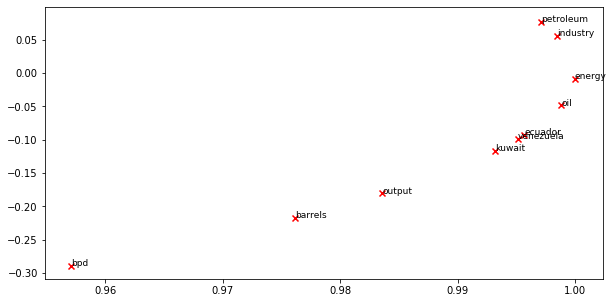

In [126]:
# -----------------------------
# Run This Cell to Produce Your Plot
# ------------------------------
reuters_corpus = read_corpus()
M_co_occurrence, word2Ind_co_occurrence = compute_co_occurrence_matrix(reuters_corpus)
M_reduced_co_occurrence = reduce_to_k_dim(M_co_occurrence, k=2)

# Rescale (normalize) the rows to make them each of unit-length
M_lengths = np.linalg.norm(M_reduced_co_occurrence, axis=1)
M_normalized = M_reduced_co_occurrence / M_lengths[:, np.newaxis] # broadcasting

words = ['barrels', 'bpd', 'ecuador', 'energy', 'industry', 'kuwait', 'oil', 'output', 'petroleum', 'venezuela']

plot_embeddings(M_normalized, word2Ind_co_occurrence, words)

#### <font color="red">Write your answer here.</font>


## Part 2: Prediction-Based Word Vectors (15 points)

As discussed in class, more recently prediction-based word vectors have demonstrated better performance, such as word2vec and GloVe (which also utilizes the benefit of counts). Here, we shall explore the embeddings produced by GloVe. Please revisit the class notes and lecture slides for more details on the word2vec and GloVe algorithms. If you're feeling adventurous, challenge yourself and try reading [GloVe's original paper](https://nlp.stanford.edu/pubs/glove.pdf).

Then run the following cells to load the GloVe vectors into memory. **Note**: If this is your first time to run these cells, i.e. download the embedding model, it will take about 15 minutes to run. If you've run these cells before, rerunning them will load the model without redownloading it, which will take about 1 to 2 minutes.

In [106]:
def load_embedding_model():
    """ Load GloVe Vectors
        Return:
            wv_from_bin: All 400000 embeddings, each lengh 200
    """
    import gensim.downloader as api
    wv_from_bin = api.load("glove-wiki-gigaword-200")
    print("Loaded vocab size %i" % len(wv_from_bin.vocab.keys()))
    return wv_from_bin

In [107]:
# -----------------------------------
# Run Cell to Load Word Vectors
# Note: This will take several minutes
# -----------------------------------
wv_from_bin = load_embedding_model()

[==================================================] 100.0% 252.1/252.1MB downloaded
Loaded vocab size 400000


#### Note: If you are receiving reset by peer error, rerun the cell to restart the download. 

### Reducing dimensionality of Word Embeddings
Let's directly compare the GloVe embeddings to those of the co-occurrence matrix. In order to avoid running out of memory, we will work with a sample of 10000 GloVe vectors instead.
Run the following cells to:

1. Put 10000 Glove vectors into a matrix M
2. Run reduce_to_k_dim (your Truncated SVD function) to reduce the vectors from 200-dimensional to 2-dimensional.

In [ ]:
def get_matrix_of_vectors(wv_from_bin, required_words=['barrels', 'bpd', 'ecuador', 'energy', 'industry', 'kuwait', 'oil', 'output', 'petroleum', 'venezuela']):
    """ Put the GloVe vectors into a matrix M.
        Param:
            wv_from_bin: KeyedVectors object; the 400000 GloVe vectors loaded from file
        Return:
            M: numpy matrix shape (num words, 200) containing the vectors
            word2Ind: dictionary mapping each word to its row number in M
    """
    import random
    words = list(wv_from_bin.vocab.keys())
    print("Shuffling words ...")
    random.seed(224)
    random.shuffle(words)
    words = words[:10000]
    print("Putting %i words into word2Ind and matrix M..." % len(words))
    word2Ind = {}
    M = []
    curInd = 0
    for w in words:
        try:
            M.append(wv_from_bin.word_vec(w))
            word2Ind[w] = curInd
            curInd += 1
        except KeyError:
            continue
    for w in required_words:
        if w in words:
            continue
        try:
            M.append(wv_from_bin.word_vec(w))
            word2Ind[w] = curInd
            curInd += 1
        except KeyError:
            continue
    M = np.stack(M)
    print("Done.")
    return M, word2Ind

In [ ]:
# -----------------------------------------------------------------
# Run Cell to Reduce 200-Dimensional Word Embeddings to k Dimensions
# Note: This should be quick to run
# -----------------------------------------------------------------
M, word2Ind = get_matrix_of_vectors(wv_from_bin)
M_reduced = reduce_to_k_dim(M, k=2)

# Rescale (normalize) the rows to make them each of unit-length
M_lengths = np.linalg.norm(M_reduced, axis=1)
M_reduced_normalized = M_reduced / M_lengths[:, np.newaxis] # broadcasting

**Note: If you are receiving out of memory issues on your local machine, try closing other applications to free more memory on your device. You may want to try restarting your machine so that you can free up extra memory. Then immediately run the jupyter notebook and see if you can load the word vectors properly. If you still have problems with loading the embeddings onto your local machine after this, please follow the Piazza instructions, as how to run remotely on Stanford Farmshare machines.**

### Question 2.1: GloVe Plot Analysis [written] (4 points)

Run the cell below to plot the 2D GloVe embeddings for `['barrels', 'bpd', 'ecuador', 'energy', 'industry', 'kuwait', 'oil', 'output', 'petroleum', 'venezuela']`.

What clusters together in 2-dimensional embedding space? What doesn't cluster together that you might think should have? How is the plot different from the one generated earlier from the co-occurrence matrix? What is a possible reason for causing the difference?

In [ ]:
words = ['barrels', 'bpd', 'ecuador', 'energy', 'industry', 'kuwait', 'oil', 'output', 'petroleum', 'venezuela']
plot_embeddings(M_reduced_normalized, word2Ind, words)

#### <font color="red">Write your answer here.</font>

### Cosine Similarity
Now that we have word vectors, we need a way to quantify the similarity between individual words, according to these vectors. One such metric is cosine-similarity. We will be using this to find words that are "close" and "far" from one another.

We can think of n-dimensional vectors as points in n-dimensional space. If we take this perspective [L1](http://mathworld.wolfram.com/L1-Norm.html) and [L2](http://mathworld.wolfram.com/L2-Norm.html) Distances help quantify the amount of space "we must travel" to get between these two points. Another approach is to examine the angle between two vectors. From trigonometry we know that:

<img src="./imgs/inner_product.png" width=20% style="float: center;"></img>

Instead of computing the actual angle, we can leave the similarity in terms of $similarity = cos(\Theta)$. Formally the [Cosine Similarity](https://en.wikipedia.org/wiki/Cosine_similarity) $s$ between two vectors $p$ and $q$ is defined as:

$$s = \frac{p \cdot q}{||p|| ||q||}, \textrm{ where } s \in [-1, 1] $$ 

### Question 2.2: Words with Multiple Meanings (2 points) [code + written] 
Polysemes and homonyms are words that have more than one meaning (see this [wiki page](https://en.wikipedia.org/wiki/Polysemy) to learn more about the difference between polysemes and homonyms ). Find a word with at least 2 different meanings such that the top-10 most similar words (according to cosine similarity) contain related words from *both* meanings. For example, "leaves" has both "vanishes" and "stalks" in the top 10, and "scoop" has both "handed_waffle_cone" and "lowdown". You will probably need to try several polysemous or homonymic words before you find one. Please state the word you discover and the multiple meanings that occur in the top 10. Why do you think many of the polysemous or homonymic words you tried didn't work (i.e. the top-10 most similar words only contain **one** of the meanings of the words)?

**Note**: You should use the `wv_from_bin.most_similar(word)` function to get the top 10 similar words. This function ranks all other words in the vocabulary with respect to their cosine similarity to the given word. For further assistance please check the __[GenSim documentation](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.FastTextKeyedVectors.most_similar)__.

In [ ]:
    # ------------------
    # Write your implementation here.


    # ------------------

#### <font color="red">Write your answer here.</font>

### Question 2.3: Synonyms & Antonyms (2 points) [code + written] 

When considering Cosine Similarity, it's often more convenient to think of Cosine Distance, which is simply 1 - Cosine Similarity.

Find three words (w1,w2,w3) where w1 and w2 are synonyms and w1 and w3 are antonyms, but Cosine Distance(w1,w3) < Cosine Distance(w1,w2). For example, w1="happy" is closer to w3="sad" than to w2="cheerful". 

Once you have found your example, please give a possible explanation for why this counter-intuitive result may have happened.

You should use the the `wv_from_bin.distance(w1, w2)` function here in order to compute the cosine distance between two words. Please see the __[GenSim documentation](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.FastTextKeyedVectors.distance)__ for further assistance.

In [ ]:
    # ------------------
    # Write your implementation here.


    # ------------------

#### <font color="red">Write your answer here.</font>

### Solving Analogies with Word Vectors
Word vectors have been shown to *sometimes* exhibit the ability to solve analogies. 

As an example, for the analogy "man : king :: woman : x" (read: man is to king as woman is to x), what is x?

In the cell below, we show you how to use word vectors to find x. The `most_similar` function finds words that are most similar to the words in the `positive` list and most dissimilar from the words in the `negative` list. The answer to the analogy will be the word ranked most similar (largest numerical value).

**Note:** Further Documentation on the `most_similar` function can be found within the __[GenSim documentation](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.FastTextKeyedVectors.most_similar)__.

In [ ]:
# Run this cell to answer the analogy -- man : king :: woman : x
pprint.pprint(wv_from_bin.most_similar(positive=['woman', 'king'], negative=['man']))

### Question 2.4: Finding Analogies [code + written]  (2 Points)
Find an example of analogy that holds according to these vectors (i.e. the intended word is ranked top). In your solution please state the full analogy in the form x:y :: a:b. If you believe the analogy is complicated, explain why the analogy holds in one or two sentences.

**Note**: You may have to try many analogies to find one that works!

In [ ]:
    # ------------------
    # Write your implementation here.


    # ------------------

#### <font color="red">Write your answer here.</font>

### Question 2.5: Incorrect Analogy [code + written] (1 point)
Find an example of analogy that does *not* hold according to these vectors. In your solution, state the intended analogy in the form x:y :: a:b, and state the (incorrect) value of b according to the word vectors.

In [ ]:
    # ------------------
    # Write your implementation here.


    # ------------------

#### <font color="red">Write your answer here.</font>

### Question 2.6: Guided Analysis of Bias in Word Vectors [written] (1 point)

It's important to be cognizant of the biases (gender, race, sexual orientation etc.) implicit in our word embeddings. Bias can be dangerous because it can reinforce stereotypes through applications that employ these models.

Run the cell below, to examine (a) which terms are most similar to "woman" and "worker" and most dissimilar to "man", and (b) which terms are most similar to "man" and "worker" and most dissimilar to "woman". Point out the difference between the list of female-associated words and the list of male-associated words, and explain how it is reflecting gender bias.

In [ ]:
# Run this cell
# Here `positive` indicates the list of words to be similar to and `negative` indicates the list of words to be
# most dissimilar from.
pprint.pprint(wv_from_bin.most_similar(positive=['woman', 'worker'], negative=['man']))
print()
pprint.pprint(wv_from_bin.most_similar(positive=['man', 'worker'], negative=['woman']))

#### <font color="red">Write your answer here.</font>

### Question 2.7: Independent Analysis of Bias in Word Vectors [code + written]  (1 point)

Use the `most_similar` function to find another case where some bias is exhibited by the vectors. Please briefly explain the example of bias that you discover.

In [ ]:
    # ------------------
    # Write your implementation here.


    # ------------------

#### <font color="red">Write your answer here.</font>

### Question 2.8: Thinking About Bias [written] (2 points)

What might be the causes of these biases in the word vectors? You should give least 2 explainations how bias get into the word vectors. How might you be able to investigate/test these causes?

#### <font color="red">Write your answer here.</font>

# <font color="blue"> Submission Instructions</font>

1. Click the Save button at the top of the Jupyter Notebook.
2. Select Cell -> All Output -> Clear. This will clear all the outputs from all cells (but will keep the content of all cells). 
2. Select Cell -> Run All. This will run all the cells in order, and will take several minutes.
3. Once you've rerun everything, select File -> Download as -> PDF via LaTeX (If you have trouble using "PDF via LaTex", you can also save the webpage as pdf. <font color='blue'> Make sure all your solutions especially the coding parts are displayed in the pdf</font>, it's okay if the provided codes get cut off because lines are not wrapped in code cells).
4. Look at the PDF file and make sure all your solutions are there, displayed correctly. The PDF is the only thing your graders will see!
5. Submit your PDF on Gradescope.